# Cambria USA Clustering Analysis

Authored by Max Grabowski

We aim to understand the distinct behaviors and needs of primary user types: trade visitors, end users, and everything in between. Currently, we lack detailed insights into how these groups interact differently with our website. This segmentation will enable us to customize our marketing strategies, improve user experience, and ultimately, boost conversions and customer satisfaction.

#### Import Libraries

In [ ]:
%reload_ext watermark

# Nessessary Installations
!pip install plotnine

# Basic Libraries
import pandas as pd
import numpy as np
import datetime as dt 

# Visualization Libraries
from plotnine import *
import plotnine
import plotnine as p9
import matplotlib 
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns

# Clustering Libraries
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import silhouette_score

# Mapping
import folium
from folium.plugins import MarkerCluster
import branca.colormap as cm
import geopandas as gpd
from shapely import wkt
import json

# Ignore warnings
import warnings
warnings.filterwarnings('ignore', category = FutureWarning)

# Format scientific notation from Pandas
pd.set_option('display.float_format', lambda x: '%.3f' % x)

print("Import Libraries - Complete")

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
Import Libraries - Complete


## Big Query Integration 

### 'Client' Data Table

In [ ]:
df = _deepnote_execute_sql('SELECT *\nFROM `analytics_329819782`.`skunkworks_client_level`\nWHERE formatted_first_touch > \'2023-04-29 00:00:00\'\nORDER BY RAND()\nLIMIT 25000;', 'SQL_EE59AD05_5F8F_4CEE_B752_EA3517424264', audit_sql_comment='', sql_cache_mode='cache_disabled')
df

,client_id,country,state,city,device,brand_name,model_name,operating_system,operating_system_version,total_event_count,...,formatted_engagement_time,avg_pageviews_per_session,engagement_rate,bounces,bounce_rate,avg_time_on_pro_pages,avg_time_on_design_pages,avg_time_on_decision_pages,avg_time_on_loyalty_pages,engagement_level
0,504723265,United States,Michigan,Grand Blanc Township,desktop,Google,Chrome,Windows,Windows 10,9,...,00:00:18,1.000,12.5%,7,87.5%,NaN,2.242,NaN,2.242,Low Engaged on Design Pages
1,660995750,United States,West Virginia,Philadelphia,mobile,Apple,iPhone,iOS,iOS 16.4.1,13,...,00:00:00,0.890,0%,9,100%,NaN,NaN,NaN,NaN,Less Engaged
2,2111695743,United States,Montana,Anaconda,mobile,Apple,iPhone,iOS,iOS 16.4.1,3,...,None,1.000,0%,2,100%,NaN,NaN,NaN,NaN,Less Engaged
3,813309707,United States,Delaware,Seaford,mobile,Apple,iPhone,iOS,iOS 16.2,37,...,None,1.180,0%,11,100%,NaN,NaN,NaN,NaN,Less Engaged
4,589981771,United States,Virginia,Ashburn,mobile,Apple,iPhone,iOS,iOS 16.5.1,3,...,None,0.500,0%,2,100%,NaN,NaN,NaN,NaN,Less Engaged
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,1841670845,United States,Illinois,Chicago,mobile,Apple,iPhone,iOS,iOS 16.4,7,...,00:00:00,1.000,0%,3,100%,NaN,NaN,0.001,NaN,Less Engaged
24996,534569602,United States,New York,New York,mobile,Apple,iPhone,iOS,iOS 16.4.1,4,...,None,1.000,0%,2,100%,NaN,NaN,NaN,NaN,Less Engaged
24997,1412494103,United States,Louisiana,Covington,mobile,Apple,iPhone,iOS,iOS 16.4.1,4,...,None,1.000,0%,2,100%,NaN,NaN,NaN,NaN,Less Engaged
24998,1990433176,United States,New Jersey,North Brunswick Township,mobile,Apple,iPhone,iOS,iOS 16.5,5,...,00:00:00,1.000,0%,3,100%,NaN,NaN,NaN,NaN,Less Engaged


In [ ]:
# Save data as a CSV
#df.to_csv('bq_clienttable.csv', index=False)

In [ ]:
# Read data as a CSV
#df_bq_client = pd.read_csv('bq_clienttable.csv')  

## Data Inspection

In [ ]:
# Display the first few rows
df.head()

,client_id,country,state,city,device,brand_name,model_name,operating_system,operating_system_version,total_event_count,...,formatted_engagement_time,avg_pageviews_per_session,engagement_rate,bounces,bounce_rate,avg_time_on_pro_pages,avg_time_on_design_pages,avg_time_on_decision_pages,avg_time_on_loyalty_pages,engagement_level
0,504723265,United States,Michigan,Grand Blanc Township,desktop,Google,Chrome,Windows,Windows 10,9,...,00:00:18,1.000,12.5%,7,87.5%,NaN,2.242,NaN,2.242,Low Engaged on Design Pages
1,660995750,United States,West Virginia,Philadelphia,mobile,Apple,iPhone,iOS,iOS 16.4.1,13,...,00:00:00,0.890,0%,9,100%,NaN,NaN,NaN,NaN,Less Engaged
2,2111695743,United States,Montana,Anaconda,mobile,Apple,iPhone,iOS,iOS 16.4.1,3,...,None,1.000,0%,2,100%,NaN,NaN,NaN,NaN,Less Engaged
3,813309707,United States,Delaware,Seaford,mobile,Apple,iPhone,iOS,iOS 16.2,37,...,None,1.180,0%,11,100%,NaN,NaN,NaN,NaN,Less Engaged
4,589981771,United States,Virginia,Ashburn,mobile,Apple,iPhone,iOS,iOS 16.5.1,3,...,None,0.500,0%,2,100%,NaN,NaN,NaN,NaN,Less Engaged


The dataset contains 56 columns. Here is a brief summary of the first few rows:

client_id: This seems to be a unique identifier for each client. Some values are NaN, indicating missing data.
country: This is the country in which the client is located.
state: This is the state in which the client is located.
city: This is the city in which the client is located.
device: This indicates the device type (e.g., mobile, desktop) used by the client.
brand_name: This indicates the brand of the device used by the client.
model_name: This indicates the model of the device used by the client.
operating_system: This indicates the operating system of the device used by the client.
operating_system_version: This indicates the version of the operating system of the device used by the client.
total_event_count: This indicates the total number of events associated with the client.
...: There are numerous other columns, including various metrics related to the user's engagement, bounce rate, average time spent on different types of pages, and a categorical variable indicating the level of engagement.

In [ ]:
# Check the data types
data_types = df.dtypes

# Check for missing data
missing_values = df.isna().sum()

# Combine the data types and missing values into a single dataframe for easier viewing
data_info = pd.DataFrame({'Data Type': data_types, 'Missing Values': missing_values})

print(data_info)

                                                      Data Type  \
client_id                                                object   
country                                                  object   
state                                                    object   
city                                                     object   
device                                                   object   
brand_name                                               object   
model_name                                               object   
operating_system                                         object   
operating_system_version                                 object   
total_event_count                                         int64   
first_touch                                 datetime64[ns, UTC]   
total_sessions                                            int64   
total_pageviews                                           int64   
total_purchases                                           int6

The dataset contains both numerical and categorical variables. Some variables, such as client_id, state, city, brand_name, and country, have missing values that we might need to handle depending on our analysis.

For numerical features, we can generate histograms or boxplots to understand their distribution. For categorical features, we can use bar plots or pie charts to visualize the number of occurrences for each category.

Correlation heatmaps might be useful for understanding the relationships between numerical features. However, keep in mind that clustering algorithms such as K-Means work based on distances between data points in a multi-dimensional space, and correlations may not always provide useful insights for such algorithms.

Before we proceed with the visualization, it might be useful to deal with the missing values. Depending on the nature of the missing data, we could either fill them with a default value, use a method like mean or median imputation, or drop the rows/columns with missing values altogether. The strategy would depend on the context and the amount of missing data.

Considering the size of the dataset and the fact that we're only performing exploratory data analysis at this stage, I suggest we drop the rows with missing values for the sake of simplicity.

In [ ]:
# Clean DataFrame (DF)
# Drop rows with missing or incorrect data in specific columns
specified_columns = ['client_id', 'country', 'state', 'city', 'device', 'brand_name', 'model_name', 'operating_system', 'operating_system_version']
cleaned_data = df.dropna(subset=specified_columns)
cleaned_data = cleaned_data[cleaned_data['client_id'].str.contains('5cae7f02-c26e-478e-8519-dbf3452199ab')==False]
##cleaned_data['client_id'] = cleaned_data['client_id'].str.split('.', expand=True)[0]

# Format Data
cleaned_data['formatted_engagement_time'] = pd.to_timedelta(cleaned_data['formatted_engagement_time']).dt.total_seconds()
cleaned_data['engagement_rate'] = cleaned_data['engagement_rate'].replace('%','',regex=True).astype('float') / 100.0
cleaned_data['bounce_rate'] = cleaned_data['bounce_rate'].replace('%','',regex=True).astype('float') / 100.0

# Replace missing data in other columns with '0'
cleaned_data = cleaned_data.fillna(0)

# Filter to Only United States
cleaned_data = cleaned_data[cleaned_data['country'] == 'United States']

# Display the first few rows of the cleaned data
cleaned_data

,client_id,country,state,city,device,brand_name,model_name,operating_system,operating_system_version,total_event_count,...,formatted_engagement_time,avg_pageviews_per_session,engagement_rate,bounces,bounce_rate,avg_time_on_pro_pages,avg_time_on_design_pages,avg_time_on_decision_pages,avg_time_on_loyalty_pages,engagement_level
0,504723265,United States,Michigan,Grand Blanc Township,desktop,Google,Chrome,Windows,Windows 10,9,...,18.000,1.000,0.125,7,0.875,0.000,2.242,0.000,2.242,Low Engaged on Design Pages
1,660995750,United States,West Virginia,Philadelphia,mobile,Apple,iPhone,iOS,iOS 16.4.1,13,...,0.000,0.890,0.000,9,1.000,0.000,0.000,0.000,0.000,Less Engaged
2,2111695743,United States,Montana,Anaconda,mobile,Apple,iPhone,iOS,iOS 16.4.1,3,...,0.000,1.000,0.000,2,1.000,0.000,0.000,0.000,0.000,Less Engaged
3,813309707,United States,Delaware,Seaford,mobile,Apple,iPhone,iOS,iOS 16.2,37,...,0.000,1.180,0.000,11,1.000,0.000,0.000,0.000,0.000,Less Engaged
4,589981771,United States,Virginia,Ashburn,mobile,Apple,iPhone,iOS,iOS 16.5.1,3,...,0.000,0.500,0.000,2,1.000,0.000,0.000,0.000,0.000,Less Engaged
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24995,1841670845,United States,Illinois,Chicago,mobile,Apple,iPhone,iOS,iOS 16.4,7,...,0.000,1.000,0.000,3,1.000,0.000,0.000,0.001,0.000,Less Engaged
24996,534569602,United States,New York,New York,mobile,Apple,iPhone,iOS,iOS 16.4.1,4,...,0.000,1.000,0.000,2,1.000,0.000,0.000,0.000,0.000,Less Engaged
24997,1412494103,United States,Louisiana,Covington,mobile,Apple,iPhone,iOS,iOS 16.4.1,4,...,0.000,1.000,0.000,2,1.000,0.000,0.000,0.000,0.000,Less Engaged
24998,1990433176,United States,New Jersey,North Brunswick Township,mobile,Apple,iPhone,iOS,iOS 16.5,5,...,0.000,1.000,0.000,3,1.000,0.000,0.000,0.000,0.000,Less Engaged


In [ ]:
# Inspect the data type
cleaned_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21691 entries, 0 to 24999
Data columns (total 58 columns):
 #   Column                                      Non-Null Count  Dtype              
---  ------                                      --------------  -----              
 0   client_id                                   21691 non-null  object             
 1   country                                     21691 non-null  object             
 2   state                                       21691 non-null  object             
 3   city                                        21691 non-null  object             
 4   device                                      21691 non-null  object             
 5   brand_name                                  21691 non-null  object             
 6   model_name                                  21691 non-null  object             
 7   operating_system                            21691 non-null  object             
 8   operating_system_version            

In [ ]:
# Inspect the categorical variables
cleaned_data.select_dtypes('object').nunique()

client_id                   21691
country                         1
state                          64
city                         3632
device                          3
brand_name                     43
model_name                    493
operating_system                6
operating_system_version      147
formatted_first_touch       21554
engagement_level               13
dtype: int64

In [ ]:
# Inspect the numerical variables
cleaned_data.describe()

,total_event_count,total_sessions,total_pageviews,total_purchases,total_trade_lead_form_submit,total_residentialconsumer_lead_form_submit,total_contactus_form_submit,total_dealerlocator_pageviews,total_professionals_pageviews,total_commercial_pageviews,...,engaged_sessions,formatted_engagement_time,avg_pageviews_per_session,engagement_rate,bounces,bounce_rate,avg_time_on_pro_pages,avg_time_on_design_pages,avg_time_on_decision_pages,avg_time_on_loyalty_pages
count,21691.000,21691.000,21691.000,21691.000,21691.000,21691.000,21691.000,21691.000,21691.000,21691.000,...,21691.000,21691.000,21691.000,21691.000,21691.000,21691.000,21691.000,21691.000,21691.000,21691.000
mean,6.798,3.985,4.859,0.003,0.004,0.002,0.002,0.497,0.008,0.002,...,0.480,25.326,1.091,0.034,3.505,0.966,0.020,0.974,0.453,0.124
std,15.323,9.388,14.038,0.058,0.148,0.122,0.071,0.897,0.189,0.062,...,2.564,221.508,0.651,0.107,7.740,0.107,0.484,4.543,2.569,1.656
min,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000,0.000
50%,3.000,2.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,1.000,0.000,2.000,1.000,0.000,0.000,0.000,0.000
75%,6.000,3.000,4.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,...,0.000,0.000,1.000,0.000,3.000,1.000,0.000,0.000,0.002,0.000
max,941.000,454.000,909.000,3.000,16.000,17.000,5.000,36.000,16.000,4.000,...,186.000,24208.000,40.000,1.000,451.000,1.000,25.848,241.701,117.192,72.289


# EDA

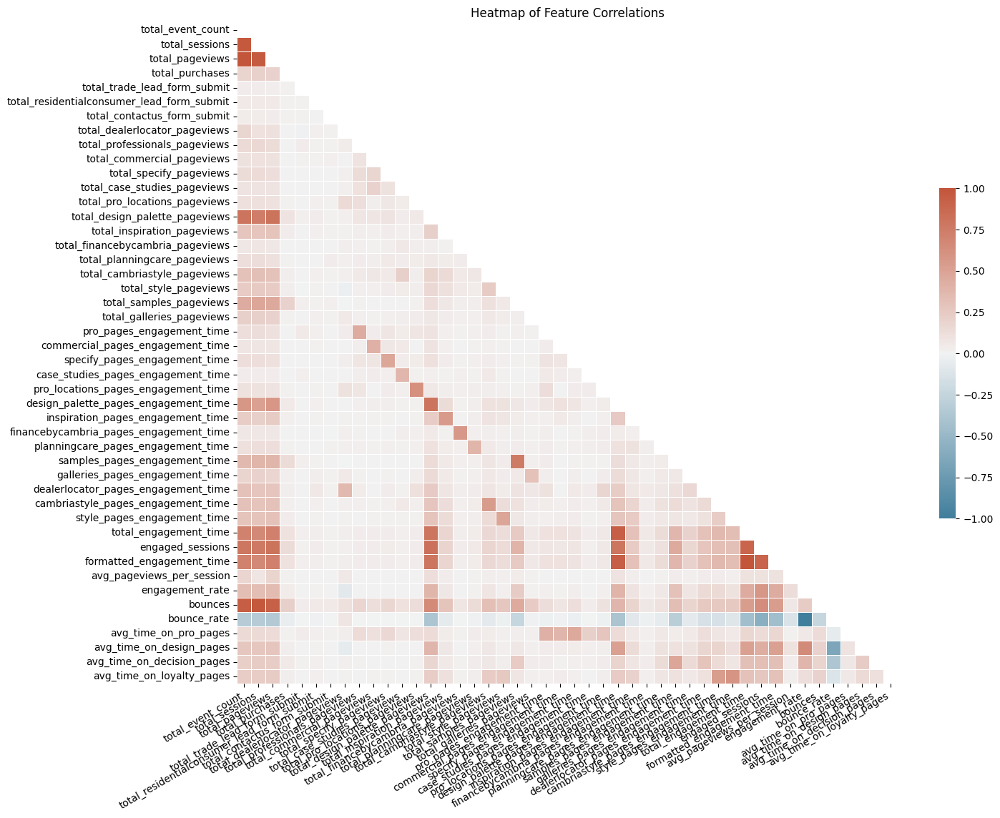

In [ ]:
# Select only numeric columns from the DataFrame
numeric_cols = cleaned_data.select_dtypes(include=[np.number])

# Compute the correlation matrix
corr_matrix = numeric_cols.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(15, 12))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=False)

plt.title('Heatmap of Feature Correlations')
plt.xticks(rotation=30, horizontalalignment='right')
plt.show()

Heatmap of Feature Correlations: This heatmap shows the correlations between the numerical features in the dataset. Lighter colors indicate a strong positive correlation, while darker colors indicate a strong negative correlation. It's important to note that correlation does not imply causation, and these correlations might not necessarily be helpful for clustering purposes.

# Categorical EDA

## Geo Location

We started by creating datasets based on geographical location, and because my focus is on the United States I filtered the country column to the United States only. 

In [ ]:
df_country = cleaned_data.groupby('country').agg({
    'country': 'count',
    'total_event_count': 'mean',
    'total_sessions': 'mean',
    'total_pageviews': 'mean',
    'total_purchases': 'mean',
    'total_trade_lead_form_submit': 'mean',
    'total_residentialconsumer_lead_form_submit': 'mean',
    'total_contactus_form_submit': 'mean',
    'total_engagement_time': 'mean',
    'engaged_sessions': 'mean',
    'bounces': 'mean',
    'avg_pageviews_per_session': 'mean',   
}).rename(columns={'country': 'total'}).reset_index().sort_values('total', ascending=True)

#Calculated Fields
df_country['bounce_rate'] = df_country['bounces']/df_country['total_sessions']
df_country['avg_pageviews_per_session'] = df_country['total_pageviews']/df_country['total_sessions']
df_country['engagement_rate'] = df_country['engaged_sessions']/df_country['total_sessions']
df_country['converted_engagement_time'] = pd.to_datetime(df_country['total_engagement_time'], unit='s').dt.strftime("%H:%M:%S")
df_country

NameError: name 'cleaned_data' is not defined

In [ ]:
df_state = pd.DataFrame(cleaned_data['state'].value_counts()).reset_index()
df_state.rename(columns={'state': 'total'}, inplace=True)
df_state = df_state.sort_values('total', ascending=True).reset_index(drop=True)
df_state = cleaned_data.groupby(['country','state']).agg({
    'state': 'count',
    'total_event_count': 'mean',
    'total_sessions': 'mean',
    'total_pageviews': 'mean',
    'total_purchases': 'mean',
    'total_trade_lead_form_submit' : 'mean',
    'total_residentialconsumer_lead_form_submit' : 'mean',
    'total_contactus_form_submit' : 'mean',
    'total_engagement_time' : 'mean',
    'engaged_sessions' : 'mean',
    #'formatted_engagement_time' : 'mean',
    'avg_pageviews_per_session' : 'mean',
    #'engagement_rate' : 'mean',
    'bounces' : 'mean',
    #'bounce_rate' : 'mean'
}).rename(columns={'state': 'total'}).reset_index().sort_values('total', ascending=True)
df_state.rename(columns={'state': 'total', 'country': 'country'}, inplace=True)

#Calculated Fields
df_state['bounce_rate'] = df_country['bounces']/df_country['total_sessions']
df_state['avg_pageviews_per_session'] = df_country['total_pageviews']/df_country['total_sessions']
df_state['engagement_rate'] = df_country['engaged_sessions']/df_country['total_sessions']
df_state['converted_engagement_time'] = pd.to_datetime(df_country['total_engagement_time'], unit='s').dt.strftime("%H:%M:%S")

df_state

,country,total,total,total_event_count,total_sessions,total_pageviews,total_purchases,total_trade_lead_form_submit,total_residentialconsumer_lead_form_submit,total_contactus_form_submit,total_engagement_time,engaged_sessions,avg_pageviews_per_session,bounces,bounce_rate,engagement_rate,converted_engagement_time
173,United States,Zeeland,1,6.000,4.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,4.000,NaN,NaN,NaN
85,United States,Pembroke Parish,1,18.000,11.000,14.000,0.000,0.000,0.000,0.000,9.896,0.000,NaN,11.000,NaN,NaN,NaN
84,United States,Ouest Department,1,5.000,3.000,3.000,0.000,0.000,0.000,0.000,0.003,0.000,NaN,3.000,NaN,NaN,NaN
83,United States,Otago,1,94.000,69.000,85.000,0.000,0.000,0.000,0.000,258.218,10.000,NaN,59.000,NaN,NaN,NaN
134,United States,Tel Aviv District,1,11.000,7.000,9.000,0.000,0.000,0.000,0.000,0.746,0.000,NaN,7.000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154,United States,Virginia,31479,8.123,4.964,6.042,0.005,0.002,0.001,0.001,34.958,0.692,NaN,4.271,NaN,NaN,NaN
18,United States,Florida,36658,7.230,4.378,5.378,0.003,0.006,0.001,0.003,27.108,0.520,NaN,3.858,NaN,NaN,NaN
65,United States,New York,40596,6.884,3.724,4.825,0.003,0.003,0.001,0.002,20.906,0.400,NaN,3.324,NaN,NaN,NaN
137,United States,Texas,44899,6.947,4.087,4.906,0.002,0.005,0.001,0.001,24.621,0.473,NaN,3.614,NaN,NaN,NaN


grouping users dimension means by operating system

In [ ]:
df_ops_mean = cleaned_data.groupby('operating_system').agg({
    'device': 'count',
    'total_event_count': 'mean',
    'total_sessions': 'mean',
    'total_pageviews': 'mean',
    'total_purchases': 'mean',
    'total_trade_lead_form_submit' : 'mean',
    'total_residentialconsumer_lead_form_submit' : 'mean',
    'total_contactus_form_submit' : 'mean',   
    'total_engagement_time' : 'mean',
    'engaged_sessions' : 'mean',
    'avg_pageviews_per_session' : 'mean',
    'bounces': 'mean',
}).rename(columns={'device': 'Total'}).reset_index().sort_values('Total', ascending=True)

df_ops_mean.rename(columns={'device': 'Total'}, inplace=True)
df_ops_mean.sort_values('Total', ascending=False, inplace=True)
#Calculated Fields
df_ops_mean['bounce_rate'] = df_country['bounces']/df_country['total_sessions']
df_ops_mean['avg_pageviews_per_session'] = df_country['total_pageviews']/df_country['total_sessions']
df_ops_mean['engagement_rate'] = df_country['engaged_sessions']/df_country['total_sessions']
df_ops_mean['converted_engagement_time'] = pd.to_datetime(df_country['total_engagement_time'], unit='s').dt.strftime("%H:%M:%S")

df_ops_mean


,operating_system,Total,total_event_count,total_sessions,total_pageviews,total_purchases,total_trade_lead_form_submit,total_residentialconsumer_lead_form_submit,total_contactus_form_submit,total_engagement_time,engaged_sessions,avg_pageviews_per_session,bounces,bounce_rate,engagement_rate,converted_engagement_time
10,iOS,347217,5.224,2.893,3.357,0.001,0.002,0.001,0.000,13.737,0.293,NaN,2.600,NaN,NaN,NaN
8,Windows,87638,10.892,7.128,8.741,0.005,0.007,0.002,0.007,46.532,0.844,NaN,6.284,NaN,NaN,NaN
0,Android,72514,5.868,3.104,4.052,0.001,0.009,0.001,0.001,16.801,0.332,1.216,2.771,0.882,0.118,00:00:24
5,Macintosh,67978,10.281,6.473,8.292,0.006,0.004,0.002,0.003,57.090,1.023,NaN,5.450,NaN,NaN,NaN
4,Linux,1487,4.580,2.672,3.226,0.001,0.001,0.000,0.000,11.397,0.203,NaN,2.469,NaN,NaN,NaN
2,Chrome OS,1312,11.094,7.208,9.134,0.005,0.000,0.004,0.007,81.814,1.294,NaN,5.914,NaN,NaN,NaN
9,Xbox,3,2.667,1.667,1.667,0.000,0.000,0.000,0.000,0.018,0.000,NaN,1.667,NaN,NaN,NaN
6,Playstation 4,2,4.000,1.500,3.000,0.000,0.000,0.000,0.000,0.032,0.000,NaN,1.500,NaN,NaN,NaN
1,BlackBerry,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.144,0.000,NaN,1.000,NaN,NaN,NaN
3,Fuchsia,1,2.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,1.000,NaN,NaN,NaN


Grouping by operating system with total dimensions to create visuals

In [ ]:
df_ops = pd.DataFrame(cleaned_data['device'].value_counts()).reset_index()
df_ops.rename(columns = {'index':'device', 'device':'Total'}, inplace = True)
df_region = df_ops.sort_values('Total', ascending = True).reset_index(drop = True)
# The dataframe
df_ops = cleaned_data.groupby('operating_system').agg({
    'device': 'count',
    'total_event_count': 'mean',
    'total_sessions': 'mean',
    'total_pageviews': 'mean',
    'total_purchases': 'mean',
   'total_trade_lead_form_submit' : 'mean',
    'total_residentialconsumer_lead_form_submit' : 'mean',
    'total_contactus_form_submit' : 'mean',   
    'total_engagement_time' : 'mean',
    'engaged_sessions' : 'mean',
    'avg_pageviews_per_session' : 'mean',
    'bounces': 'mean',

}).rename(columns={'device': 'total'}).reset_index().sort_values('total', ascending=True)
#Calculated Fields
df_ops['bounce_rate'] = df_country['bounces']/df_country['total_sessions']
df_ops['avg_pageviews_per_session'] = df_country['total_pageviews']/df_country['total_sessions']
df_ops['engagement_rate'] = df_country['engaged_sessions']/df_country['total_sessions']
df_ops['converted_engagement_time'] = pd.to_datetime(df_country['total_engagement_time'], unit='s').dt.strftime("%H:%M:%S")

df_ops

,operating_system,total,total_event_count,total_sessions,total_pageviews,total_purchases,total_trade_lead_form_submit,total_residentialconsumer_lead_form_submit,total_contactus_form_submit,total_engagement_time,engaged_sessions,avg_pageviews_per_session,bounces,bounce_rate,engagement_rate,converted_engagement_time
1,BlackBerry,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.144,0.000,NaN,1.000,NaN,NaN,NaN
3,Fuchsia,1,2.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,1.000,NaN,NaN,NaN
7,SymbianOS,1,2.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,1.000,NaN,NaN,NaN
6,Playstation 4,2,4.000,1.500,3.000,0.000,0.000,0.000,0.000,0.032,0.000,NaN,1.500,NaN,NaN,NaN
9,Xbox,3,2.667,1.667,1.667,0.000,0.000,0.000,0.000,0.018,0.000,NaN,1.667,NaN,NaN,NaN
2,Chrome OS,1312,11.094,7.208,9.134,0.005,0.000,0.004,0.007,81.814,1.294,NaN,5.914,NaN,NaN,NaN
4,Linux,1487,4.580,2.672,3.226,0.001,0.001,0.000,0.000,11.397,0.203,NaN,2.469,NaN,NaN,NaN
5,Macintosh,67978,10.281,6.473,8.292,0.006,0.004,0.002,0.003,57.090,1.023,NaN,5.450,NaN,NaN,NaN
0,Android,72514,5.868,3.104,4.052,0.001,0.009,0.001,0.001,16.801,0.332,1.216,2.771,0.882,0.118,00:00:24
8,Windows,87638,10.892,7.128,8.741,0.005,0.007,0.002,0.007,46.532,0.844,NaN,6.284,NaN,NaN,NaN


In [ ]:
df_device = pd.DataFrame(cleaned_data['device'].value_counts()).reset_index()
df_device.rename(columns = {'index':'device', 'device':'Total'}, inplace = True)
df_device = df_device.sort_values('Total', ascending = True).reset_index(drop = True)
# The dataframe
df_device = cleaned_data.groupby('device').agg({
    'device': 'count',
    'total_event_count': 'sum',
    'total_sessions': 'sum',
    'total_pageviews': 'sum',
    'total_purchases': 'sum',

}).rename(columns={'device': 'total'}).reset_index().sort_values('total', ascending=True)

df_device

,device,total,total_event_count,total_sessions,total_pageviews,total_purchases
2,smart tv,10,28,14,17,0
3,tablet,19483,156002,99959,125748,64
0,desktop,158244,1671121,1075928,1343532,874
1,mobile,400417,2087102,1131722,1336660,516


Dataset grouping mean metrics by Device

In [ ]:
df_device_mean = pd.DataFrame(cleaned_data['device'].value_counts()).reset_index()
df_device_mean.rename(columns = {'index':'device', 'device':'Total'}, inplace = True)
df_device_mean = df_device_mean.sort_values('Total', ascending = True).reset_index(drop = True)
# The dataframe
df_device_mean = cleaned_data.groupby('device').agg({
    'device': 'count',
    'total_event_count': 'mean',
    'total_sessions': 'mean',
    'total_pageviews': 'mean',
    'total_purchases': 'mean',

}).rename(columns={'device': 'total'}).reset_index().sort_values('total', ascending=True)

df_device_mean

,device,total,total_event_count,total_sessions,total_pageviews,total_purchases
2,smart tv,10,2.800,1.400,1.700,0.000
3,tablet,19483,8.007,5.131,6.454,0.003
0,desktop,158244,10.560,6.799,8.490,0.006
1,mobile,400417,5.212,2.826,3.338,0.001


## Visuals to show CUSA users operating system and device type

After grouping by the necessary columns to create new datasets I created bar charts to dive deeper into understanding the categorical data. first grouping the data by Operating System, and then by Device type.

- Device with the highest average total event count, pageviews, and sessions: Desktops

- Browser with the highest average  total event count, pageviews, and sessions:  Tizen browser  (Samsung) 

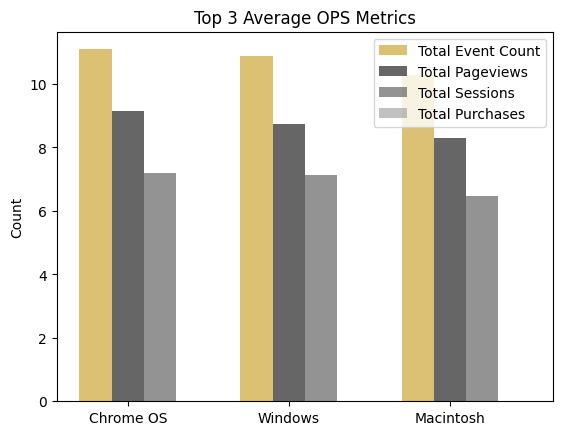

In [ ]:

sortedops_df = df_ops_mean.sort_values(by='total_event_count', ascending=False)

# Select the top three rows based on the sorted metric
top_three_ops = sortedops_df.head(3)

# Extract the required data
operating_systems = top_three_ops['operating_system']
total_event_count = top_three_ops['total_event_count']
total_pageviews = top_three_ops['total_pageviews']
total_sessions = top_three_ops['total_sessions']
total_purchases = top_three_ops['total_purchases']

# Set the positions for the bars on the x-axis
x = np.arange(len(operating_systems))

width = 0.2

fig, ax = plt.subplots()

# Plot the bars for each metric
ax.bar(x - width, total_event_count, width, label='Total Event Count', color='#c59617', alpha=0.6)
ax.bar(x, total_pageviews, width, label='Total Pageviews', color='#000000', alpha=0.6)
ax.bar(x + width, total_sessions, width, label='Total Sessions', color='#4c4c4c', alpha=0.6)
ax.bar(x + (2 * width), total_purchases, width, label='Total Purchases', color='#999999', alpha=0.6)

# Set the x-axis tick positions and labels
ax.set_xticks(x)
ax.set_xticklabels(operating_systems)

# Set the y-axis label
ax.set_ylabel('Count')

# Set the chart title
ax.set_title('Top 3 Average OPS Metrics')

# Add a legend
ax.legend()

# Show the chart
plt.show()

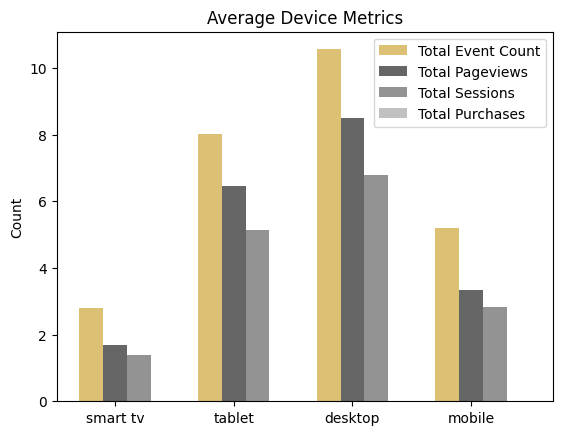

In [ ]:
device_names = df_device_mean['device']
total_event_count = df_device_mean['total_event_count']
total_pageviews = df_device_mean['total_pageviews']
total_sessions = df_device_mean['total_sessions']
total_purchases = df_device_mean['total_purchases']

x = np.arange(len(device_names))

width = 0.2

fig, ax = plt.subplots()

ax.bar(x - width, total_event_count, width, label='Total Event Count', color='#c59617', alpha=0.6)
ax.bar(x, total_pageviews, width, label='Total Pageviews', color='#000000', alpha=0.6)
ax.bar(x + width, total_sessions, width, label='Total Sessions', color='#4c4c4c', alpha=0.6)
ax.bar(x + (2 * width), total_purchases, width, label='Total Purchases', color='#999999', alpha=0.6)

ax.set_xticks(x)
ax.set_xticklabels(device_names)

ax.set_ylabel('Count')
ax.set_title('Average Device Metrics')

ax.legend()

plt.show()


We see that desktops have the highest average total event count, pageviews, and sessions. 

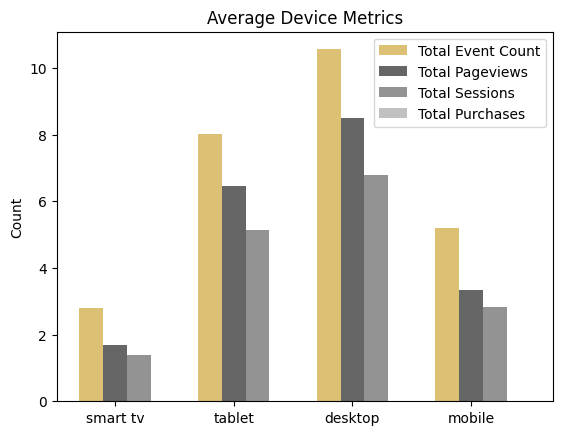

In [ ]:
device_names = df_device_mean['device']
total_event_count = df_device_mean['total_event_count']
total_pageviews = df_device_mean['total_pageviews']
total_sessions = df_device_mean['total_sessions']
total_purchases = df_device_mean['total_purchases']

x = np.arange(len(device_names))

width = 0.2

fig, ax = plt.subplots()

ax.bar(x - width, total_event_count, width, label='Total Event Count', color='#c59617', alpha=0.6)
ax.bar(x, total_pageviews, width, label='Total Pageviews', color='#000000', alpha=0.6)
ax.bar(x + width, total_sessions, width, label='Total Sessions', color='#4c4c4c', alpha=0.6)
ax.bar(x + (2 * width), total_purchases, width, label='Total Purchases', color='#999999', alpha=0.6)

ax.set_xticks(x)
ax.set_xticklabels(device_names)

ax.set_ylabel('Count')
ax.set_title('Average Device Metrics')

ax.legend()

plt.show()

##### Consider adding some of the web metrics along side device information***

## Brand Name

In [ ]:
df_brand_name = cleaned_data.groupby('brand_name').agg({
    'brand_name': 'count',
    'total_event_count': 'sum',
    'total_sessions': 'sum',
    'total_pageviews': 'sum',
    'total_purchases': 'sum',  
    'total_trade_lead_form_submit' : 'mean',
    'total_residentialconsumer_lead_form_submit' : 'mean',
    'total_contactus_form_submit' : 'mean',
    'total_engagement_time' : 'mean',
    'engaged_sessions' : 'mean',
    #'formatted_engagement_time' : 'mean',
    'avg_pageviews_per_session' : 'mean',
    #'engagement_rate' : 'mean',
    'bounces' : 'mean',
    #'bounce_rate' : 'mean'
}).rename(columns={'brand_name': 'Total'}).reset_index().sort_values('Total', ascending=True)
#Calculated Fields
df_brand_name['bounce_rate'] = df_country['bounces']/df_country['total_sessions']
df_brand_name['avg_pageviews_per_session'] = df_country['total_pageviews']/df_country['total_sessions']
df_brand_name['engagement_rate'] = df_country['engaged_sessions']/df_country['total_sessions']
df_brand_name['converted_engagement_time'] = pd.to_datetime(df_country['total_engagement_time'], unit='s').dt.strftime("%H:%M:%S")

df_brand_name

,brand_name,Total,total_event_count,total_sessions,total_pageviews,total_purchases,total_trade_lead_form_submit,total_residentialconsumer_lead_form_submit,total_contactus_form_submit,total_engagement_time,engaged_sessions,avg_pageviews_per_session,bounces,bounce_rate,engagement_rate,converted_engagement_time
0,AGM,1,3,2,2,0,0.000,0.000,0.000,0.000,0.000,1.216,2.000,0.882,0.118,00:00:24
33,Flexymove,1,3,1,1,0,0.000,0.000,0.000,0.000,0.000,NaN,1.000,NaN,NaN,NaN
34,Fujitsu,1,3,1,1,0,0.000,0.000,0.000,0.000,0.000,NaN,1.000,NaN,NaN,NaN
43,Jio,1,3,1,1,0,0.000,0.000,0.000,0.030,0.000,NaN,1.000,NaN,NaN,NaN
45,Karbonn,1,3,2,2,0,0.000,0.000,0.000,1.004,0.000,NaN,2.000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,Motorola,7391,34666,16578,20467,2,0.013,0.000,0.000,8.819,0.167,NaN,2.076,NaN,NaN,NaN
55,Microsoft,20251,225875,144471,184196,126,0.007,0.001,0.008,53.809,0.962,NaN,6.172,NaN,NaN,NaN
75,Samsung,50681,313688,168803,222692,89,0.008,0.001,0.001,18.714,0.371,NaN,2.960,NaN,NaN,NaN
35,Google,70258,727526,475589,577324,304,0.006,0.002,0.006,42.051,0.772,NaN,5.997,NaN,NaN,NaN


In [ ]:
df_brand_name_mean = cleaned_data.groupby('brand_name').agg({
    'brand_name': 'count',
    'total_event_count': 'mean',
    'total_sessions': 'mean',
    'total_pageviews': 'mean',
    'total_purchases': 'mean',
    'total_trade_lead_form_submit' : 'mean',
    'total_residentialconsumer_lead_form_submit' : 'mean',
    'total_contactus_form_submit' : 'mean',
    'total_engagement_time' : 'mean',
    'engaged_sessions' : 'mean',
    #'formatted_engagement_time' : 'mean',
    'avg_pageviews_per_session' : 'mean',
    #'engagement_rate' : 'mean',
    'bounces' : 'mean',
    #'bounce_rate' : 'mean'
}).rename(columns={'brand_name': 'Total'}).reset_index().sort_values('Total', ascending=True)
#Calculated Fields
df_brand_name_mean['bounce_rate'] = df_country['bounces']/df_country['total_sessions']
df_brand_name_mean['avg_pageviews_per_session'] = df_country['total_pageviews']/df_country['total_sessions']
df_brand_name_mean['engagement_rate'] = df_country['engaged_sessions']/df_country['total_sessions']
df_brand_name_mean['converted_engagement_time'] = pd.to_datetime(df_country['total_engagement_time'], unit='s').dt.strftime("%H:%M:%S")

df_brand_name_mean


,brand_name,Total,total_event_count,total_sessions,total_pageviews,total_purchases,total_trade_lead_form_submit,total_residentialconsumer_lead_form_submit,total_contactus_form_submit,total_engagement_time,engaged_sessions,avg_pageviews_per_session,bounces,bounce_rate,engagement_rate,converted_engagement_time
0,AGM,1,3.000,2.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,1.216,2.000,0.882,0.118,00:00:24
33,Flexymove,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,1.000,NaN,NaN,NaN
34,Fujitsu,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,1.000,NaN,NaN,NaN
43,Jio,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.030,0.000,NaN,1.000,NaN,NaN,NaN
45,Karbonn,1,3.000,2.000,2.000,0.000,0.000,0.000,0.000,1.004,0.000,NaN,2.000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,Motorola,7391,4.690,2.243,2.769,0.000,0.013,0.000,0.000,8.819,0.167,NaN,2.076,NaN,NaN,NaN
55,Microsoft,20251,11.154,7.134,9.096,0.006,0.007,0.001,0.008,53.809,0.962,NaN,6.172,NaN,NaN,NaN
75,Samsung,50681,6.189,3.331,4.394,0.002,0.008,0.001,0.001,18.714,0.371,NaN,2.960,NaN,NaN,NaN
35,Google,70258,10.355,6.769,8.217,0.004,0.006,0.002,0.006,42.051,0.772,NaN,5.997,NaN,NaN,NaN


## Model Name

In [ ]:
df_model_name_mean = cleaned_data.groupby('model_name').agg({
    'model_name': 'count',
    'total_event_count': 'mean',
    'total_sessions': 'mean',
    'total_pageviews': 'mean',
    'total_purchases': 'mean',
    'total_trade_lead_form_submit' : 'mean',
    'total_residentialconsumer_lead_form_submit' : 'mean',
    'total_contactus_form_submit' : 'mean',
    'total_engagement_time' : 'mean',
    'engaged_sessions' : 'mean',
    #'formatted_engagement_time' : 'mean',
    'avg_pageviews_per_session' : 'mean',
    #'engagement_rate' : 'mean',
    'bounces' : 'mean',
    #'bounce_rate' : 'mean'
}).rename(columns={'model_name': 'total'}).reset_index().sort_values('total', ascending=True)
#Calculated Fields
df_model_name_mean['bounce_rate'] = df_country['bounces']/df_country['total_sessions']
df_model_name_mean['avg_pageviews_per_session'] = df_country['total_pageviews']/df_country['total_sessions']
df_model_name_mean['engagement_rate'] = df_country['engaged_sessions']/df_country['total_sessions']
df_model_name_mean['converted_engagement_time'] = pd.to_datetime(df_country['total_engagement_time'], unit='s').dt.strftime("%H:%M:%S")

df_model_name_mean

,model_name,total,total_event_count,total_sessions,total_pageviews,total_purchases,total_trade_lead_form_submit,total_residentialconsumer_lead_form_submit,total_contactus_form_submit,total_engagement_time,engaged_sessions,avg_pageviews_per_session,bounces,bounce_rate,engagement_rate,converted_engagement_time
0,1.4,1,2.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,1.216,1.000,0.882,0.118,00:00:24
641,M2103K19G,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.012,0.000,NaN,1.000,NaN,NaN,NaN
642,M2103K19PG,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.019,0.000,NaN,1.000,NaN,NaN,NaN
643,M2103K19PI,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.013,0.000,NaN,1.000,NaN,NaN,NaN
644,M257,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.030,0.000,NaN,1.000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1824,iPad,5676,13.041,8.294,11.010,0.008,0.002,0.002,0.003,102.082,1.706,NaN,6.588,NaN,NaN,NaN
359,Edge,20217,11.158,7.139,9.100,0.006,0.007,0.001,0.008,53.834,0.964,NaN,6.175,NaN,NaN,NaN
318,Chrome,63913,10.585,6.973,8.413,0.004,0.006,0.002,0.006,42.824,0.785,NaN,6.189,NaN,NaN,NaN
1567,Safari,68048,10.276,6.470,8.287,0.006,0.004,0.002,0.003,57.037,1.022,NaN,5.448,NaN,NaN,NaN


In [ ]:
df_model_name = cleaned_data.groupby('model_name').agg({
    'model_name': 'count',
    'total_event_count': 'sum',
    'total_sessions': 'sum',
    'total_pageviews': 'sum',
    'total_purchases': 'sum',
    'total_trade_lead_form_submit' : 'sum',
    'total_residentialconsumer_lead_form_submit' : 'sum',
    'total_contactus_form_submit' : 'sum',
    'total_engagement_time' : 'sum',
    'engaged_sessions' : 'sum',
    #'formatted_engagement_time' : 'mean',
    'avg_pageviews_per_session' : 'sum',
    #'engagement_rate' : 'mean',
    'bounces' : 'sum',
    #'bounce_rate' : 'mean'
}).rename(columns={'model_name': 'total'}).reset_index().sort_values('total', ascending=True)
#Calculated Fields
df_model_name['bounce_rate'] = df_country['bounces']/df_country['total_sessions']
df_model_name['avg_pageviews_per_session'] = df_country['total_pageviews']/df_country['total_sessions']
df_model_name['engagement_rate'] = df_country['engaged_sessions']/df_country['total_sessions']
df_model_name['converted_engagement_time'] = pd.to_datetime(df_country['total_engagement_time'], unit='s').dt.strftime("%H:%M:%S")

df_model_name

,model_name,total,total_event_count,total_sessions,total_pageviews,total_purchases,total_trade_lead_form_submit,total_residentialconsumer_lead_form_submit,total_contactus_form_submit,total_engagement_time,engaged_sessions,avg_pageviews_per_session,bounces,bounce_rate,engagement_rate,converted_engagement_time
0,1.4,1,2,1,1,0,0,0,0,0.000,0,3.493,1,0.566,0.434,00:00:24
641,M2103K19G,1,3,1,1,0,0,0,0,0.012,0,NaN,1,NaN,NaN,NaN
642,M2103K19PG,1,3,1,1,0,0,0,0,0.019,0,NaN,1,NaN,NaN,NaN
643,M2103K19PI,1,3,1,1,0,0,0,0,0.013,0,NaN,1,NaN,NaN,NaN
644,M257,1,3,1,1,0,0,0,0,0.030,0,NaN,1,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1824,iPad,5656,73760,9516,62927,45,10,10,17,578165.796,13100,NaN,-3584,NaN,NaN,NaN
359,Edge,20105,224224,36664,183451,126,143,28,164,1083081.318,25502,NaN,11162,NaN,NaN,NaN
318,Chrome,63659,672860,124766,536866,284,404,119,395,2723159.224,63808,NaN,60958,NaN,NaN,NaN
1567,Safari,67803,696628,106870,566408,419,239,111,195,3867310.859,91988,NaN,14882,NaN,NaN,NaN


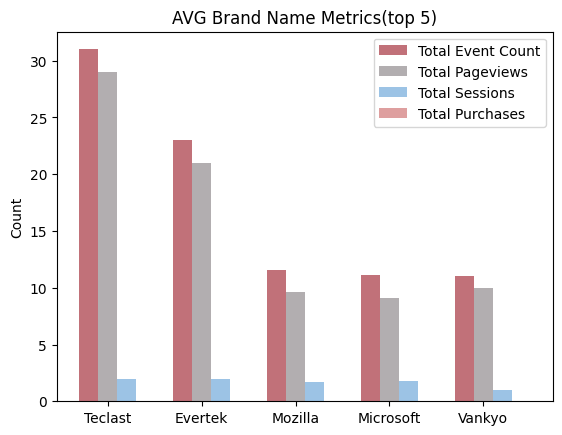

In [ ]:
sortedbrandname_df = df_brand_name_mean.sort_values(by='total_event_count', ascending=False)

# Select the top three rows based on the sorted metric
top_five_brandname = sortedbrandname_df.head(5)

# Extract the required data
brand_names=top_five_brandname['brand_name']
total_event_count = top_five_brandname['total_event_count']
total_pageviews = top_five_brandname['total_pageviews']
total_sessions = top_five_brandname['total_sessions']
total_purchases = top_five_brandname['total_purchases']

# Set the positions for the bars on the x-axis
x = np.arange(len(brand_names))

# Set the width of each bar
width = 0.2

# Create the figure and axis objects
fig, ax = plt.subplots()

# Plot the bars for each metric
ax.bar(x - width, total_event_count, width, label='Total Event Count', color='#981220', alpha=0.6)
ax.bar(x, total_pageviews, width, label='Total Pageviews', color='#80797c', alpha=0.6)
ax.bar(x + width, total_sessions, width, label='Total Sessions', color='#5b9bd5', alpha=0.6)
ax.bar(x + (2 * width), total_purchases, width, label='Total Purchases', color='#c95f5f', alpha=0.6)

# Set the x-axis tick positions and labels
ax.set_xticks(x)
ax.set_xticklabels(brand_names)

# Set the y-axis label
ax.set_ylabel('Count')

# Set the chart title
ax.set_title('AVG Brand Name Metrics(top 5)')

# Add a legend
ax.legend()

# Show the chart
plt.show()

In [ ]:
df_brand_name = cleaned_data.groupby('brand_name').agg({
    'brand_name': 'count',
    'total_event_count': 'mean',
    'total_sessions': 'mean',
    'total_pageviews': 'mean',
    'total_purchases': 'mean',
    'total_trade_lead_form_submit' : 'mean',
    'total_residentialconsumer_lead_form_submit' : 'mean',
    'total_contactus_form_submit' : 'mean',
    'total_engagement_time' : 'mean',
    'engaged_sessions' : 'mean',
    #'formatted_engagement_time' : 'mean',
    'avg_pageviews_per_session' : 'mean',
    #'engagement_rate' : 'mean',
    'bounces' : 'mean',
    #'bounce_rate' : 'mean'
}).rename(columns={'brand_name': 'Total'}).reset_index().sort_values('Total', ascending=True)
#Calculated Fields
df_brand_name['bounce_rate'] = df_country['bounces']/df_country['total_sessions']
df_brand_name['avg_pageviews_per_session'] = df_country['total_pageviews']/df_country['total_sessions']
df_brand_name['engagement_rate'] = df_country['engaged_sessions']/df_country['total_sessions']
df_brand_name['converted_engagement_time'] = pd.to_datetime(df_country['total_engagement_time'], unit='s').dt.strftime("%H:%M:%S")

df_brand_name

,brand_name,Total,total_event_count,total_sessions,total_pageviews,total_purchases,total_trade_lead_form_submit,total_residentialconsumer_lead_form_submit,total_contactus_form_submit,total_engagement_time,engaged_sessions,avg_pageviews_per_session,bounces,bounce_rate,engagement_rate,converted_engagement_time
0,AGM,1,3.000,1.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,3.493,1.000,0.566,0.434,00:00:24
33,Flexymove,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,1.000,NaN,NaN,NaN
34,Fujitsu,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,1.000,NaN,NaN,NaN
43,Jio,1,3.000,1.000,1.000,0.000,0.000,0.000,0.000,0.030,0.000,NaN,1.000,NaN,NaN,NaN
45,Karbonn,1,3.000,1.000,2.000,0.000,0.000,0.000,0.000,1.004,0.000,NaN,1.000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,Motorola,7385,4.691,1.178,2.778,0.000,0.013,0.000,0.000,8.826,0.213,NaN,0.965,NaN,NaN,NaN
55,Microsoft,20138,11.147,1.823,9.119,0.006,0.007,0.001,0.008,53.849,1.267,NaN,0.557,NaN,NaN,NaN
75,Samsung,50643,6.183,1.297,4.421,0.002,0.008,0.001,0.001,18.718,0.486,NaN,0.811,NaN,NaN,NaN
35,Google,69992,10.340,1.914,8.239,0.004,0.006,0.002,0.006,42.010,0.991,NaN,0.924,NaN,NaN,NaN


#  Numerical EDA

It is clear that numeric data is the primary way that we separate consumers from one another so we spent more time exploring the numbers before going through with the clustering, Including: 

- Total sessions

- Total Events

- Total Purchases

- Total Pageviews: Average pageviews per session, consumer vs professional page specific pageviews based on our thoughts and ideas going into the analysis.

Consumer Specific: Dealer Locator, Planning, Finance, and Inspiration Pageviews

Professional Pageviews: Professional, Commercial, and Specific Pageviews

Commercial or Professional:  Cambia Style and Samples Pageviews

Key Takeaways: professionals tend to lean more of desktops; whereas, consumers lean more on mobile devices. More purchases are made using Desktops by professionals

## Sessions 

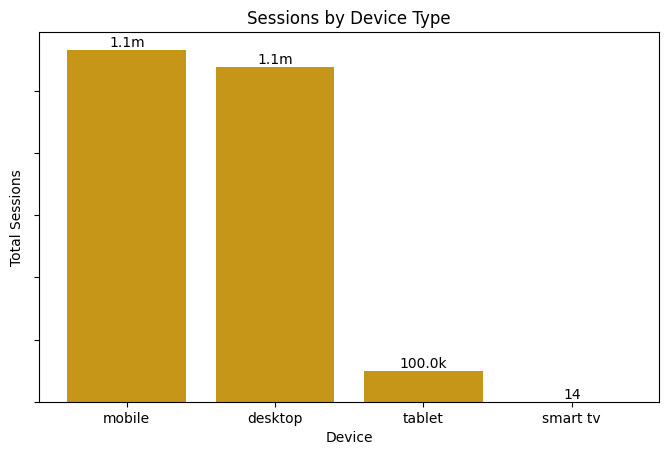

In [ ]:
df_device_sorted = df_device.sort_values('total_sessions', ascending=False)

plt.figure(figsize=(8, 4.8))

# Create the bar plot
plt.bar(df_device_sorted['device'], df_device_sorted['total_sessions'], color='#c59617')

# Add text labels
for i, v in enumerate(df_device_sorted['total_sessions']):
    if v >= 1e6:
        formatted_label = f"{v/1e6:.1f}m"
    elif v >= 1e3:
        formatted_label = f"{v/1e3:.1f}k"
    else:
        formatted_label = str(v)
    plt.text(i, v, formatted_label, ha='center', va='bottom', size=10)

# Set labels and title
plt.title('Sessions by Device Type')
plt.xlabel('Device')
plt.ylabel('Total Sessions')
plt.gca().set_yticklabels([])
plt.show()

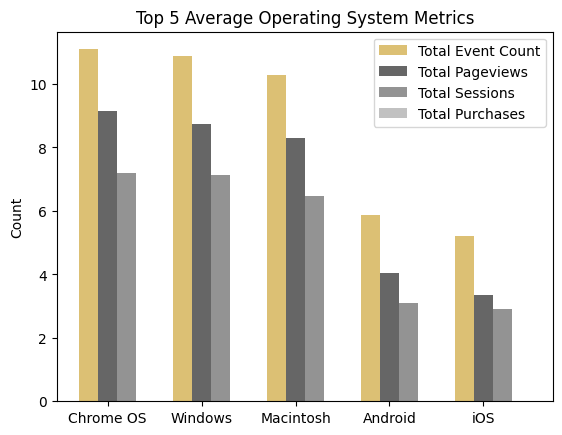

In [ ]:
top_5_df = df_ops_mean.sort_values(by='total_sessions', ascending=False).head(5)

operating_systems = top_5_df['operating_system']
total_event_count = top_5_df['total_event_count']
total_pageviews = top_5_df['total_pageviews']
total_sessions = top_5_df['total_sessions']
total_purchases = top_5_df['total_purchases']

x = np.arange(len(operating_systems))

width = 0.2

fig, ax = plt.subplots()

ax.bar(x - width, total_event_count, width, label='Total Event Count', color='#c59617', alpha=0.6)
ax.bar(x, total_pageviews, width, label='Total Pageviews', color='#000000', alpha=0.6)
ax.bar(x + width, total_sessions, width, label='Total Sessions', color='#4c4c4c', alpha=0.6)
ax.bar(x + (2 * width), total_purchases, width, label='Total Purchases', color='#999999', alpha=0.6)

ax.set_xticks(x)
ax.set_xticklabels(operating_systems)

ax.set_ylabel('Count')
ax.set_title('Top 5 Average Operating System Metrics')

ax.legend()

plt.show()

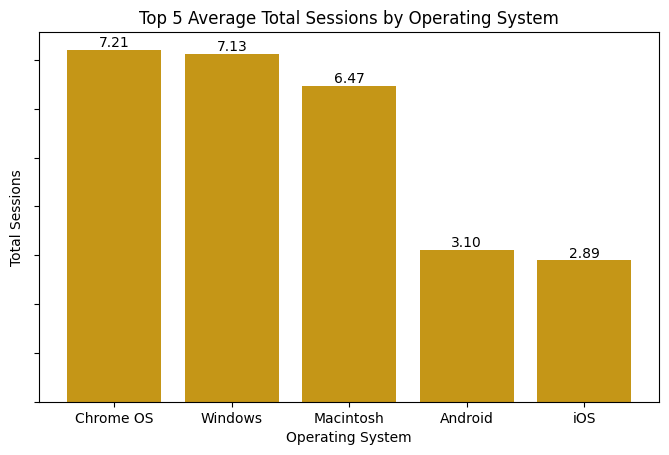

In [ ]:
top_5_df = df_ops.sort_values(by='total_sessions', ascending=False).head(5)

# Set the figure size
plt.figure(figsize=(8, 4.8))

# Create the bar plot
plt.bar(top_5_df['operating_system'], top_5_df['total_sessions'],
        color= '#c59617')

# Add data labels above the bars
for i, v in enumerate(top_5_df['total_sessions']):
    formatted_label = f"{v:.2f}"  # Format the label to display only 2 decimal points
    plt.text(i, v, formatted_label, ha='center', va='bottom')

# Set labels and title
plt.title('Top 5 Average Total Sessions by Operating System')
plt.xlabel('Operating System')
plt.ylabel('Total Sessions')

# Remove y-axis labels
plt.gca().set_yticklabels([])

# Show the plot
plt.show()

## Events 

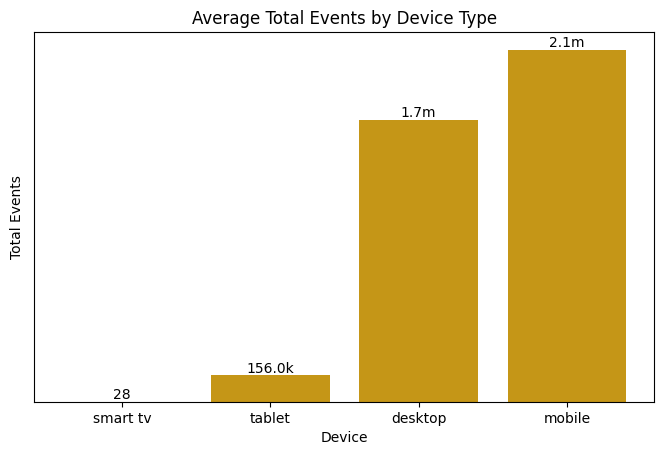

In [ ]:
# Set the figure size
plt.figure(figsize=(8, 4.8))

# Create the bar plot
plt.bar(df_device['device'], df_device['total_event_count'],
        color= '#c59617')

# Add text labels above the bars
for i, v in enumerate(df_device['total_event_count']):
    if v >= 1e6:
        formatted_label = f"{v/1e6:.1f}m"
    elif v >= 1e3:
        formatted_label = f"{v/1e3:.1f}k"
    else:
        formatted_label = str(v)
    plt.text(i, v, formatted_label, ha='center', va='bottom', size=10)

# Set labels and title
plt.title('Average Total Events by Device Type')
plt.xlabel('Device')
plt.ylabel('Total Events')

# Remove y-axis labels
plt.gca().yaxis.set_major_locator(mticker.NullLocator())

# Remove y-axis grid
plt.gca().yaxis.grid(False)

# Show the plot
plt.show()

## Purchases

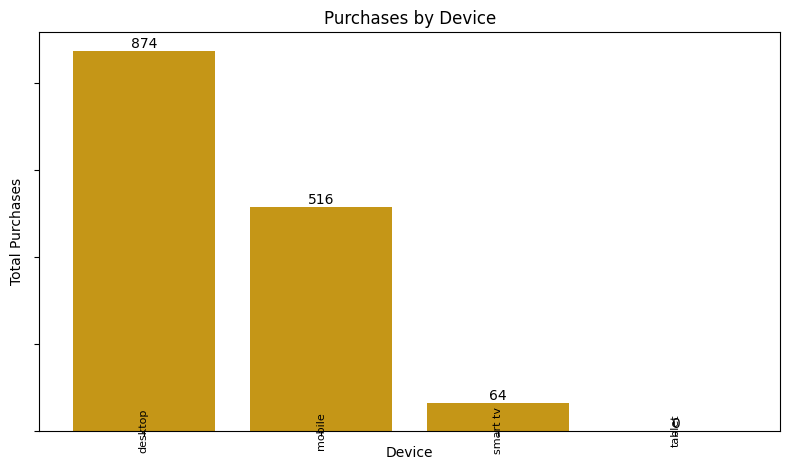

In [ ]:
device_names = df_device['device']
total_purchases = df_device['total_purchases']
sorted_indices = total_purchases.argsort()[::-1]
sorted_device_names = device_names[sorted_indices]
sorted_total_purchases = total_purchases[sorted_indices]
sorted_total_purchases = sorted_total_purchases.sort_values(ascending=False)

fig, ax = plt.subplots(figsize=(8, 4.8))
bar_plot = plt.bar(sorted_device_names, sorted_total_purchases, color='#c59617')

for i, bar in enumerate(bar_plot):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, height, str(height), ha='center', va='bottom', size=10)
    ax.text(bar.get_x() + bar.get_width() / 2, 0, str(sorted_device_names[i]), ha='center', va='center', size=8, rotation=90)

ax.set_title('Purchases by Device')
ax.set_xlabel('Device')
ax.set_ylabel('Total Purchases')
ax.set_xticks(range(len(device_names)))
ax.set_xticklabels([])
ax.yaxis.grid(False)
plt.gca().set_yticklabels([])
plt.tight_layout()
plt.show()


## Pageviews

Pageviews is an important indicator of who is visiting the CUSA website, this is because not every page is designed for every user; some pages are there purely for end user consumers and some are there for professionals such as trade professionals or designers. With that in mind we looked at several different metrics that we felt strongly indicated one user or the other. 

Average Pageviews per session

Consumer Specific: Dealer Locator, Planning, Finance, and Inspiration Pageviews

Professional Pageviews: Professional, Commercial, and Specific Pageviews

Commercial or Professional:  Cambia Style and Samples Pageviews

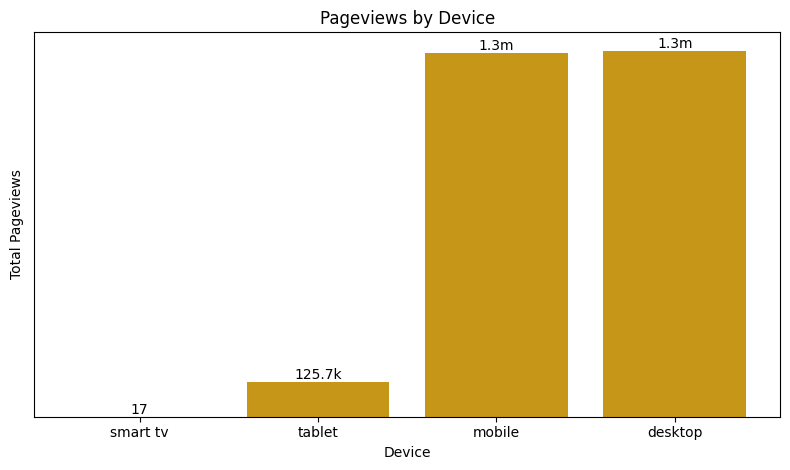

In [ ]:
device_names = df_device['device']
total_pageviews = df_device['total_pageviews']
sorted_indices = total_pageviews.argsort()[::-1]
sorted_device_names = device_names[sorted_indices]
sorted_total_pageviews = total_pageviews[sorted_indices]

fig, ax = plt.subplots(figsize=(8, 4.8))
bar_plot = plt.bar(sorted_device_names, sorted_total_pageviews, color='#c59617')

for i, v in enumerate(sorted_total_pageviews):
    if v >= 1e6:
        formatted_label = f"{v/1e6:.1f}m"
    elif v >= 1e3:
        formatted_label = f"{v/1e3:.1f}k"
    else:
        formatted_label = str(v)
    plt.text(i, v, formatted_label, ha='center', va='bottom', size=10)

ax.set_title('Pageviews by Device')
ax.set_xlabel('Device')
ax.set_ylabel('Total Pageviews')
ax.set_xticks(range(len(sorted_device_names)))

ax.yaxis.set_major_locator(mticker.NullLocator())
ax.yaxis.grid(False)

plt.tight_layout()
plt.show()

### Average Pageviews per Session

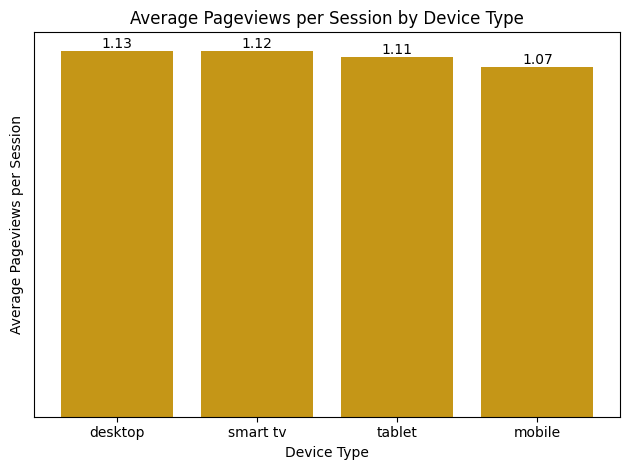

In [ ]:
avg_pageviews_s = df.groupby('device')['avg_pageviews_per_session'].mean()
avg_pageviews_s_sorted = avg_pageviews_s.sort_values(ascending=False)
sorted_device_names = device_names[sorted_indices]

# Create the bar chart using Matplotlib
plt.bar(avg_pageviews_s_sorted.index, avg_pageviews_s_sorted.values, color='#c59617')

# Add data labels
for i, v in enumerate(avg_pageviews_s_sorted.values):
    plt.text(i, v, f"{v:.2f}", ha='center', va='bottom')

plt.xlabel('Device Type')
plt.ylabel('Average Pageviews per Session')
plt.title('Average Pageviews per Session by Device Type')

# Remove y-axis numbers
plt.gca().yaxis.set_major_locator(mticker.NullLocator())

plt.tight_layout()

# Display the bar chart
plt.show()

### Consumer Specific Pageviews

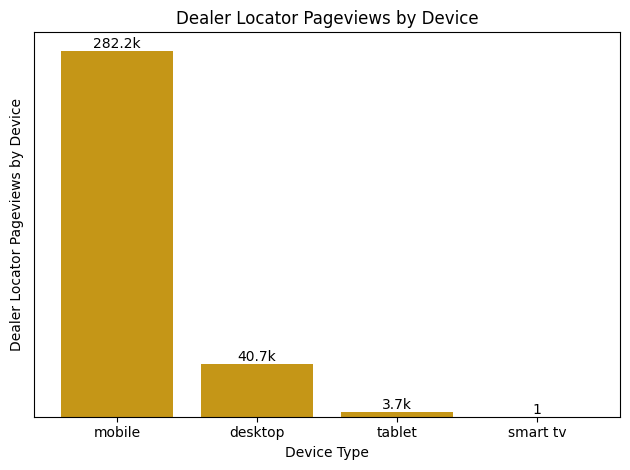

In [ ]:
dl_pageviews = df.groupby('device')['total_dealerlocator_pageviews'].sum()
dl_pageviews_sorted = dl_pageviews.sort_values(ascending=False)
# Create the bar chart using Matplotlib
plt.bar(dl_pageviews_sorted.index, dl_pageviews_sorted.values, color='#c59617')

# Add data labels
for i, v in enumerate(dl_pageviews_sorted.values):
    if v >= 1000:
        formatted_label = f"{v/1000:.1f}k"  # Format the label in "#.#k" format for values >= 1000
    else:
        formatted_label = str(v)  # Leave the label as is for values < 1000
    plt.text(i, v, formatted_label, ha='center', va='bottom')

plt.xlabel('Device Type')
plt.ylabel('Dealer Locator Pageviews by Device')
plt.title('Dealer Locator Pageviews by Device')


# Remove y-axis numbers
plt.gca().yaxis.set_major_locator(mticker.NullLocator())

plt.tight_layout()

# Display the bar chart
plt.show()

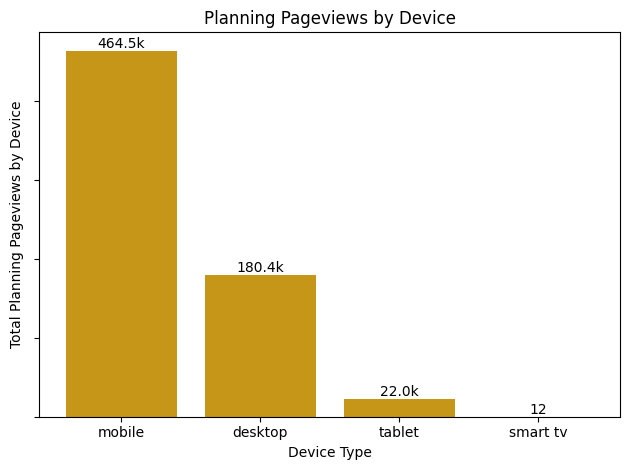

In [ ]:
tpl_pageviews = df.groupby('device')['total_planningcare_pageviews'].count()
tpl_pageviews_sorted = tpl_pageviews.sort_values(ascending=False)
# Create the bar chart using Matplotlib
plt.bar(tpl_pageviews_sorted.index, tpl_pageviews_sorted.values, color='#c59617')

# Add data labels above the bars
for i, v in enumerate(tpl_pageviews_sorted.values):
    if v >= 1000:
        formatted_label = f"{v/1000:.1f}k"  # Format the label in "#.#k" format for values >= 1000
    else:
        formatted_label = str(v)  # Leave the label as is for values < 1000
    plt.text(i, v, formatted_label, ha='center', va='bottom', color='black')

plt.xlabel('Device Type')
plt.ylabel('Total Planning Pageviews by Device')
plt.title('Planning Pageviews by Device')

# Remove y-axis labels
plt.gca().set_yticklabels([])

plt.tight_layout()

# Display the bar chart
plt.show()

####Did not format Finance or planning  graph due to size issue

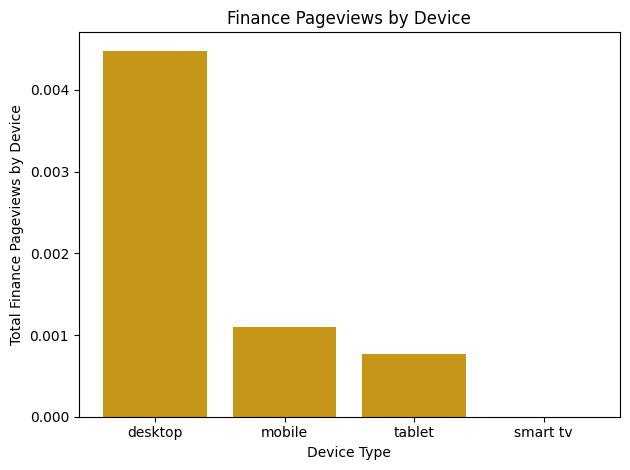

In [ ]:
tf_pageviews = df.groupby('device')['total_financebycambria_pageviews'].mean()
tf_pageviews_sorted = tf_pageviews.sort_values(ascending=False)
# Create the bar chart using Matplotlib
plt.bar(tf_pageviews_sorted.index, tf_pageviews_sorted.values, color='#c59617')

plt.xlabel('Device Type')
plt.ylabel('Total Finance Pageviews by Device')
plt.title('Finance Pageviews by Device')

plt.tight_layout()

# Display the bar chart
plt.show()

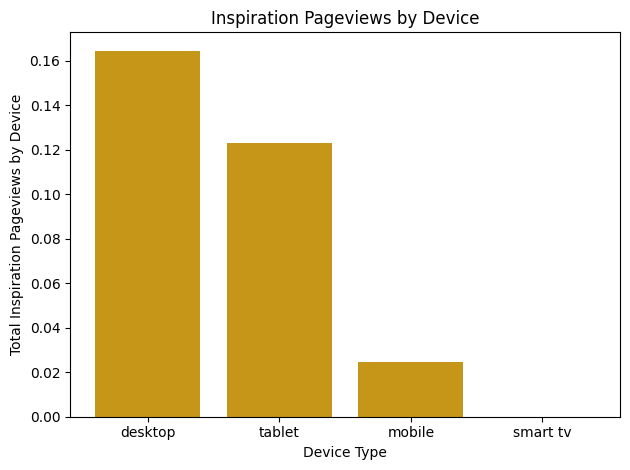

In [ ]:
ti_pageviews = df.groupby('device')['total_inspiration_pageviews'].mean()
ti_pageviews_sorted = ti_pageviews.sort_values(ascending=False)

# Create the bar chart using Matplotlib
plt.bar(ti_pageviews_sorted.index, ti_pageviews_sorted.values, color='#c59617')

plt.xlabel('Device Type')
plt.ylabel('Total Inspiration Pageviews by Device')
plt.title('Inspiration Pageviews by Device')

plt.tight_layout()

# Display the bar chart
plt.show()

### Consumers or Professionals

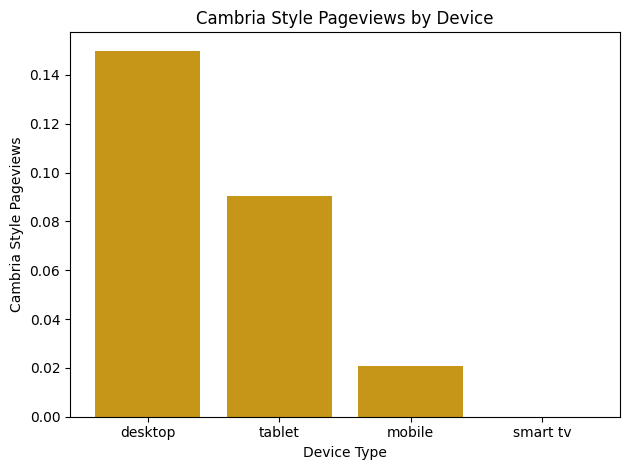

In [ ]:
tstyle_pageviews = df.groupby('device')['total_cambriastyle_pageviews'].mean()

# Sort the values in descending order
tstyle_pageviews_sorted = tstyle_pageviews.sort_values(ascending=False)

# Create the bar chart using Matplotlib
plt.bar(tstyle_pageviews_sorted.index, tstyle_pageviews_sorted.values, color='#c59617')

plt.xlabel('Device Type')
plt.ylabel('Cambria Style Pageviews')
plt.title('Cambria Style Pageviews by Device')
plt.tight_layout()

# Display the bar chart
plt.show()

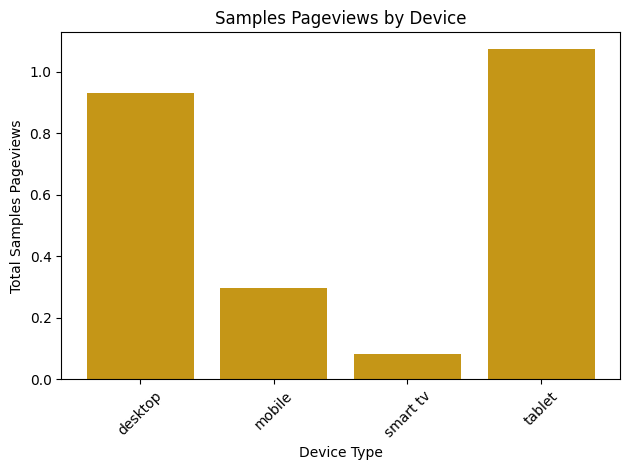

In [ ]:
tsamp_pageviews = df.groupby('device')['total_samples_pageviews'].mean()

# Create the bar chart using Matplotlib
plt.bar(tsamp_pageviews.index, tsamp_pageviews.values, color='#c59617')
plt.xlabel('Device Type')
plt.ylabel('Total Samples Pageviews')
plt.title('Samples Pageviews by Device')
plt.xticks(rotation=45)
plt.tight_layout()

# Display the bar chart
plt.show()

### Professional Specific Pageviews

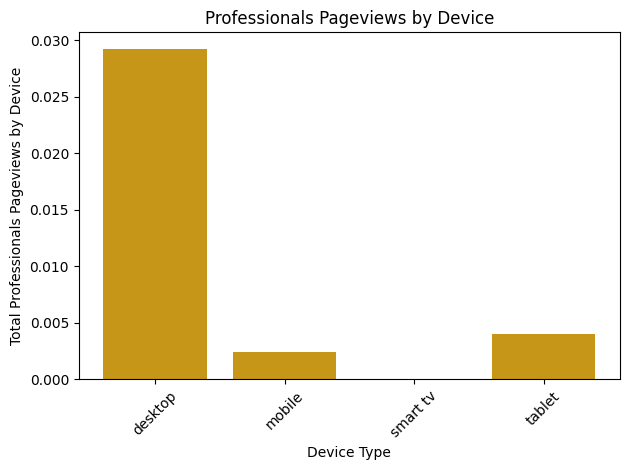

In [ ]:
tp_pageviews = df.groupby('device')['total_professionals_pageviews'].mean()

# Create the bar chart using Matplotlib
plt.bar(tp_pageviews.index, tp_pageviews.values, color='#c59617')
plt.xlabel('Device Type')
plt.ylabel('Total Professionals Pageviews by Device')
plt.title('Professionals Pageviews by Device')
plt.xticks(rotation=45)
plt.tight_layout()

# Display the bar chart
plt.show()

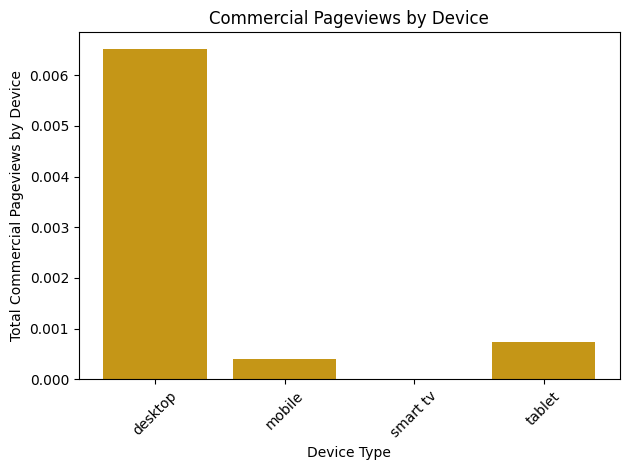

In [ ]:
tc_pageviews = df.groupby('device')['total_commercial_pageviews'].mean()

# Create the bar chart using Matplotlib
plt.bar(tc_pageviews.index, tc_pageviews.values, color='#c59617')
plt.xlabel('Device Type')
plt.ylabel('Total Commercial Pageviews by Device')
plt.title('Commercial Pageviews by Device')
plt.xticks(rotation=45)
plt.tight_layout()

# Display the bar chart
plt.show()

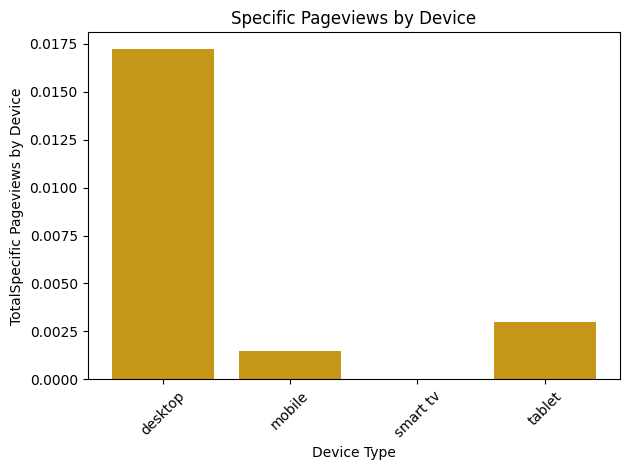

In [ ]:
ts_pageviews = df.groupby('device')['total_specify_pageviews'].mean()

# Create the bar chart using Matplotlib
plt.bar(ts_pageviews.index, ts_pageviews.values, color='#c59617')
plt.xlabel('Device Type')
plt.ylabel('TotalSpecific Pageviews by Device')
plt.title('Specific Pageviews by Device')
plt.xticks(rotation=45)
plt.tight_layout()

# Display the bar chart
plt.show()

TEST

In [ ]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Separate numerical and categorical columns
numerical_cols = cleaned_data.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = cleaned_data.select_dtypes(include=['object']).columns

# Create the preprocessing pipelines for both numerical and categorical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Preprocessing data
preprocessed_data = preprocessor.fit_transform(cleaned_data)

preprocessed_data.shape


(21916, 48022)

In [ ]:
from sklearn.decomposition import TruncatedSVD

# Define TruncatedSVD object
svd = TruncatedSVD(n_components=50)

# Apply TruncatedSVD to the data
svd_data = svd.fit_transform(preprocessed_data)

# Check the explained variance ratio
explained_variance_ratio_svd = svd.explained_variance_ratio_

explained_variance_ratio_svd, svd_data.shape

(array([0.19421557, 0.00753514, 0.06003449, 0.04406189, 0.03974769,
        0.03725368, 0.03357415, 0.03235563, 0.03187898, 0.02868899,
        0.02706718, 0.02480552, 0.02447208, 0.02229729, 0.02026822,
        0.01924638, 0.01896055, 0.01867204, 0.0178074 , 0.01742176,
        0.01674113, 0.01556258, 0.01444176, 0.01393017, 0.01236815,
        0.01170484, 0.01000594, 0.00990693, 0.00872696, 0.0081756 ,
        0.00757475, 0.00672369, 0.00631248, 0.00605176, 0.00566819,
        0.00557068, 0.00430821, 0.00322666, 0.00310507, 0.00280982,
        0.00278509, 0.00270634, 0.0024829 , 0.00228863, 0.00194056,
        0.00182139, 0.00179356, 0.00163972, 0.00152212, 0.00142583]),
 (21916, 50))

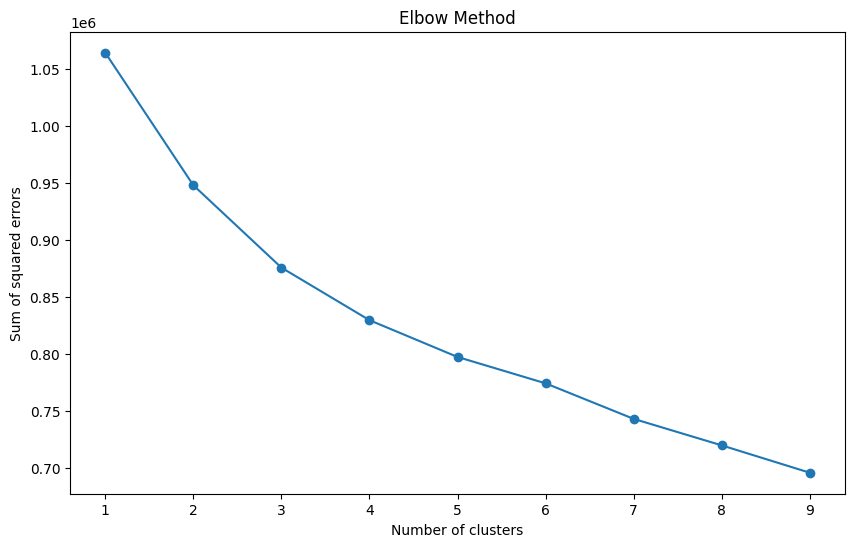

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Define the range of potential clusters
clusters_range = range(1, 10)

# Initialize list to store the SSE for each k
sse = []

# Loop over the range of clusters
for k in clusters_range:
    # Define KMeans model
    kmeans = KMeans(n_clusters=k, random_state=42)
    
    # Fit the model
    kmeans.fit(svd_data)
    
    # Append the SSE for k to the sse list
    sse.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(clusters_range, sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.title('Elbow Method')
plt.show()


In [ ]:
# Separate numerical and categorical columns
numerical_cols = cleaned_data.select_dtypes(include=['int64', 'float64']).columns
categorical_cols = cleaned_data.select_dtypes(include=['object']).columns

# Define the preprocessing pipelines for both numerical and categorical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Preprocessing data
preprocessed_data = preprocessor.fit_transform(cleaned_data)

# Define TruncatedSVD object
svd = TruncatedSVD(n_components=50)

# Apply TruncatedSVD to the data
svd_data = svd.fit_transform(preprocessed_data)

# Define KMeans model with 5 clusters
kmeans = KMeans(n_clusters=4, random_state=42)

# Fit the model and predict the clusters
clusters = kmeans.fit_predict(svd_data)

clusters[:10]  # Display the first 10 predicted clusters

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [ ]:
# Add the cluster assignments to the original dataframe
cleaned_data['cluster'] = clusters

# Check the distribution of clusters
cluster_distribution = cleaned_data['cluster'].value_counts().sort_index()

# Display the first few rows of the dataframe with clusters
data_with_clusters = cleaned_data.copy()
data_with_clusters.head(), cluster_distribution


(    client_id        country          state                  city   device  \
 0   504723265  United States       Michigan  Grand Blanc Township  desktop   
 1   660995750  United States  West Virginia          Philadelphia   mobile   
 2  2111695743  United States        Montana              Anaconda   mobile   
 3   813309707  United States       Delaware               Seaford   mobile   
 4   589981771  United States       Virginia               Ashburn   mobile   
 
   brand_name model_name operating_system operating_system_version  \
 0     Google     Chrome          Windows               Windows 10   
 1      Apple     iPhone              iOS               iOS 16.4.1   
 2      Apple     iPhone              iOS               iOS 16.4.1   
 3      Apple     iPhone              iOS                 iOS 16.2   
 4      Apple     iPhone              iOS               iOS 16.5.1   
 
    total_event_count  ... avg_pageviews_per_session  engagement_rate  bounces  \
 0                  

In [ ]:
# Calculate the mean for numerical features for each cluster
numerical_summary_by_cluster = data_with_clusters.groupby('cluster')[numerical_cols].mean()

# Calculate the mode for categorical features for each cluster
categorical_summary_by_cluster = data_with_clusters.groupby('cluster')[categorical_cols].agg(lambda x: pd.Series.mode(x)[0])

numerical_summary_by_cluster, categorical_summary_by_cluster


(         total_event_count  total_sessions  total_pageviews  total_purchases  \
 cluster                                                                        
 0                    4.334           2.336            2.531            0.000   
 1                   23.037          14.932           20.223            0.013   
 2                   96.802          58.611           88.168            0.061   
 3                  443.875         268.750          408.750            0.125   
 
          total_trade_lead_form_submit  \
 cluster                                 
 0                               0.003   
 1                               0.015   
 2                               0.000   
 3                               0.000   
 
          total_residentialconsumer_lead_form_submit  \
 cluster                                               
 0                                             0.000   
 1                                             0.005   
 2                                

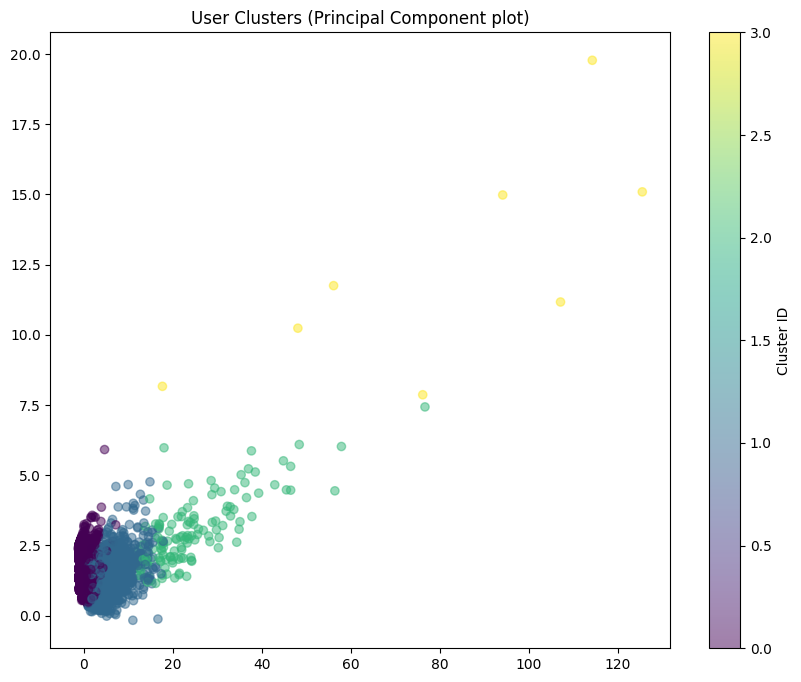

In [ ]:
# Create a scatter plot of the two principal components
plt.figure(figsize=(10, 8))
plt.scatter(svd_data[:, 0], svd_data[:, 1], c=clusters, cmap='viridis', alpha=0.5)
plt.title('User Clusters (Principal Component plot)')
plt.colorbar(label='Cluster ID')
plt.show()

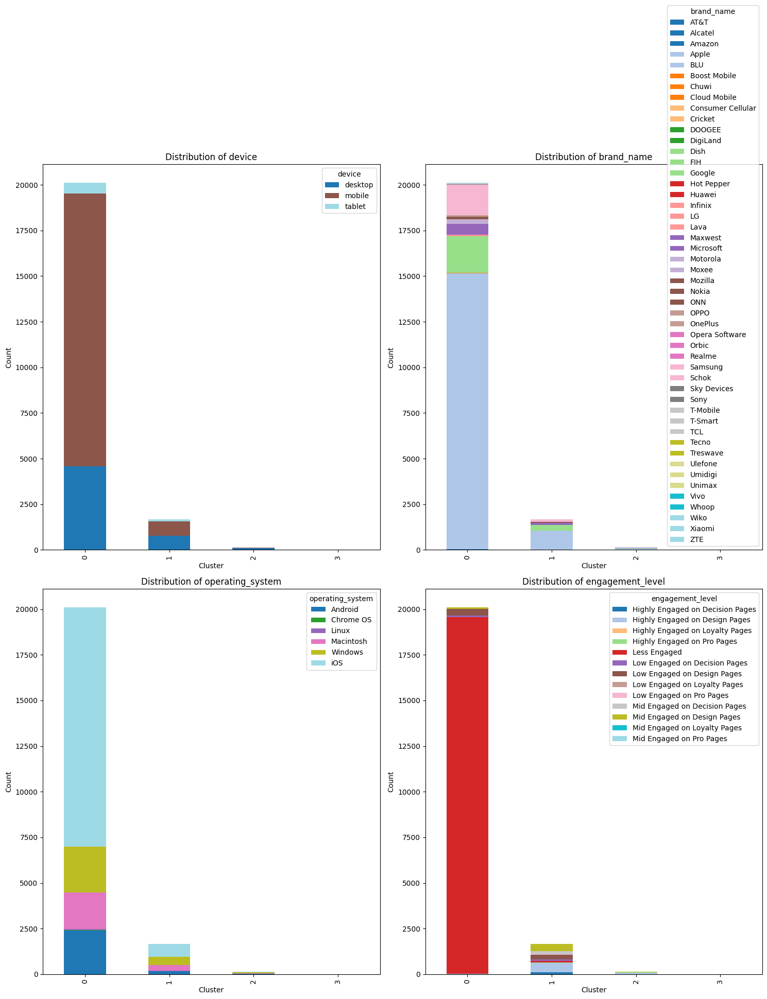

In [ ]:
# Create bar plots for categorical features across clusters
fig, axs = plt.subplots(2, 2, figsize=(15, 20))

# List of categorical features
cat_features = ['device', 'brand_name', 'operating_system', 'engagement_level']

for i, ax in enumerate(axs.flatten()):
    # Get data for the current feature
    feature_data = data_with_clusters.groupby(['cluster', cat_features[i]]).size().unstack(fill_value=0)
    
    # Create a bar plot
    feature_data.plot(kind='bar', stacked=True, ax=ax, colormap='tab20')
    
    # Set title and labels
    ax.set_title(f'Distribution of {cat_features[i]}')
    ax.set_xlabel('Cluster')
    ax.set_ylabel('Count')

# Adjust the layout
plt.tight_layout()
plt.show()

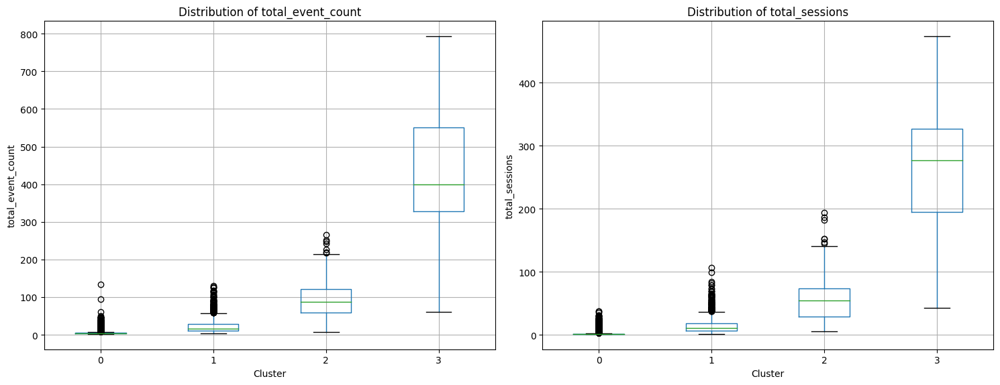

In [ ]:
# Create box plots for numerical features across clusters
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# List of numerical features
num_features = ['total_event_count', 'total_sessions']

for i, ax in enumerate(axs):
    # Create a box plot
    data_with_clusters.boxplot(column=num_features[i], by='cluster', ax=ax)
    
    # Set title and labels
    ax.set_title(f'Distribution of {num_features[i]}')
    ax.set_xlabel('Cluster')
    ax.set_ylabel(num_features[i])

# Adjust the layout
plt.suptitle('')
plt.tight_layout()
plt.show()


# Processing

Earlier in the code we identified the data types of each column. In order to successfully run a k-means cluster analysis we also need to identify what data is categorical vs numerical; this will help in a few steps when we prepare the separate categorical and numerical data columns for the clustering

In [ ]:
# Identify the Categorical and Numerical Columns
numeric_cols = cleaned_data.select_dtypes(include=[np.number]).columns
categorical_cols = cleaned_data.select_dtypes(include=['object']).columns

print('Numeric columns:')
for col in numeric_cols:
    print(f'Column name: {col}, Position: {df.columns.get_loc(col)}')

print('\nCategorical columns:')
for col in categorical_cols:
    print(f'Column name: {col}, Position: {df.columns.get_loc(col)}')

Numeric columns:
Column name: total_event_count, Position: 9
Column name: total_sessions, Position: 11
Column name: total_pageviews, Position: 12
Column name: total_purchases, Position: 13
Column name: total_trade_lead_form_submit, Position: 14
Column name: total_residentialconsumer_lead_form_submit, Position: 15
Column name: total_contactus_form_submit, Position: 16
Column name: total_dealerlocator_pageviews, Position: 17
Column name: total_professionals_pageviews, Position: 18
Column name: total_commercial_pageviews, Position: 19
Column name: total_specify_pageviews, Position: 20
Column name: total_case_studies_pageviews, Position: 21
Column name: total_pro_locations_pageviews, Position: 22
Column name: total_design_palette_pageviews, Position: 23
Column name: total_inspiration_pageviews, Position: 24
Column name: total_financebycambria_pageviews, Position: 25
Column name: total_planningcare_pageviews, Position: 26
Column name: total_cambriastyle_pageviews, Position: 27
Column name: 

In [ ]:
numeric_cols = ['total_event_count', 'total_sessions', 'total_pageviews', 'total_purchases',
                'total_trade_lead_form_submit', 'total_residentialconsumer_lead_form_submit',
                'total_contactus_form_submit', 'total_dealerlocator_pageviews', 'total_professionals_pageviews',
                'total_commercial_pageviews', 'total_specify_pageviews', 'total_case_studies_pageviews', 
                'total_pro_locations_pageviews', 'total_design_palette_pageviews', 'total_inspiration_pageviews', 
                'total_financebycambria_pageviews', 'total_planningcare_pageviews', 'total_cambriastyle_pageviews', 
                'total_samples_pageviews', 'total_galleries_pageviews', 'pro_pages_engagement_time', 
                'commercial_pages_engagement_time', 'specify_pages_engagement_time', 'case_studies_pages_engagement_time',
                'pro_locations_pages_engagement_time', 'design_palette_pages_engagement_time',
                'inspiration_pages_engagement_time', 'financebycambria_pages_engagement_time',
                'planningcare_pages_engagement_time', 'samples_pages_engagement_time',
                'galleries_pages_engagement_time', 'dealerlocator_pages_engagement_time',
                'cambriastyle_pages_engagement_time', 'total_engagement_time', 'engaged_sessions', 
                'formatted_engagement_time', 'avg_pageviews_per_session', 'engagement_rate', 'bounces',
                'bounce_rate', 'avg_time_on_pro_pages', 'avg_time_on_design_pages', 'avg_time_on_decision_pages', 
                'avg_time_on_loyalty_pages']

categorical_cols = ['client_id', 'country', 'state', 'city', 'device', 'brand_name', 
                    'model_name', 'operating_system', 'operating_system_version', 'engagement_level']


# Clusters Give the Data Meaning

In order to find if there are groups of users that stand out in certain areas of the CUSA Website we decided to use K-Means clustering. K-Means clustering is simple to implement, easy to use on large sets of data and assures convergence.  A cluster of four was chosen as the optimal number of clusters as shown by the K-Means Inertia Elbow Chart on Web User Data. The following cluster_groups data frame was created to continue investigation in to what makes these clusters unique.

Reading and Processing Data
Dropping Columns and Converting Fields
Preparing Numeric and Categorical Columns
Preprocessing Data
Determining Optimal Number of Clusters
Processing k=1
Processing k=2
Processing k=3
Processing k=4
Processing k=5
Processing k=6
Processing k=7
Processing k=8
Processing k=9
Plotting Sum of Squared Distances


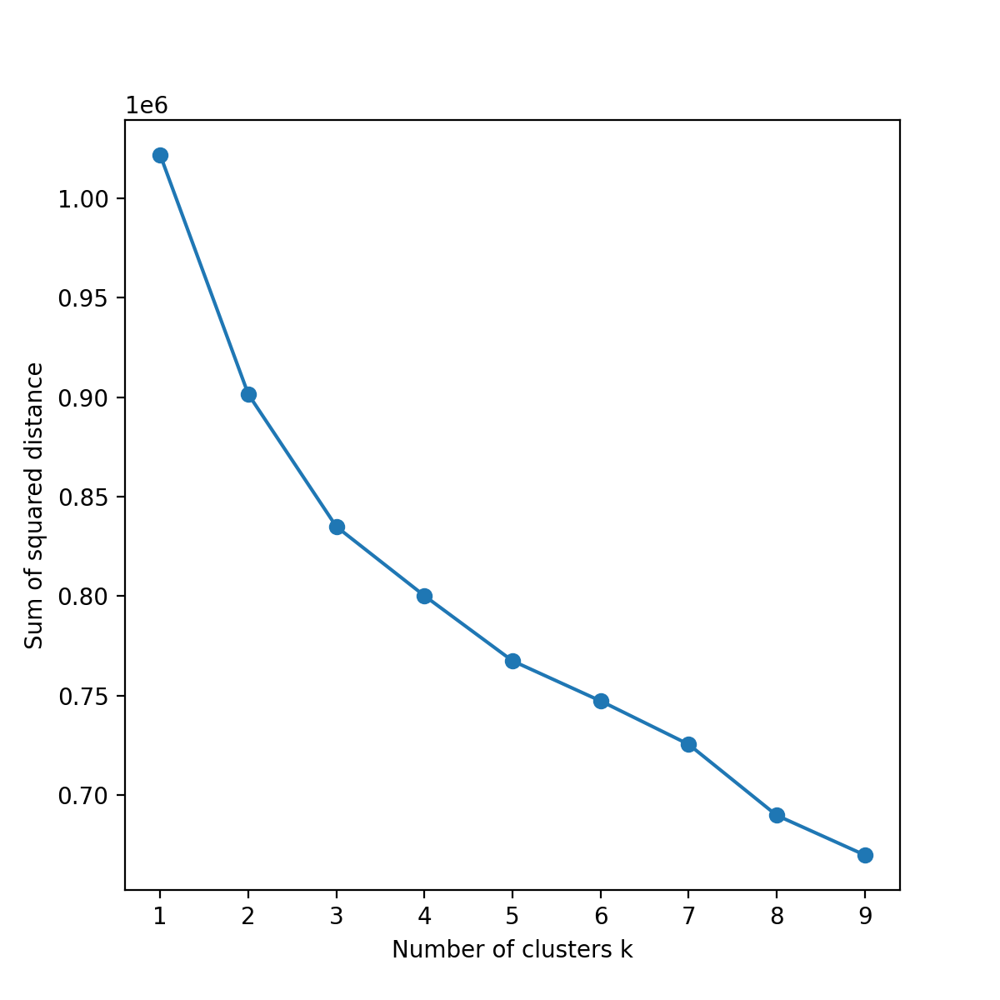

In [ ]:
try:
    print('Reading and Processing Data')
    data = cleaned_data

    print('Dropping Columns and Converting Fields')
    data = data.drop(columns=['first_touch', 'formatted_first_touch'])

    print('Preparing Numeric and Categorical Columns')
    numeric_cols = ['total_event_count', 'total_sessions', 'total_pageviews', 'total_purchases',
                    'total_trade_lead_form_submit', 'total_residentialconsumer_lead_form_submit',
                    'total_contactus_form_submit', 'total_dealerlocator_pageviews', 'total_professionals_pageviews',
                    'total_commercial_pageviews', 'total_specify_pageviews', 'total_case_studies_pageviews', 'total_pro_locations_pageviews',
                    'total_design_palette_pageviews', 'total_inspiration_pageviews', 'total_financebycambria_pageviews',
                    'total_planningcare_pageviews', 'total_cambriastyle_pageviews', 'total_samples_pageviews', 
                    'total_galleries_pageviews', 'pro_pages_engagement_time', 'commercial_pages_engagement_time',
                    'specify_pages_engagement_time', 'case_studies_pages_engagement_time',
                    'pro_locations_pages_engagement_time', 'design_palette_pages_engagement_time',
                    'inspiration_pages_engagement_time', 'financebycambria_pages_engagement_time',
                    'planningcare_pages_engagement_time', 'samples_pages_engagement_time',
                    'galleries_pages_engagement_time', 'dealerlocator_pages_engagement_time',
                    'cambriastyle_pages_engagement_time', 'total_engagement_time', 'engaged_sessions', 
                    'avg_pageviews_per_session', 'engagement_rate', 'bounce_rate',
                    'bounces', 'formatted_engagement_time', 'avg_time_on_pro_pages',
                    'avg_time_on_design_pages', 'avg_time_on_decision_pages', 'avg_time_on_loyalty_pages']

    categorical_cols = ['country', 'state', 'city', 'device', 'engagement_level']

    for col in categorical_cols:
        data[col] = data[col].astype(str)

    print('Preprocessing Data')
    preprocess = make_column_transformer(
        (StandardScaler(), numeric_cols),
        (OneHotEncoder(), categorical_cols)
    )
    data_preprocessed = preprocess.fit_transform(data)
 
    print('Determining Optimal Number of Clusters')
    sse = []
    list_k = list(range(1, 10))

    for k in list_k:
        print(f"Processing k={k}")
        km = KMeans(n_clusters=k)
        km.fit(data_preprocessed)
        sse.append(km.inertia_)

    print('Plotting Sum of Squared Distances')
    plt.figure(figsize=(6, 6))
    plt.plot(list_k, sse, '-o')
    plt.xlabel('Number of clusters k')
    plt.ylabel('Sum of squared distance')
    plt.show()

except Exception as e:
    import traceback
    print('An error occurred:', e)
    print(traceback.format_exc())


In [ ]:
# Construct the KMeans model with the optimal number of clusters
kmeans = KMeans(n_clusters=3)

# Fit the KMeans model to the preprocessed data
kmeans.fit(data_preprocessed)

# Predict the clusters for each sample
data['cluster'] = kmeans.predict(data_preprocessed)

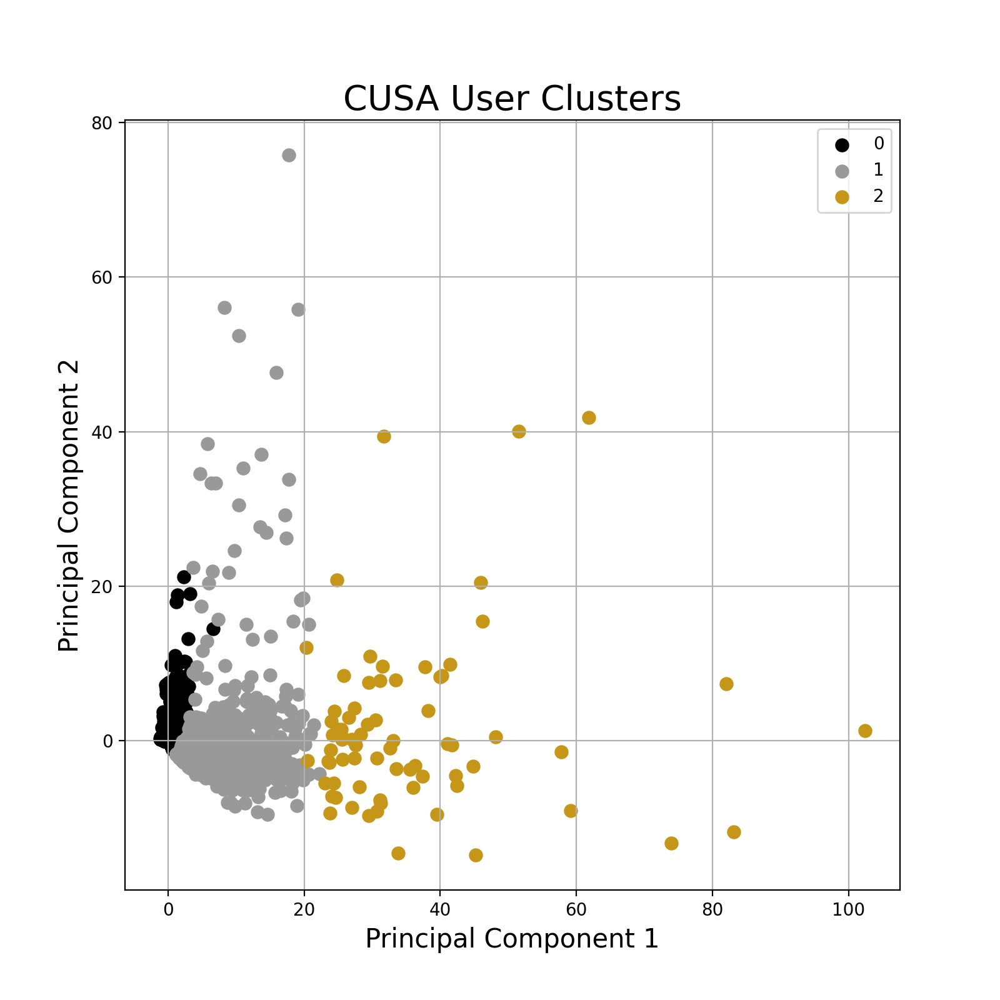

In [ ]:
# Use TruncatedSVD to reduce dimensionality
svd = TruncatedSVD(n_components=2)
principalComponents = svd.fit_transform(data_preprocessed)

# Create a DataFrame with the two components
principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])

# Concatenate the clusters labels to the DataFrame
finalDf = pd.concat([principalDf, pd.DataFrame({'cluster': kmeans.labels_})], axis=1)


# Visualize 2D Projection
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(1, 1, 1)
ax.set_xlabel('Principal Component 1', fontsize=15)
ax.set_ylabel('Principal Component 2', fontsize=15)
ax.set_title('CUSA User Clusters', fontsize=20)
targets = list(finalDf['cluster'].unique())
colors = [ '#000000', '#999999', '#c59617']  # Add more colors if you have more than 5 clusters

for target, color in zip(targets, colors):
    indicesToKeep = finalDf['cluster'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1'],
               finalDf.loc[indicesToKeep, 'principal component 2'],
               c=color,
               s=50)
ax.legend(targets)
ax.grid()


In [ ]:
"""
# Determine the size of the sample you want to use. Here we take 20% of the data.
sample_size = int(data_preprocessed.shape[0] * 0.20)

# Use numpy's random.choice to get a random subset of your data
random_indices = np.random.choice(data_preprocessed.shape[0], size=sample_size, replace=False)
data_sample = data_preprocessed[random_indices, :]

# Fit the KMeans model to the data_sample
kmeans = KMeans(n_clusters=3)  # Define the number of clusters you want
kmeans.fit(data_sample)

# Predictions
y_pred_sample = kmeans.predict(data_sample)

# Compute the silhouette score based on the sample
silhouette_score_sample = silhouette_score(data_sample, y_pred_sample)

print('Silhouetter Score: %.3f' % silhouette_score_sample)
"""

Silhouetter Score: 0.831

- The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k.
- It is calculated by taking the mean distance from intra-cluster and nearest cluster samples.
- Its value ranges from -1 to 1.
- A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
- 1 is the ideal value and indicates that clusters are very dense and nicely separated.
- A negative value indicates elements have likely been assigned to the wrong clusters.
- The closer the value of the silhouette score to 1 the better-separated the clusters.

# 'Pageview' Data Table

In [ ]:
data_pages = _deepnote_execute_sql('SELECT * FROM `analytics_329819782`.`skunkworks_page_level`\nWHERE pageview_timestamp > \'2023-04-29 00:00:00\'', 'SQL_EE59AD05_5F8F_4CEE_B752_EA3517424264', audit_sql_comment='', sql_cache_mode='cache_disabled')
data_pages

,client_id,country,state,city,device,device_operating_system_version,Device_Browser,page_location,trade_lead_form_submit,residentialconsumer_lead_form_submit,contactus_form_submit,purchase,custom_session_number,pageview_timestamp,page_count,Traffic_Name,Traffic_Source,Traffic_Medium
0,None,United States,California,San Jose,mobile,None,Chrome,https://www.cambriausa.com/quartz-colors/,0,0,0,0,26,2023-05-18 11:24:38,1,None,None,None
1,None,United States,California,San Jose,mobile,None,Chrome,https://www.cambriausa.com/quartz-colors/#!/,0,0,0,0,26,2023-05-18 11:26:37,3,None,None,None
2,None,United States,Washington,Vancouver,mobile,None,Android Webview,https://www.cambriausa.com/quartz-samples/?utm...,0,0,0,0,228,2023-07-03 17:21:39,1,None,None,None
3,None,United States,California,Oakland,mobile,None,Safari (in-app),https://www.cambriausa.com/quartz-colors/#!/,0,0,0,0,316,2023-07-07 03:29:59,8,None,None,None
4,None,United States,Colorado,Aurora,desktop,None,Firefox,https://www.cambriausa.com/cookie-policy/,0,0,0,0,345,2023-07-14 23:17:54,1,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3369068,999894320.1685846219,Canada,Ontario,Mississauga,mobile,iOS 16.3,Safari,https://www.cambriausa.com/dealer-locator/?wbr...,0,0,0,0,12,2023-06-04 04:56:09,1,None,google,cpc
3369069,999911672.1689220853,United States,Washington,Mount Vernon,mobile,iOS 16.5.1,Safari,https://www.cambriausa.com/#!/,0,0,0,0,6,2023-07-13 04:00:53,2,(direct),(direct),(none)
3369070,999968990.1685570841,United States,Florida,Okeechobee,mobile,iOS 16.3.1,Safari,https://www.cambriausa.com/quartz-countertops/#!/,0,0,0,0,7,2023-05-31 22:07:21,2,(organic),yahoo,organic
3369071,999981973.1685143811,United States,Florida,Englewood,mobile,iOS 16.4.1,Safari (in-app),https://www.cambriausa.com/quartz-colors/,0,0,0,0,6,2023-05-26 23:32:46,2,(direct),(direct),(none)


## Data Inspection

In [ ]:
# Display the first few rows
data_pages.head()

,client_id,country,state,city,device,device_operating_system_version,Device_Browser,page_location,trade_lead_form_submit,residentialconsumer_lead_form_submit,contactus_form_submit,purchase,custom_session_number,pageview_timestamp,page_count,Traffic_Name,Traffic_Source,Traffic_Medium
0,None,United States,California,San Jose,mobile,None,Chrome,https://www.cambriausa.com/quartz-colors/,0,0,0,0,26,2023-05-18 11:24:38,1,None,None,None
1,None,United States,California,San Jose,mobile,None,Chrome,https://www.cambriausa.com/quartz-colors/#!/,0,0,0,0,26,2023-05-18 11:26:37,3,None,None,None
2,None,United States,Washington,Vancouver,mobile,None,Android Webview,https://www.cambriausa.com/quartz-samples/?utm...,0,0,0,0,228,2023-07-03 17:21:39,1,None,None,None
3,None,United States,California,Oakland,mobile,None,Safari (in-app),https://www.cambriausa.com/quartz-colors/#!/,0,0,0,0,316,2023-07-07 03:29:59,8,None,None,None
4,1000000688.1689323284,United States,Oregon,Boardman,desktop,Macintosh Intel 10.15,Chrome,https://www.cambriausa.com/dealer-locator/loca...,0,0,0,0,6,2023-07-14 08:28:04,1,None,None,None


The dataset contains the following columns:

client_id: This seems to be a unique identifier for each client. Some values are NaN, indicating missing data.
country: This is the country in which the client is located.
state: This is the state in which the client is located.
city: This is the city in which the client is located.
device: This indicates the device type (e.g., mobile) used by the client.
device_operating_system_version: This indicates the version of the operating system of the device used by the client.
Device_Browser: This represents the browser used by the client.
page_location: This indicates the URL of the page visited by the client.
trade_lead_form_submit: This is a count of trade lead form submissions by the client.
residentialconsumer_lead_form_submit: This is a count of residential consumer lead form submissions by the client.
contactus_form_submit: This is a count of contact us form submissions by the client.
purchase: This is a count of purchases made by the client.
custom_session_number: This seems to be a count of sessions by the client.
pageview_timestamp: This is the timestamp of the pageview.
page_count: This is a count of pages viewed by the client.
Traffic_Name: This represents the traffic name for the client's session. Some values are NaN, indicating missing data.
Traffic_Source: This represents the traffic source for the client's session. Some values are NaN, indicating missing data.
Traffic_Medium: This represents the traffic medium for the client's session. Some values are NaN, indicating missing data.

In [ ]:
# Check the data types
data_pages_types = data_pages.dtypes

# Check for missing data
missing_values_pages = data_pages.isna().sum()

# Combine the data types and missing values into a single dataframe for easier viewing
data_pages_info = pd.DataFrame({'Data Type': data_pages_types, 'Missing Values': missing_values_pages})

print(data_pages_info)

                                     Data Type  Missing Values
client_id                               object              71
country                                 object               0
state                                   object             557
city                                    object            5663
device                                  object               0
device_operating_system_version         object              71
Device_Browser                          object             153
page_location                           object               0
trade_lead_form_submit                   int64               0
residentialconsumer_lead_form_submit     int64               0
contactus_form_submit                    int64               0
purchase                                 int64               0
custom_session_number                    int64               0
pageview_timestamp                      object               0
page_count                               int64         

The dataset contains a mix of data types including numerical (int64, float64) and categorical (object) variables. Some columns, such as client_id, country, state, city, device_operating_system_version, Traffic_Name, Traffic_Source, and Traffic_Medium, contain missing values.

We can start our exploratory data analysis by plotting the distribution of some numerical and categorical features.

Since some columns have missing values, it's important to decide how to handle these before proceeding with the analysis. As you've previously mentioned, we could drop the rows with missing data for specific columns and replace the missing values in other columns with '0'. However, in this case, given the nature of the missing data (mostly categorical), replacing missing values with '0' might not be appropriate. We could replace them with a specific value like 'Unknown' instead.

Let's start by handling the missing data and then proceed with the visualizations.

In [ ]:
# Clean DataFrame (DF)
# Drop rows with missing or incorrect data in specific columns
specified_columns = ['client_id', 'country', 'state', 'city', 'device', 'device_operating_system_version', 'Device_Browser', 'page_location', 'Traffic_Name', 'Traffic_Source', 'Traffic_Medium']
cleaned_data_pages = data_pages.dropna(subset=specified_columns)
#cleaned_data_pages = cleaned_data_pages[cleaned_data['client_id'].str.contains('5cae7f02-c26e-478e-8519-dbf3452199ab')==False]
cleaned_data_pages['client_id'] = cleaned_data_pages['client_id'].str.split('.', expand=True)[0]

# Replace missing data in other columns with '0'
cleaned_data_pages = cleaned_data_pages.fillna(0)

# Filter to Only United States
cleaned_data_pages = cleaned_data_pages[cleaned_data_pages['country'] == 'United States']

# Display the first few rows of the cleaned data
cleaned_data_pages

/tmp/ipykernel_5993/212597209.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,client_id,country,state,city,device,device_operating_system_version,Device_Browser,page_location,trade_lead_form_submit,residentialconsumer_lead_form_submit,contactus_form_submit,purchase,custom_session_number,pageview_timestamp,page_count,Traffic_Name,Traffic_Source,Traffic_Medium
27,1000000688,United States,Oregon,Boardman,desktop,Macintosh Intel 10.15,Chrome,https://www.cambriausa.com/dealer-locator/loca...,0,0,0,0,6,2023-07-14 08:28:04,1,(direct),(direct),(none)
28,1000033445,United States,Minnesota,Richfield,desktop,Windows 10,Chrome,https://www.cambriausa.com/quartz-countertops/#!/,0,0,0,0,14,2023-05-21 22:28:08,2,(organic),google,organic
29,1000038054,United States,Ohio,Oxford,mobile,iOS 16.3.1,Safari,https://www.cambriausa.com/edges-finishes/,0,0,0,0,0,2023-07-12 21:06:23,1,(direct),(direct),(none)
30,1000047303,United States,Washington,Everett,desktop,Windows 10,Chrome,https://shop.cambriausa.com/collections/sample...,0,0,0,0,0,2023-07-10 17:58:53,25,(direct),(direct),(none)
31,100005950,United States,Texas,Dallas,mobile,iOS 16.5,Safari,https://www.cambriausa.com/style/blue-kitchen-...,0,0,0,0,7,2023-06-21 23:13:39,2,(organic),yahoo,organic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3369067,999892060,United States,Pennsylvania,State College,mobile,iOS 16.3.1,Safari,https://www.cambriausa.com/quartz-colors/#!/,0,0,0,0,8,2023-07-07 21:13:39,6,(direct),(direct),(none)
3369069,999911672,United States,Washington,Mount Vernon,mobile,iOS 16.5.1,Safari,https://www.cambriausa.com/#!/,0,0,0,0,6,2023-07-13 04:00:53,2,(direct),(direct),(none)
3369070,999968990,United States,Florida,Okeechobee,mobile,iOS 16.3.1,Safari,https://www.cambriausa.com/quartz-countertops/#!/,0,0,0,0,7,2023-05-31 22:07:21,2,(organic),yahoo,organic
3369071,999981973,United States,Florida,Englewood,mobile,iOS 16.4.1,Safari (in-app),https://www.cambriausa.com/quartz-colors/,0,0,0,0,6,2023-05-26 23:32:46,2,(direct),(direct),(none)


In [ ]:
cleaned_data_pages.columns

Index(['client_id', 'country', 'state', 'city', 'device',
       'device_operating_system_version', 'Device_Browser', 'page_location',
       'trade_lead_form_submit', 'residentialconsumer_lead_form_submit',
       'contactus_form_submit', 'purchase', 'custom_session_number',
       'pageview_timestamp', 'page_count', 'Traffic_Name', 'Traffic_Source',
       'Traffic_Medium'],
      dtype='object')

In [ ]:
merged_data = pd.merge(cleaned_data_pages, data[['client_id','cluster', 'engagement_level',
                'total_event_count', 'total_sessions', 'total_pageviews', 'total_purchases',
                'total_trade_lead_form_submit', 'total_residentialconsumer_lead_form_submit',
                'total_contactus_form_submit', 'total_dealerlocator_pageviews', 'total_professionals_pageviews',
                'total_commercial_pageviews', 'total_specify_pageviews', 'total_case_studies_pageviews', 
                'total_pro_locations_pageviews', 'total_design_palette_pageviews', 'total_inspiration_pageviews', 
                'total_financebycambria_pageviews', 'total_planningcare_pageviews', 'total_cambriastyle_pageviews', 
                'total_samples_pageviews', 'total_galleries_pageviews', 'pro_pages_engagement_time', 
                'commercial_pages_engagement_time', 'specify_pages_engagement_time', 'case_studies_pages_engagement_time',
                'pro_locations_pages_engagement_time', 'design_palette_pages_engagement_time',
                'inspiration_pages_engagement_time', 'financebycambria_pages_engagement_time',
                'planningcare_pages_engagement_time', 'samples_pages_engagement_time',
                'galleries_pages_engagement_time', 'dealerlocator_pages_engagement_time',
                'cambriastyle_pages_engagement_time', 'total_engagement_time', 'engaged_sessions', 
                'formatted_engagement_time', 'avg_pageviews_per_session', 'engagement_rate', 'bounces',
                'bounce_rate', 'avg_time_on_pro_pages', 'avg_time_on_design_pages', 'avg_time_on_decision_pages', 
                'avg_time_on_loyalty_pages']], on='client_id', how='left')
merged_data.head(15)                                 

,client_id,country,state,city,device,device_operating_system_version,Device_Browser,page_location,trade_lead_form_submit,residentialconsumer_lead_form_submit,...,engaged_sessions,formatted_engagement_time,avg_pageviews_per_session,engagement_rate,bounces,bounce_rate,avg_time_on_pro_pages,avg_time_on_design_pages,avg_time_on_decision_pages,avg_time_on_loyalty_pages
0,1000000688,United States,Oregon,Boardman,desktop,Macintosh Intel 10.15,Chrome,https://www.cambriausa.com/dealer-locator/loca...,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1000033445,United States,Minnesota,Richfield,desktop,Windows 10,Chrome,https://www.cambriausa.com/quartz-countertops/#!/,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1000038054,United States,Ohio,Oxford,mobile,iOS 16.3.1,Safari,https://www.cambriausa.com/edges-finishes/,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1000047303,United States,Washington,Everett,desktop,Windows 10,Chrome,https://shop.cambriausa.com/collections/sample...,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100005950,United States,Texas,Dallas,mobile,iOS 16.5,Safari,https://www.cambriausa.com/style/blue-kitchen-...,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,1000064735,United States,California,Sonora,mobile,iOS 16.3.1,Safari,https://www.cambriausa.com/#!/,0,0,...,0.000,0.000,1.000,0.000,2.000,1.000,0.000,0.000,0.000,0.000
6,1000082306,United States,New York,East Quogue,mobile,iOS 16.4.1,Safari (in-app),https://www.cambriausa.com/residential-convers...,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1000088471,United States,Minnesota,Lake City,tablet,Android 7.0.0,Chrome,https://www.cambriausa.com/dealer-locator/loca...,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1000088901,United States,Oregon,Medford,mobile,iOS 16.5,Safari,https://www.cambriausa.com/quartz-countertops/...,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1000171241,United States,Colorado,Englewood,mobile,iOS 15.5,Safari,https://www.cambriausa.com/dealer-locator/loca...,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


anything to the left of cluster can be summed

In [ ]:
#import zipfile

# Export DataFrame to CSV
#merged_data.to_csv('merged_data.csv', index=False)

# Create a ZipFile object
#with zipfile.ZipFile('merged_data.zip', 'w') as zipf:
    # Add the files into the zip
#     zipf.write('merged_data.csv')

In [ ]:
merged_data.columns

# EDA on Pagetable

Next we take the merged dataset and do another round of exploratory data analysis that will help point out and assign characteristics that define each of the three clusters

## General info about clusters

### Device Type

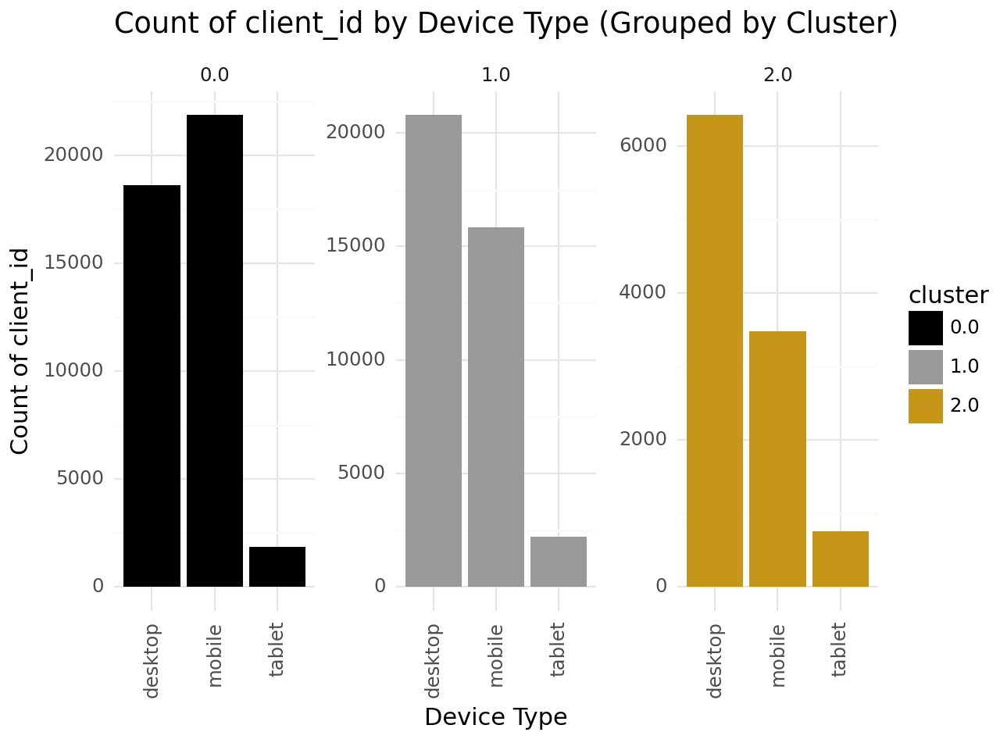

In [ ]:
device_counts = merged_data.groupby(['cluster', 'device']).size().reset_index(name='count')

top_3_devices = (
    device_counts.groupby('cluster')
    .apply(lambda x: x.nlargest(3, 'count'))
    .reset_index(drop=True)
)

custom_colors = [ '#000000','#999999','#c59617']

# Convert 'cluster' to a categorical variable
top_3_devices['cluster'] = pd.Categorical(top_3_devices['cluster'])

bar_chart = (
    p9.ggplot(top_3_devices, p9.aes(x='device', y='count', fill='cluster')) +
    p9.geom_col(position='dodge') +
    p9.facet_wrap('cluster', scales='free') +
    p9.xlab('Device Type') +
    p9.ylab('Count of client_id') +
    p9.ggtitle('Count of client_id by Device Type (Grouped by Cluster)') +
    p9.theme_minimal() +
    p9.scale_fill_manual(values=custom_colors) +
    p9.theme(axis_text_x=p9.element_text(rotation=90))
)

print(bar_chart)

### Browser Type

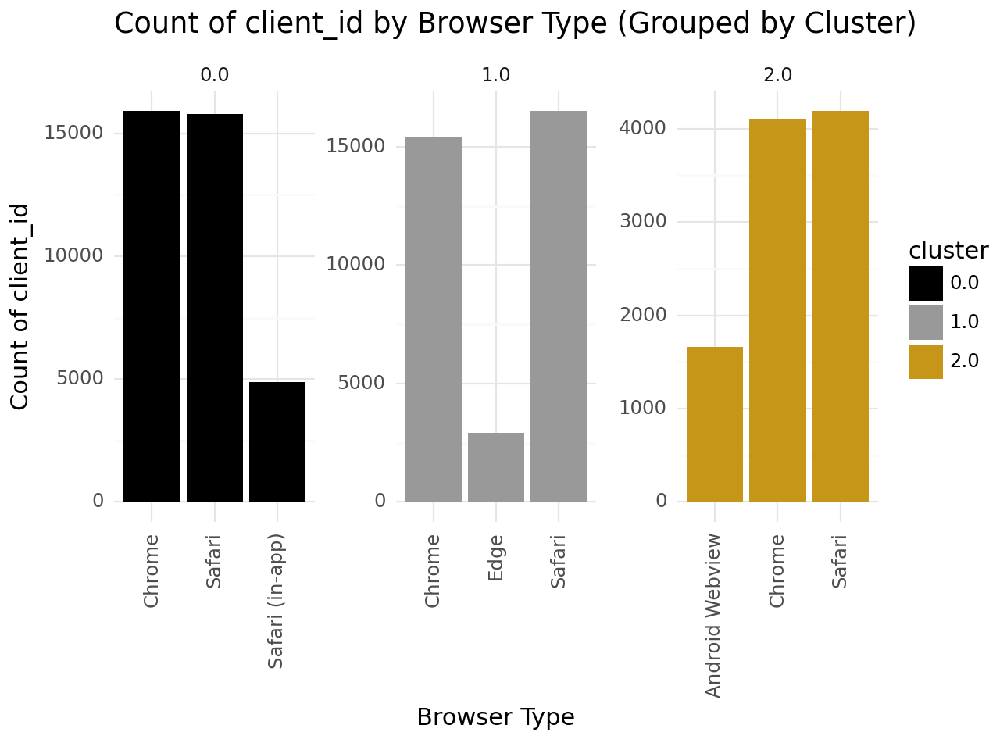

In [ ]:
device_counts = merged_data.groupby(['cluster', 'Device_Browser']).size().reset_index(name='count')

top_3_browsers = (
    device_counts.groupby('cluster')
    .apply(lambda x: x.nlargest(3, 'count'))
    .reset_index(drop=True)
)

custom_colors = [ '#000000','#999999','#c59617']

# Convert 'cluster' to a categorical variable
top_3_browsers['cluster'] = pd.Categorical(top_3_browsers['cluster'])

bar_chart = (
    p9.ggplot(top_3_browsers, p9.aes(x='Device_Browser', y='count', fill='cluster')) +
    p9.geom_col(position='dodge') +
    p9.facet_wrap('cluster', scales='free') +
    p9.xlab('Browser Type') +
    p9.ylab('Count of client_id') +
    p9.ggtitle('Count of client_id by Browser Type (Grouped by Cluster)') +
    p9.theme_minimal() +
    p9.scale_fill_manual(values=custom_colors) +
    p9.theme(axis_text_x=p9.element_text(rotation=90))
)

print(bar_chart)

In [ ]:
grouped_data = merged_data.groupby('cluster')
engagement_level1 = grouped_data['engagement_level'].value_counts()
print(engagement_level1)

cluster  engagement_level                
0.000    Less Engaged                        36759
         Low Engaged on Design Pages          3515
         Low Engaged on Decision Pages         850
         Mid Engaged on Design Pages           775
         Highly Engaged on Design Pages        185
         Mid Engaged on Decision Pages         119
         Low Engaged on Loyalty Pages           88
         Low Engaged on Pro Pages               82
         Highly Engaged on Decision Pages       15
         Mid Engaged on Loyalty Pages            9
1.000    Mid Engaged on Design Pages         10068
         Highly Engaged on Design Pages       9637
         Low Engaged on Design Pages          7849
         Less Engaged                         4181
         Mid Engaged on Decision Pages        2370
         Low Engaged on Decision Pages        1649
         Highly Engaged on Decision Pages     1377
         Low Engaged on Pro Pages              463
         Mid Engaged on Pro Pages       

## Engagement Level

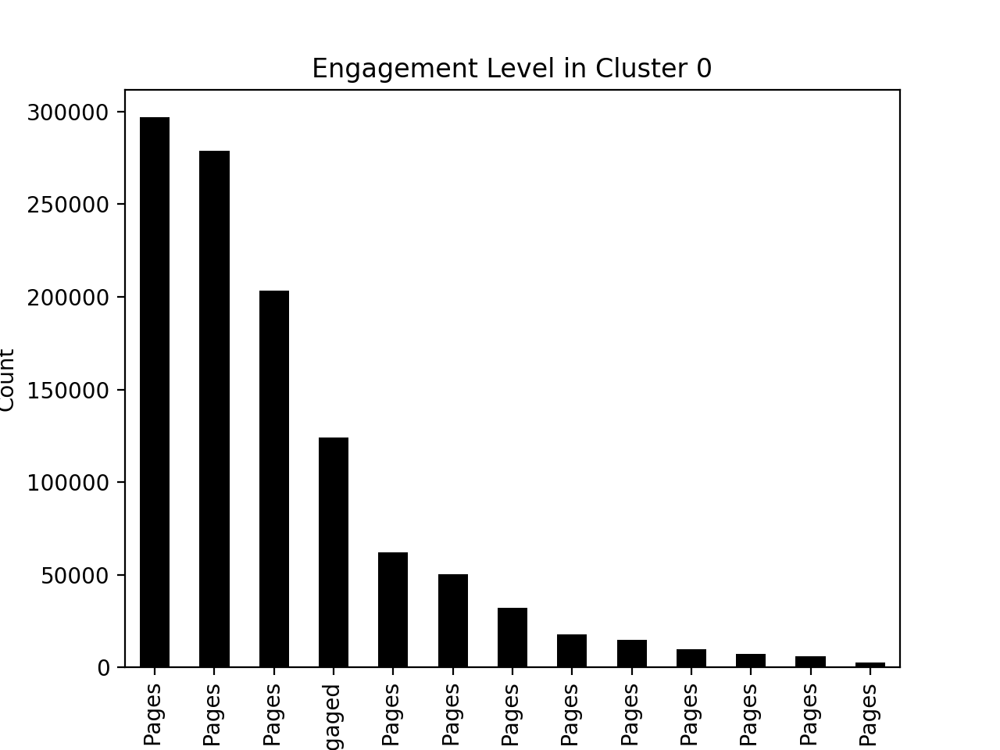

In [ ]:
cluster_0_data = merged_data[merged_data['cluster'] == 0]

# Calculate the value counts for engagement levels in Cluster 0
engagement_level_cluster_0 = cluster_0_data['engagement_level'].value_counts()

# Create a bar chart
engagement_level_cluster_0.plot(kind='bar', color = '#000000')

# Adding labels and title
plt.xlabel('Engagement Level')
plt.ylabel('Count')
plt.title('Engagement Level in Cluster 0')

# Display the plot
plt.show()

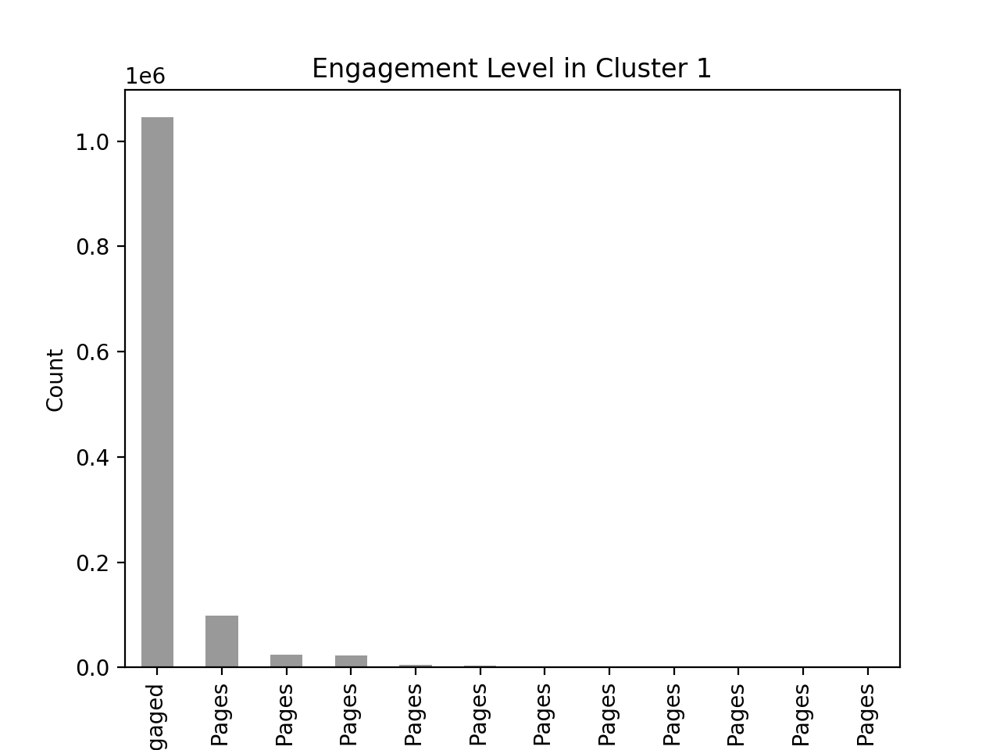

In [ ]:
cluster_1_data = merged_data[merged_data['cluster'] == 1]

# Calculate the value counts for engagement levels in Cluster 0
engagement_level_cluster_1 = cluster_1_data['engagement_level'].value_counts()

# Create a bar chart
engagement_level_cluster_1.plot(kind='bar', color = '#999999')

# Adding labels and title
plt.xlabel('Engagement Level')
plt.ylabel('Count')
plt.title('Engagement Level in Cluster 1')

# Display the plot
plt.show()

In [ ]:
cluster_2_data = merged_data[merged_data['cluster'] == 2]

# Calculate the value counts for engagement levels in Cluster 2
engagement_level_cluster_2 = cluster_2_data['engagement_level'].value_counts()

# Create a bar chart
engagement_level_cluster_2.plot(kind='bar', color ='#c59617')

# Adding labels and title
plt.xlabel('Engagement Level')
plt.ylabel('Count')
plt.title('Engagement Level in Cluster 2')

# Display the plot
plt.show()


/tmp/ipykernel_135/285555996.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
/tmp/ipykernel_135/285555996.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
/tmp/ipykernel_135/285555996.py:32: UserWarning: FixedFormatter should only be used together with FixedLocator


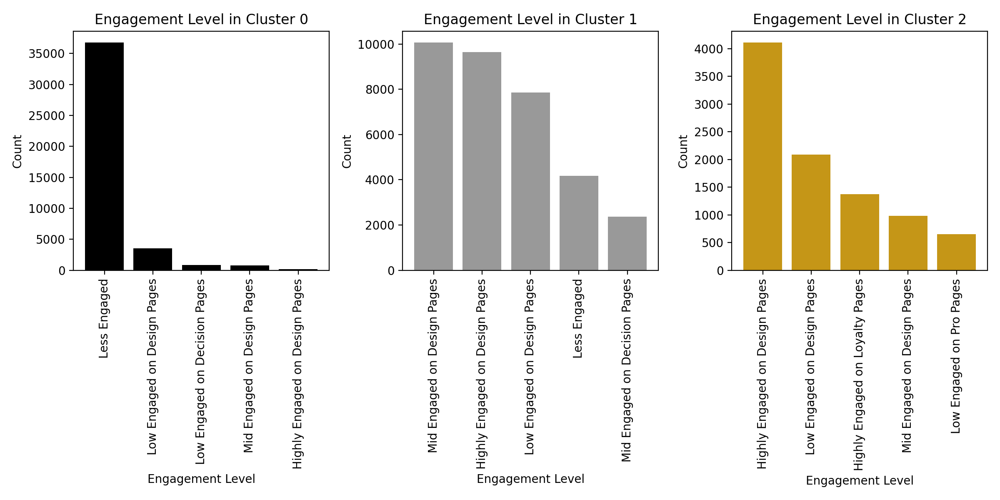

In [ ]:

cluster_0_data = merged_data[merged_data['cluster'] == 0]
engagement_level_cluster_0 = cluster_0_data['engagement_level'].value_counts().nlargest(5)

cluster_1_data = merged_data[merged_data['cluster'] == 1]
engagement_level_cluster_1 = cluster_1_data['engagement_level'].value_counts().nlargest(5)

cluster_2_data = merged_data[merged_data['cluster'] == 2]
engagement_level_cluster_2 = cluster_2_data['engagement_level'].value_counts().nlargest(5)

# Create subplots for each cluster
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 6))

# Plot for Cluster 0
axes[0].bar(engagement_level_cluster_0.index, engagement_level_cluster_0.values, color='#000000')
axes[0].set_xlabel('Engagement Level')
axes[0].set_ylabel('Count')
axes[0].set_title('Engagement Level in Cluster 0')
axes[0].set_xticklabels(engagement_level_cluster_0.index, rotation=90)  # Rotate x-axis labels by 90 degrees

# Plot for Cluster 1
axes[1].bar(engagement_level_cluster_1.index, engagement_level_cluster_1.values, color='#999999')
axes[1].set_xlabel('Engagement Level')
axes[1].set_ylabel('Count')
axes[1].set_title('Engagement Level in Cluster 1')
axes[1].set_xticklabels(engagement_level_cluster_1.index, rotation=90)  # Rotate x-axis labels by 90 degrees

# Plot for Cluster 2
axes[2].bar(engagement_level_cluster_2.index, engagement_level_cluster_2.values, color='#c59617')
axes[2].set_xlabel('Engagement Level')
axes[2].set_ylabel('Count')
axes[2].set_title('Engagement Level in Cluster 2')
axes[2].set_xticklabels(engagement_level_cluster_2.index, rotation=90)  # Rotate x-axis labels by 90 degrees

# Adjust the spacing between subplots
plt.tight_layout()

# Display the subplots
plt.show()


In [ ]:
grouped_data = merged_data.groupby('cluster')
page_location = grouped_data['page_location'].value_counts()
page_location

cluster  page_location                                                                                                                                                                                                            
0.000    https://www.cambriausa.com/quartz-colors/                                                                                                                                                                                    134911
         https://www.cambriausa.com/                                                                                                                                                                                                   99438
         https://www.cambriausa.com/quartz-colors/#!/                                                                                                                                                                                  78502
         https://www.cambriausa.com/#!/                       

In [ ]:
df_cluster1 = merged_data.groupby('cluster').agg({
    'client_id':'count',  
    'purchase' : 'sum',
    'page_count' : 'mean',
    'total_engagement_time': 'mean',
    'bounces':'mean',
    'bounce_rate':'mean',
    'engagement_rate':'mean',
    'client_id':'count',
    'avg_pageviews_per_session':'mean',

    'engaged_sessions':'mean',
}).reset_index()
df_cluster1

,cluster,client_id,purchase,page_count,total_engagement_time,bounces,bounce_rate,engagement_rate,avg_pageviews_per_session,engaged_sessions
0,0.000,41089,9,3.131,8.756,6.184,0.976,0.024,1.159,0.205
1,1.000,39657,65,12.075,266.867,23.996,0.757,0.243,1.869,5.494
2,2.000,10070,12,29.545,1960.877,80.055,0.688,0.312,1.585,29.483


In [ ]:
    df_cluster2 = merged_data.groupby('cluster').agg({
    'trade_lead_form_submit' : 'sum',
    'residentialconsumer_lead_form_submit' : 'sum',
    'contactus_form_submit' : 'sum',
    }).reset_index()
df_cluster2

pageview totals by cluster

In [ ]:
# Group the data and aggregate by cluster
df_cluster_all_pageviews = merged_data.groupby('cluster').agg({
#consumer
    'total_dealerlocator_pageviews': 'sum',
    'total_design_palette_pageviews': 'sum',
    'total_samples_pageviews': 'sum',
    'contactus_form_submit' : 'sum',
    'residentialconsumer_lead_form_submit' : 'sum',
    # brand new consumers?
    'total_cambriastyle_pageviews': 'sum',
    'total_inspiration_pageviews': 'sum',
    'total_samples_pageviews': 'sum',
   #consumer decisions
    'total_financebycambria_pageviews': 'sum',
    'total_planningcare_pageviews': 'sum',
    'total_galleries_pageviews': 'sum',
#trade
    'total_professionals_pageviews': 'sum',
    'total_commercial_pageviews': 'sum',
    'total_specify_pageviews': 'sum',
    'total_pro_locations_pageviews': 'sum',
    'total_case_studies_pageviews': 'sum',
    'trade_lead_form_submit' : 'sum',
    'contactus_form_submit' : 'sum',
    'total_cambriastyle_pageviews': 'sum',
    # designers
    'total_inspiration_pageviews': 'sum',
    'total_samples_pageviews': 'sum',
    'total_cambriastyle_pageviews': 'sum',
    'total_design_palette_pageviews': 'sum',
}).reset_index()

"""
dealerlocator - consumer
designpalette - consumer but could be a designer
samples - mostly consumer but we have seen instances of trade ordering (pro_samples should be pro only)
pro-locations - trade
contact us - mix consumer/trade
case-studies - pro
cambria style - mix consumer/trade (loyal consumers or partners)
inspiration - mostly consumers but could be a designer
finance - consumers
planningcare - consumers
galleries - consumers
"""

df_cluster_all_pageviews = df_cluster_all_pageviews.applymap('{:,}'.format)
df_cluster_all_pageviews

page engagement time grouped by cluster

In [ ]:
 page_engagement_time = merged_data.groupby('cluster').agg({
    'total_engagement_time': 'mean',
#consumer
    'dealerlocator_pages_engagement_time': 'mean',
    'design_palette_pages_engagement_time': 'mean',
    'samples_pages_engagement_time': 'mean',   
   # new consumer
    'cambriastyle_pages_engagement_time': 'mean',
    'inspiration_pages_engagement_time': 'mean', 
    #consumer decisions
    'financebycambria_pages_engagement_time': 'mean',
    'planningcare_pages_engagement_time': 'mean', 
    'galleries_pages_engagement_time': 'mean',
 #trade
    'pro_pages_engagement_time': 'mean', 
    'commercial_pages_engagement_time': 'mean',
    'specify_pages_engagement_time': 'mean', 
    'case_studies_pages_engagement_time': 'mean',
    'pro_locations_pages_engagement_time': 'mean',


       }).reset_index()
page_engagement_time

In [ ]:
 df_cluster_avg_time  = merged_data.groupby('cluster').agg({
    'avg_time_on_pro_pages': 'mean', 
    'avg_time_on_design_pages': 'mean',
    'avg_time_on_decision_pages': 'mean', 
    'avg_time_on_loyalty_pages': 'mean'
       }).reset_index()
df_cluster_avg_time

## RadViz

RadViz is a multivariate data visualization algorithm that places each feature dimension uniformly around the circumference of a circle. It then plots points on the interior of the circle, normalizing their values along the axes extending from the center to each arc. This approach enables the visualization of numerous dimensions that can fit on the circle, significantly expanding the visualization's dimensionality. We employed this method to identify separability among clusters. Data points exhibiting extreme characteristics will appear on the outer edges of the circle, while those with less pronounced differences will mostly be located closer to the circle's center.

In [ ]:
merged_rv = np.random.rand(150, 4)


df = pd.DataFrame(data=merged_rv, columns=['avg_time_on_pro_pages', 'avg_time_on_design_pages', 'avg_time_on_decision_pages', 'avg_time_on_loyalty_pages'])
df['cluster'] = np.random.randint(2, size=150)


plt.figure(figsize=(10, 6), dpi=600)
radviz(df, 'cluster', color=['#c59617', '#000000'], cmap='coolwarm')


plt.title('RadViz Plot - Avg time by page types')
plt.xlabel('Features')
plt.ylabel('Cluster')
plt.legend()


plt.show()


/root/venv/lib/python3.9/site-packages/pandas/plotting/_matplotlib/misc.py:185: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


In [ ]:
merged_rv = np.random.rand(150, 4)


df = pd.DataFrame(data=merged_rv, columns=['avg_time_on_pro_pages', 'avg_time_on_design_pages', 'avg_time_on_decision_pages', 'avg_time_on_loyalty_pages'])
df['cluster'] = np.random.randint(2, size=150)


plt.figure(figsize=(10, 6), dpi=600)
radviz(df, 'cluster', color=['#c59617', '#000000'], cmap='coolwarm')


plt.title('RadViz Plot - Avg time by page types')
plt.xlabel('Features')
plt.ylabel('Cluster')
plt.legend()


plt.show()

## Engagement Time

In order to help identify the clusters we used Engagement Time with the understanding that professionals are going to have a more straight line approach to using the website; consumers are going to have a more randomized approach because they often aren't as familiar with the website, so they take more time to explore

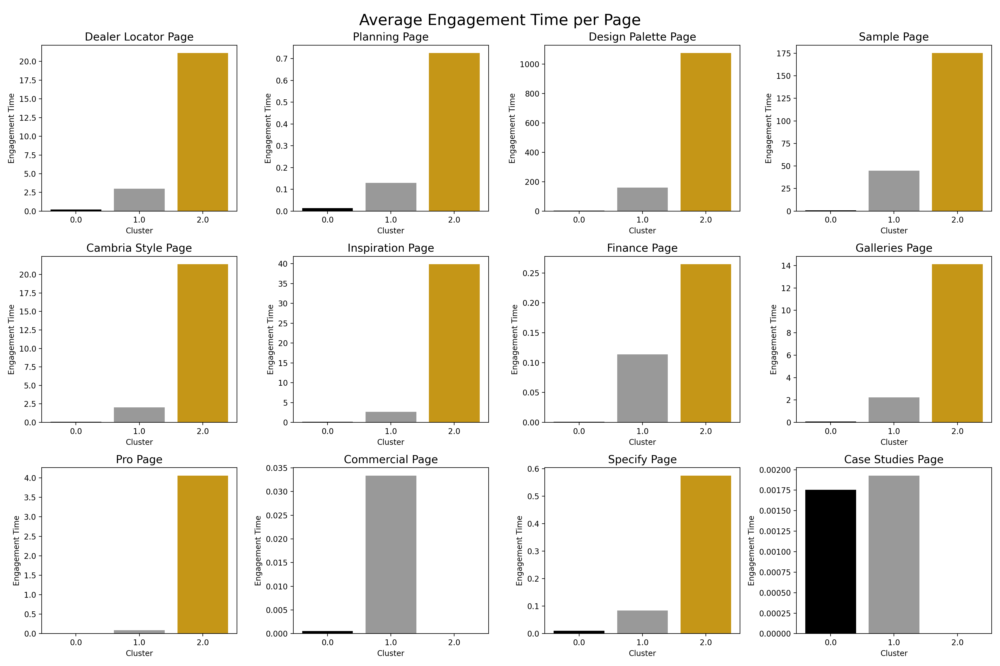

In [ ]:
dealerlocatorengagementtime_by_cluster = merged_data.groupby('cluster')['dealerlocator_pages_engagement_time'].mean().reset_index()
planningengagementtime_by_cluster = merged_data.groupby('cluster')['planningcare_pages_engagement_time'].mean().reset_index()
design_palette_engagementtime_by_cluster = merged_data.groupby('cluster')['design_palette_pages_engagement_time'].mean().reset_index()
sample_time_by_cluster = merged_data.groupby('cluster')['samples_pages_engagement_time'].mean().reset_index()
cambria_style_time_by_cluster = merged_data.groupby('cluster')['cambriastyle_pages_engagement_time'].mean().reset_index()
inspiration_time_by_cluster = merged_data.groupby('cluster')['inspiration_pages_engagement_time'].mean().reset_index()
finance_time_by_cluster = merged_data.groupby('cluster')['financebycambria_pages_engagement_time'].mean().reset_index()
galleries_time_by_cluster = merged_data.groupby('cluster')['galleries_pages_engagement_time'].mean().reset_index()
pro_pages_time_by_cluster = merged_data.groupby('cluster')['pro_pages_engagement_time'].mean().reset_index()
commercial_time_by_cluster = merged_data.groupby('cluster')['commercial_pages_engagement_time'].mean().reset_index()
specify_time_by_cluster = merged_data.groupby('cluster')['specify_pages_engagement_time'].mean().reset_index()
case_study_time_by_cluster = merged_data.groupby('cluster')['case_studies_pages_engagement_time'].mean().reset_index()
prosengagementtime_by_cluster = merged_data.groupby('cluster')['pro_locations_pages_engagement_time'].mean().reset_index()
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(18, 12))

# Define colors for each cluster
cluster_colors = [ '#000000','#999999','#c59617']

# Plot the dealer locator engagement time subplot
for i, cluster in enumerate(dealerlocatorengagementtime_by_cluster['cluster']):
    axs[0, 0].bar(cluster, dealerlocatorengagementtime_by_cluster.loc[i, 'dealerlocator_pages_engagement_time'], color=cluster_colors[i])
axs[0, 0].set_title('Dealer Locator Page', fontsize=14)
axs[0, 0].set_xlabel('Cluster')
axs[0, 0].set_ylabel('Engagement Time')
axs[0, 0].set_xticks(dealerlocatorengagementtime_by_cluster['cluster'])  # Set x-axis ticks to cluster values
axs[0, 0].set_xticklabels(dealerlocatorengagementtime_by_cluster['cluster'])  # Set x-axis labels to cluster values

# Plot the planning engagement time subplot
for i, cluster in enumerate(planningengagementtime_by_cluster['cluster']):
    axs[0, 1].bar(cluster, planningengagementtime_by_cluster.loc[i, 'planningcare_pages_engagement_time'], color=cluster_colors[i])
axs[0, 1].set_title('Planning Page', fontsize=14)
axs[0, 1].set_xlabel('Cluster')
axs[0, 1].set_ylabel('Engagement Time')
axs[0, 1].set_xticks(planningengagementtime_by_cluster['cluster'])
axs[0, 1].set_xticklabels(planningengagementtime_by_cluster['cluster'])

# Plot the design palette engagement time subplot
for i, cluster in enumerate(design_palette_engagementtime_by_cluster['cluster']):
    axs[0, 2].bar(cluster, design_palette_engagementtime_by_cluster.loc[i, 'design_palette_pages_engagement_time'], color=cluster_colors[i])
axs[0, 2].set_title('Design Palette Page', fontsize=14)
axs[0, 2].set_xlabel('Cluster')
axs[0, 2].set_ylabel('Engagement Time')
axs[0, 2].set_xticks(design_palette_engagementtime_by_cluster['cluster'])
axs[0, 2].set_xticklabels(design_palette_engagementtime_by_cluster['cluster'])

# Plot the sample page engagement time subplot
for i, cluster in enumerate(sample_time_by_cluster['cluster']):
    axs[0, 3].bar(cluster, sample_time_by_cluster.loc[i, 'samples_pages_engagement_time'], color=cluster_colors[i])
axs[0, 3].set_title('Sample Page', fontsize=14)
axs[0, 3].set_xlabel('Cluster')
axs[0, 3].set_ylabel('Engagement Time')
axs[0, 3].set_xticks(sample_time_by_cluster['cluster'])
axs[0, 3].set_xticklabels(sample_time_by_cluster['cluster'])

# Plot the Cambria Style page engagement time subplot
for i, cluster in enumerate(cambria_style_time_by_cluster['cluster']):
    axs[1, 0].bar(cluster, cambria_style_time_by_cluster.loc[i, 'cambriastyle_pages_engagement_time'], color=cluster_colors[i])
axs[1, 0].set_title('Cambria Style Page', fontsize=14)
axs[1, 0].set_xlabel('Cluster')
axs[1, 0].set_ylabel('Engagement Time')
axs[1, 0].set_xticks(cambria_style_time_by_cluster['cluster'])
axs[1, 0].set_xticklabels(cambria_style_time_by_cluster['cluster'])

# Plot the Inspiration page engagement time subplot
for i, cluster in enumerate(inspiration_time_by_cluster['cluster']):
    axs[1, 1].bar(cluster, inspiration_time_by_cluster.loc[i, 'inspiration_pages_engagement_time'], color=cluster_colors[i])
axs[1, 1].set_title('Inspiration Page', fontsize=14)
axs[1, 1].set_xlabel('Cluster')
axs[1, 1].set_ylabel('Engagement Time')
axs[1, 1].set_xticks(inspiration_time_by_cluster['cluster'])
axs[1, 1].set_xticklabels(inspiration_time_by_cluster['cluster'])

# Plot the Finance page engagement time subplot
for i, cluster in enumerate(finance_time_by_cluster['cluster']):
    axs[1, 2].bar(cluster, finance_time_by_cluster.loc[i, 'financebycambria_pages_engagement_time'], color=cluster_colors[i])
axs[1, 2].set_title('Finance Page', fontsize=14)
axs[1, 2].set_xlabel('Cluster')
axs[1, 2].set_ylabel('Engagement Time')
axs[1, 2].set_xticks(finance_time_by_cluster['cluster'])
axs[1, 2].set_xticklabels(finance_time_by_cluster['cluster'])

# Plot the Galleries page engagement time subplot
for i, cluster in enumerate(galleries_time_by_cluster['cluster']):
    axs[1, 3].bar(cluster, galleries_time_by_cluster.loc[i, 'galleries_pages_engagement_time'], color=cluster_colors[i])
axs[1, 3].set_title('Galleries Page', fontsize=14)
axs[1, 3].set_xlabel('Cluster')
axs[1, 3].set_ylabel('Engagement Time')
axs[1, 3].set_xticks(galleries_time_by_cluster['cluster'])
axs[1, 3].set_xticklabels(galleries_time_by_cluster['cluster'])

# Plot the Pro Pages engagement time subplot
for i, cluster in enumerate(pro_pages_time_by_cluster['cluster']):
    axs[2, 0].bar(cluster, pro_pages_time_by_cluster.loc[i, 'pro_pages_engagement_time'], color=cluster_colors[i])
axs[2, 0].set_title('Pro Page', fontsize=14)
axs[2, 0].set_xlabel('Cluster')
axs[2, 0].set_ylabel('Engagement Time')
axs[2, 0].set_xticks(pro_pages_time_by_cluster['cluster'])
axs[2, 0].set_xticklabels(pro_pages_time_by_cluster['cluster'])

# Plot the Commercial Pages engagement time subplot
for i, cluster in enumerate(commercial_time_by_cluster['cluster']):
    axs[2, 1].bar(cluster, commercial_time_by_cluster.loc[i, 'commercial_pages_engagement_time'], color=cluster_colors[i])
axs[2, 1].set_title('Commercial Page', fontsize=14)
axs[2, 1].set_xlabel('Cluster')
axs[2, 1].set_ylabel('Engagement Time')
axs[2, 1].set_xticks(commercial_time_by_cluster['cluster'])
axs[2, 1].set_xticklabels(commercial_time_by_cluster['cluster'])

# Plot the Specify Pages engagement time subplot
for i, cluster in enumerate(specify_time_by_cluster['cluster']):
    axs[2, 2].bar(cluster, specify_time_by_cluster.loc[i, 'specify_pages_engagement_time'], color=cluster_colors[i])
axs[2, 2].set_title('Specify Page', fontsize=14)
axs[2, 2].set_xlabel('Cluster')
axs[2, 2].set_ylabel('Engagement Time')
axs[2, 2].set_xticks(specify_time_by_cluster['cluster'])
axs[2, 2].set_xticklabels(specify_time_by_cluster['cluster'])

# Plot the Case Studies engagement time subplot
for i, cluster in enumerate(case_study_time_by_cluster['cluster']):
    axs[2, 3].bar(cluster, case_study_time_by_cluster.loc[i, 'case_studies_pages_engagement_time'], color=cluster_colors[i])
axs[2, 3].set_title('Case Studies Page', fontsize=14)
axs[2, 3].set_xlabel('Cluster')
axs[2, 3].set_ylabel('Engagement Time')
axs[2, 3].set_xticks(case_study_time_by_cluster['cluster'])
axs[2, 3].set_xticklabels(case_study_time_by_cluster['cluster'])

fig.suptitle('Average Engagement Time per Page', fontsize=20)
# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()





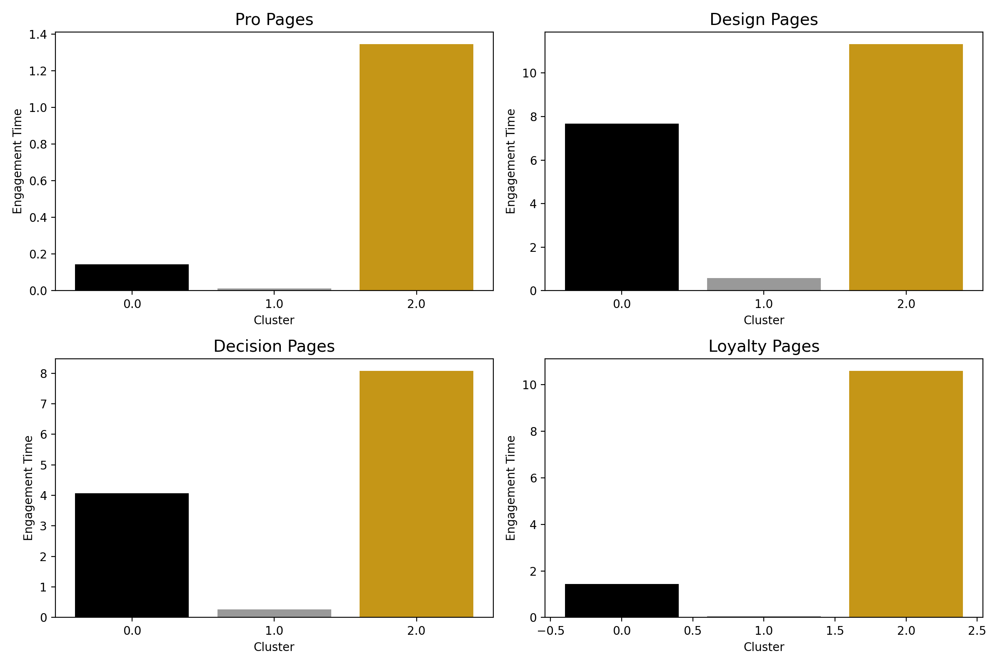

In [ ]:
# Group the data by cluster and calculate the mean engagement time for each cluster
avg_time_on_pro_page = merged_data.groupby('cluster')['avg_time_on_pro_pages'].mean().reset_index()
avg_time_on_design_page = merged_data.groupby('cluster')['avg_time_on_design_pages'].mean().reset_index()
avg_time_on_decision_page = merged_data.groupby('cluster')['avg_time_on_decision_pages'].mean().reset_index()
avg_time_on_loyalty_page = merged_data.groupby('cluster')['avg_time_on_loyalty_pages'].mean().reset_index()

# Create a figure and an array of subplots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))
custom_colors = [ '#000000','#999999','#c59617']

axs[0, 0].bar(avg_time_on_pro_page['cluster'], avg_time_on_pro_page['avg_time_on_pro_pages'], color=cluster_colors)
axs[0, 0].set_title('Pro Pages', fontsize=14)
axs[0, 0].set_xlabel('Cluster')
axs[0, 0].set_ylabel('Engagement Time')
axs[0, 0].set_xticks(avg_time_on_pro_page['cluster'])  
axs[0, 0].set_xticklabels(avg_time_on_pro_page['cluster']) 

axs[0, 1].bar(avg_time_on_design_page['cluster'], avg_time_on_design_page['avg_time_on_design_pages'], color=cluster_colors)
axs[0, 1].set_title('Design Pages', fontsize=14)
axs[0, 1].set_xlabel('Cluster')
axs[0, 1].set_ylabel('Engagement Time')
axs[0, 1].set_xticks(avg_time_on_design_page['cluster'])  
axs[0, 1].set_xticklabels(avg_time_on_design_page['cluster']) 

axs[1, 0].bar(avg_time_on_decision_page['cluster'], avg_time_on_decision_page['avg_time_on_decision_pages'], color=cluster_colors)
axs[1, 0].set_title('Decision Pages', fontsize=14)
axs[1, 0].set_xlabel('Cluster')
axs[1, 0].set_ylabel('Engagement Time')
axs[1, 0].set_xticks(avg_time_on_decision_page['cluster'])  
axs[1, 0].set_xticklabels(avg_time_on_decision_page['cluster']) 

axs[1, 1].bar(avg_time_on_loyalty_page['cluster'], avg_time_on_loyalty_page['avg_time_on_loyalty_pages'], color=cluster_colors)
axs[1, 1].set_title('Loyalty Pages', fontsize=14)
axs[1, 1].set_xlabel('Cluster')
axs[1, 1].set_ylabel('Engagement Time')
axs[1, 0].set_xticks(avg_time_on_loyalty_page['cluster'])  
axs[1, 0].set_xticklabels(avg_time_on_loyalty_page['cluster']) 
# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()


In [ ]:
total_engagement_time_by_cluster = merged_data.groupby('cluster')['total_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(total_engagement_time_by_cluster['cluster'], total_engagement_time_by_cluster['total_engagement_time'])
plt.title('Avg Total Engagement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(total_engagement_time_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
dealerlocatorengagementtime_by_cluster = merged_data.groupby('cluster')['dealerlocator_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(dealerlocatorengagementtime_by_cluster['cluster'], dealerlocatorengagementtime_by_cluster['dealerlocator_pages_engagement_time'])
plt.title('Avg Dealer Locator Page Engagement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(page_engagement_time['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
planningengagementtime_by_cluster = merged_data.groupby('cluster')['planningcare_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(planningengagementtime_by_cluster['cluster'], planningengagementtime_by_cluster['planningcare_pages_engagement_time'])
plt.title('Planning Page Engangement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(planningengagementtime_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
prosengagementtime_by_cluster = merged_data.groupby('cluster')['pro_locations_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(prosengagementtime_by_cluster['cluster'], prosengagementtime_by_cluster['pro_locations_pages_engagement_time'])
plt.title('Pro Locations Page Engangement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(prosengagementtime_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
avg_pro_page_engagement_time = merged_data.groupby('cluster')['avg_time_on_pro_pages'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(avg_pro_page_engagement_time['cluster'], avg_pro_page_engagement_time['avg_time_on_pro_pages'])
plt.title('AVG Pro pages engagement time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(avg_pro_page_engagement_time['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
design_palette_time_by_cluster = merged_data.groupby('cluster')['design_palette_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(design_palette_time_by_cluster['cluster'], design_palette_time_by_cluster['design_palette_pages_engagement_time'])
plt.title('AVG design palette Engagement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(design_palette_time_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
inspiration_time_by_cluster = merged_data.groupby('cluster')['inspiration_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(inspiration_time_by_cluster['cluster'], inspiration_time_by_cluster['inspiration_pages_engagement_time'])
plt.title('AVG InspirationPage Engagement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(inspiration_time_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
finance_time_by_cluster = merged_data.groupby('cluster')['financebycambria_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(finance_time_by_cluster['cluster'], finance_time_by_cluster['financebycambria_pages_engagement_time'])
plt.title('AVG Finance Page Engagement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(finance_time_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
gallaries_time_by_cluster = merged_data.groupby('cluster')['galleries_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(gallaries_time_by_cluster['cluster'], gallaries_time_by_cluster['galleries_pages_engagement_time'])
plt.title('AVG Gallaries Page Engagement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(gallaries_time_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
commercial_time_by_cluster = merged_data.groupby('cluster')['commercial_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(commercial_time_by_cluster['cluster'], commercial_time_by_cluster['commercial_pages_engagement_time'])
plt.title('AVG Commercial Page Engagement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(commercial_time_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
specify_time_by_cluster = merged_data.groupby('cluster')['specify_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(specify_time_by_cluster['cluster'], specify_time_by_cluster['specify_pages_engagement_time'])
plt.title('AVG Specify Page Engagement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(specify_time_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
case_study_time_by_cluster = merged_data.groupby('cluster')['case_studies_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(case_study_time_by_cluster['cluster'], case_study_time_by_cluster['case_studies_pages_engagement_time'])
plt.title('AVG Case Study Page Engagement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Engagement Time')
plt.xticks(case_study_time_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
cambria_style_time_by_cluster = merged_data.groupby('cluster')['cambriastyle_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(cambria_style_time_by_cluster['cluster'], cambria_style_time_by_cluster['cambriastyle_pages_engagement_time'])
plt.title('AVG Cambria Style Engagement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(cambria_style_time_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
sample_time_by_cluster = merged_data.groupby('cluster')['samples_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(sample_time_by_cluster['cluster'], sample_time_by_cluster['samples_pages_engagement_time'])
plt.title('AVG Sample Engagement Time by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(sample_time_by_cluster
['cluster'])
plt.tight_layout()
plt.show()

##  Pageviews

Now that we have found a pattern in the engagement time of each cluster, we can look at pageviews to start assigning characteristics to the clusters.

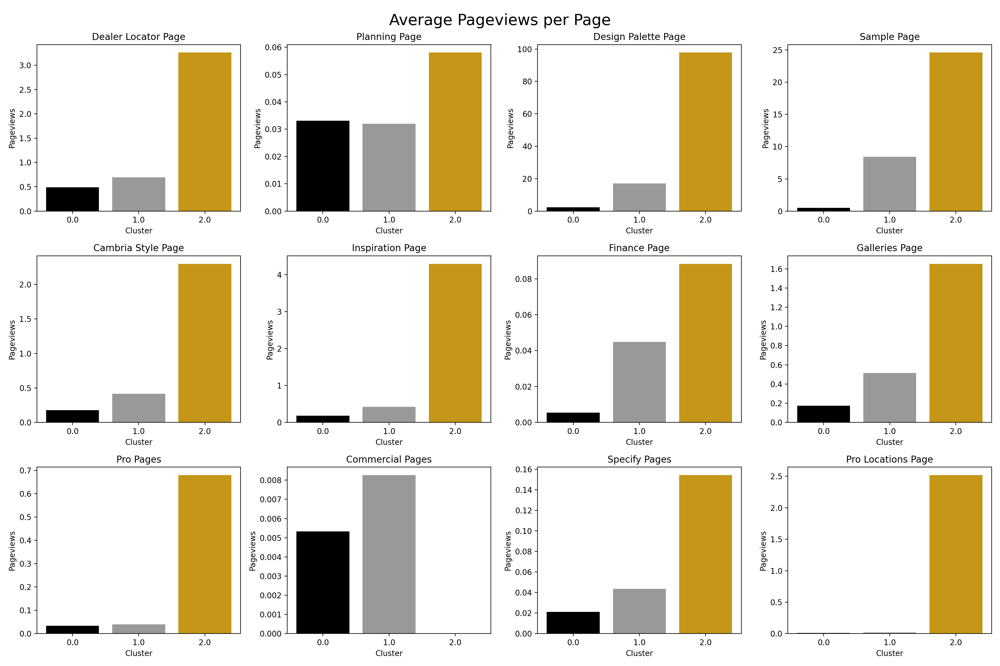

In [ ]:
dealerlocatorpageviews_by_cluster = merged_data.groupby('cluster')['total_dealerlocator_pageviews'].mean().reset_index()
planningpageviews_by_cluster = merged_data.groupby('cluster')['total_planningcare_pageviews'].mean().reset_index()
design_palette_pageviews_by_cluster = merged_data.groupby('cluster')['total_design_palette_pageviews'].mean().reset_index()
sample_pageviews_by_cluster = merged_data.groupby('cluster')['total_samples_pageviews'].mean().reset_index()
cambriastyle_pageviews_by_cluster = merged_data.groupby('cluster')['total_cambriastyle_pageviews'].mean().reset_index()
inspiration_pageviews_by_cluster = merged_data.groupby('cluster')['total_inspiration_pageviews'].mean().reset_index()
finance_pageviews_by_cluster = merged_data.groupby('cluster')['total_financebycambria_pageviews'].mean().reset_index()
galleries_pageveiws_by_cluster = merged_data.groupby('cluster')['total_galleries_pageviews'].mean().reset_index()
pro_pages_pageviews_by_cluster = merged_data.groupby('cluster')['total_professionals_pageviews'].mean().reset_index()
commercial_pageviews_by_cluster = merged_data.groupby('cluster')['total_commercial_pageviews'].mean().reset_index()
specify_pageviews_cluster = merged_data.groupby('cluster')['total_specify_pageviews'].mean().reset_index()
case_study_pageviews_by_cluster = merged_data.groupby('cluster')['total_case_studies_pageviews'].mean().reset_index()
pro_location_pageviews_by_cluster = merged_data.groupby('cluster')['total_pro_locations_pageviews'].mean().reset_index()

fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(18, 12))
custom_colors = [ '#000000','#999999','#c59617']

for i, cluster in enumerate(dealerlocatorpageviews_by_cluster['cluster']):
    axs[0, 0].bar(cluster, dealerlocatorpageviews_by_cluster.loc[i, 'total_dealerlocator_pageviews'], color=cluster_colors[i])
axs[0, 0].set_title('Dealer Locator Page')
axs[0, 0].set_xlabel('Cluster')
axs[0, 0].set_ylabel('Pageviews')
axs[0, 0].set_xticks(dealerlocatorpageviews_by_cluster['cluster'])
axs[0, 0].set_xticklabels(dealerlocatorpageviews_by_cluster['cluster'])

for i, cluster in enumerate(planningpageviews_by_cluster['cluster']):
    axs[0, 1].bar(cluster, planningpageviews_by_cluster.loc[i, 'total_planningcare_pageviews'], color=cluster_colors[i])
axs[0, 1].set_title('Planning Page')
axs[0, 1].set_xlabel('Cluster')
axs[0, 1].set_ylabel('Pageviews')
axs[0, 1].set_xticks(planningpageviews_by_cluster['cluster'])
axs[0, 1].set_xticklabels(planningpageviews_by_cluster['cluster'])

for i, cluster in enumerate(design_palette_pageviews_by_cluster['cluster']):
    axs[0, 2].bar(cluster, design_palette_pageviews_by_cluster.loc[i, 'total_design_palette_pageviews'], color=cluster_colors[i])
axs[0, 2].set_title('Design Palette Page')
axs[0, 2].set_xlabel('Cluster')
axs[0, 2].set_ylabel('Pageviews')
axs[0, 2].set_xticks(design_palette_pageviews_by_cluster['cluster'])
axs[0, 2].set_xticklabels(design_palette_pageviews_by_cluster['cluster'])

for i, cluster in enumerate(sample_pageviews_by_cluster['cluster']):
    axs[0, 3].bar(cluster, sample_pageviews_by_cluster.loc[i, 'total_samples_pageviews'], color=cluster_colors[i])
axs[0, 3].set_title('Sample Page')
axs[0, 3].set_xlabel('Cluster')
axs[0, 3].set_ylabel('Pageviews')
axs[0, 3].set_xticks(sample_pageviews_by_cluster['cluster'])
axs[0, 3].set_xticklabels(sample_pageviews_by_cluster['cluster'])

for i, cluster in enumerate(cambriastyle_pageviews_by_cluster['cluster']):
    axs[1, 0].bar(cluster, cambriastyle_pageviews_by_cluster.loc[i, 'total_cambriastyle_pageviews'], color=cluster_colors[i])
axs[1, 0].set_title('Cambria Style Page')
axs[1, 0].set_xlabel('Cluster')
axs[1, 0].set_ylabel('Pageviews')
axs[1, 0].set_xticks(cambriastyle_pageviews_by_cluster['cluster'])
axs[1, 0].set_xticklabels(cambriastyle_pageviews_by_cluster['cluster'])

for i, cluster in enumerate(inspiration_pageviews_by_cluster['cluster']):
    axs[1, 1].bar(cluster, inspiration_pageviews_by_cluster.loc[i, 'total_inspiration_pageviews'], color=cluster_colors[i])
axs[1, 1].set_title('Inspiration Page')
axs[1, 1].set_xlabel('Cluster')
axs[1, 1].set_ylabel('Pageviews')
axs[1, 1].set_xticks(inspiration_pageviews_by_cluster['cluster'])
axs[1, 1].set_xticklabels(inspiration_pageviews_by_cluster['cluster'])

for i, cluster in enumerate(finance_pageviews_by_cluster['cluster']):
    axs[1, 2].bar(cluster, finance_pageviews_by_cluster.loc[i, 'total_financebycambria_pageviews'], color=cluster_colors[i])
axs[1, 2].set_title('Finance Page')
axs[1, 2].set_xlabel('Cluster')
axs[1, 2].set_ylabel('Pageviews')
axs[1, 2].set_xticks(finance_pageviews_by_cluster['cluster'])
axs[1, 2].set_xticklabels(finance_pageviews_by_cluster['cluster'])

for i, cluster in enumerate(galleries_pageveiws_by_cluster['cluster']):
    axs[1, 3].bar(cluster, galleries_pageveiws_by_cluster.loc[i, 'total_galleries_pageviews'], color=cluster_colors[i])
axs[1, 3].set_title('Galleries Page')
axs[1, 3].set_xlabel('Cluster')
axs[1, 3].set_ylabel('Pageviews')
axs[1, 3].set_xticks(galleries_pageveiws_by_cluster['cluster'])
axs[1, 3].set_xticklabels(galleries_pageveiws_by_cluster['cluster'])

for i, cluster in enumerate(pro_pages_pageviews_by_cluster['cluster']):
    axs[2, 0].bar(cluster, pro_pages_pageviews_by_cluster.loc[i, 'total_professionals_pageviews'], color=cluster_colors[i])
axs[2, 0].set_title('Pro Pages')
axs[2, 0].set_xlabel('Cluster')
axs[2, 0].set_ylabel('Pageviews')
axs[2, 0].set_xticks(pro_pages_pageviews_by_cluster['cluster'])
axs[2, 0].set_xticklabels(pro_pages_pageviews_by_cluster['cluster'])

for i, cluster in enumerate(commercial_pageviews_by_cluster['cluster']):
    axs[2, 1].bar(cluster, commercial_pageviews_by_cluster.loc[i, 'total_commercial_pageviews'], color=cluster_colors[i])
axs[2, 1].set_title('Commercial Pages')
axs[2, 1].set_xlabel('Cluster')
axs[2, 1].set_ylabel('Pageviews')
axs[2, 1].set_xticks(commercial_pageviews_by_cluster['cluster'])
axs[2, 1].set_xticklabels(commercial_pageviews_by_cluster['cluster'])

for i, cluster in enumerate(specify_pageviews_cluster['cluster']):
    axs[2, 2].bar(cluster, specify_pageviews_cluster.loc[i, 'total_specify_pageviews'], color=cluster_colors[i])
axs[2, 2].set_title('Specify Pages')
axs[2, 2].set_xlabel('Cluster')
axs[2, 2].set_ylabel('Pageviews')
axs[2, 2].set_xticks(specify_pageviews_cluster['cluster'])
axs[2, 2].set_xticklabels(specify_pageviews_cluster['cluster'])

for i, cluster in enumerate(case_study_pageviews_by_cluster['cluster']):
    axs[2, 3].bar(cluster, case_study_pageviews_by_cluster.loc[i, 'total_case_studies_pageviews'], color=cluster_colors[i])
axs[2, 3].set_title('Case Studies Pages')
axs[2, 3].set_xlabel('Cluster')
axs[2, 3].set_ylabel('Pageviews')
axs[2, 3].set_xticks(case_study_pageviews_by_cluster['cluster'])
axs[2, 3].set_xticklabels(case_study_pageviews_by_cluster['cluster'])

for i, cluster in enumerate(pro_location_pageviews_by_cluster['cluster']):
    axs[2, 3].bar(cluster, pro_location_pageviews_by_cluster.loc[i, 'total_pro_locations_pageviews'], color=cluster_colors[i])
axs[2, 3].set_title('Pro Locations Page')
axs[2, 3].set_xlabel('Cluster')
axs[2, 3].set_ylabel('Pageviews')
axs[2, 3].set_xticks(pro_location_pageviews_by_cluster['cluster'])
axs[2, 3].set_xticklabels(pro_location_pageviews_by_cluster['cluster'])

fig.suptitle('Average Pageviews per Page', fontsize=20)
plt.tight_layout()
plt.show()


In [ ]:

finance_pageviews_by_cluster = merged_data.groupby('cluster')['total_financebycambria_pageviews'].mean().reset_index()
# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(finance_pageviews_by_cluster['cluster'], finance_pageviews_by_cluster['total_financebycambria_pageviews'])
plt.title('Avg Finance Pageviews by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(finance_pageviews_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:

inspiration_pageviews_by_cluster = merged_data.groupby('cluster')['total_inspiration_pageviews'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(inspiration_pageviews_by_cluster['cluster'], inspiration_pageviews_by_cluster['total_inspiration_pageviews'])
plt.title('Avg Inspiration Pageviews by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(inspiration_pageviews_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
sample_pageviews_by_cluster = merged_data.groupby('cluster')['samples_pages_engagement_time'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(sample_pageviews_by_cluster['cluster'], sample_pageviews_by_cluster['samples_pages_engagement_time'])
plt.title('Avg Sample Pageviews by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(sample_pageviews_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:

dealerlocatorpageviews_by_cluster = merged_data.groupby('cluster')['total_dealerlocator_pageviews'].sum().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(dealerlocatorpageviews_by_cluster['cluster'], dealerlocatorpageviews_by_cluster['total_dealerlocator_pageviews'])
plt.title(' Dealer Locator Pageviews by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(dealerlocatorpageviews_by_cluster['cluster'])
plt.tight_layout()
plt.show()


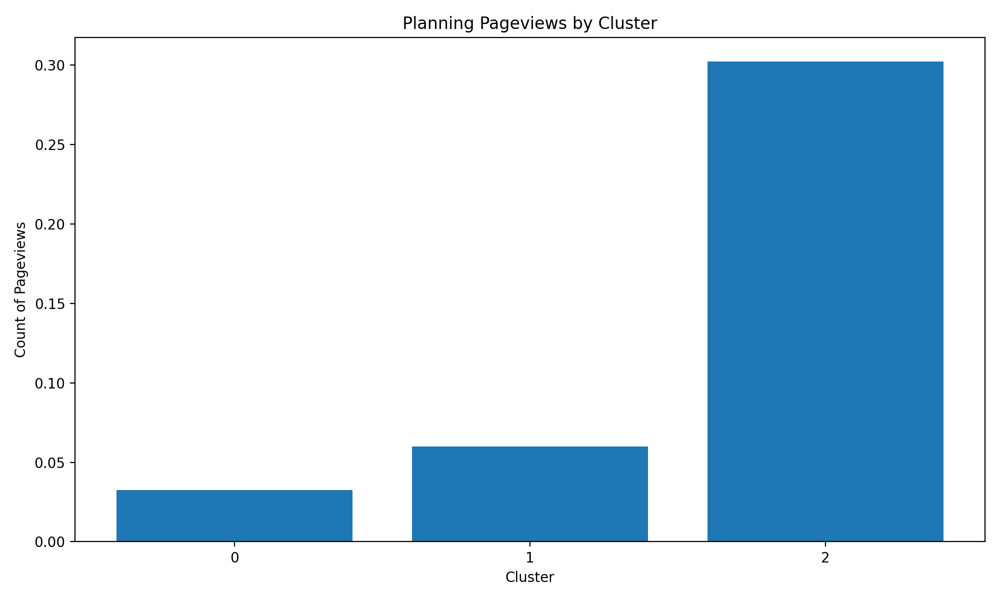

In [ ]:
planningpageviews_by_cluster = merged_data.groupby('cluster')['total_planningcare_pageviews'].mean().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(planningpageviews_by_cluster['cluster'], planningpageviews_by_cluster['total_planningcare_pageviews'])
plt.title('Planning Pageviews by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(dealerlocatorpageviews_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
pro_locations_pageviews_by_cluster = merged_data.groupby('cluster')['total_pro_locations_pageviews'].sum().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(pro_locations_pageviews_by_cluster['cluster'], pro_locations_pageviews_by_cluster['total_pro_locations_pageviews'])
plt.title('Pro Locations Pageviews by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(dealerlocatorpageviews_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
design_palette_pageviews_by_cluster = merged_data.groupby('cluster')['total_design_palette_pageviews'].sum().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(design_palette_pageviews_by_cluster['cluster'], design_palette_pageviews_by_cluster['total_design_palette_pageviews'])
plt.title('avg design palette Pageviews by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(dealerlocatorpageviews_by_cluster['cluster'])
plt.tight_layout()
plt.show()

In [ ]:
cambriastyle_pageviews_by_cluster = merged_data.groupby('cluster')['total_cambriastyle_pageviews'].sum().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(cambriastyle_pageviews_by_cluster['cluster'], cambriastyle_pageviews_by_cluster['total_cambriastyle_pageviews'])
plt.title('avg cambria style Pageviews by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(cambriastyle_pageviews_by_cluster['cluster'])
plt.tight_layout()
plt.show()

## Form Submissions

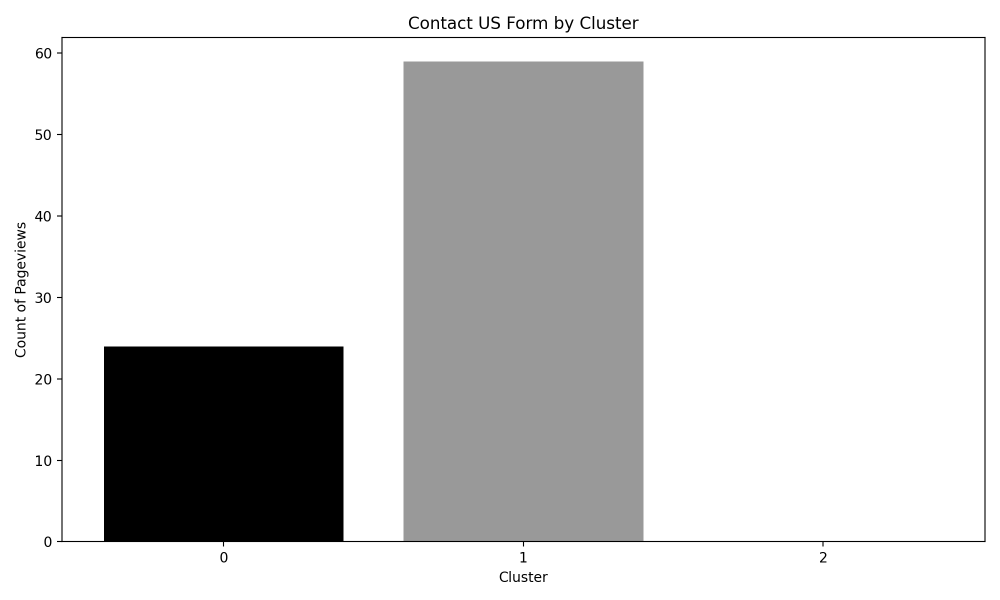

In [ ]:
contactus_by_cluster = merged_data.groupby('cluster')['contactus_form_submit'].sum().reset_index()
custom_colors = [ '#000000','#999999','#c59617']
# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(contactus_by_cluster['cluster'], contactus_by_cluster['contactus_form_submit'] ,color = custom_colors)
plt.title('Contact US Form by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(dealerlocatorpageviews_by_cluster['cluster'])
plt.tight_layout()
plt.show()

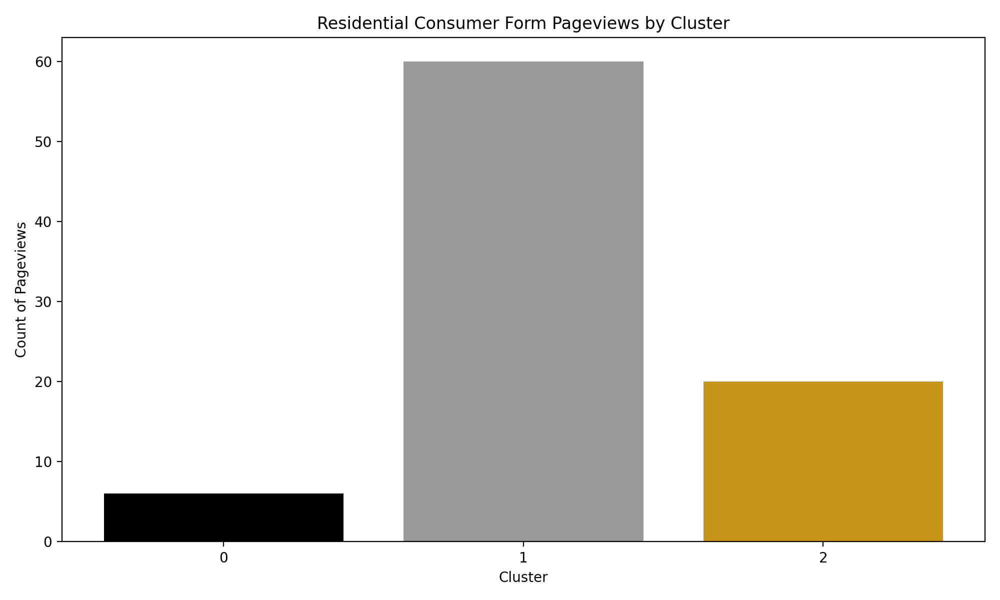

In [ ]:
residentailform_by_cluster = merged_data.groupby('cluster')['residentialconsumer_lead_form_submit'].sum().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(residentailform_by_cluster['cluster'], residentailform_by_cluster['residentialconsumer_lead_form_submit'], color = cluster_colors)
plt.title('Residential Consumer Form Pageviews by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(residentailform_by_cluster['cluster'])
plt.tight_layout()
plt.show()

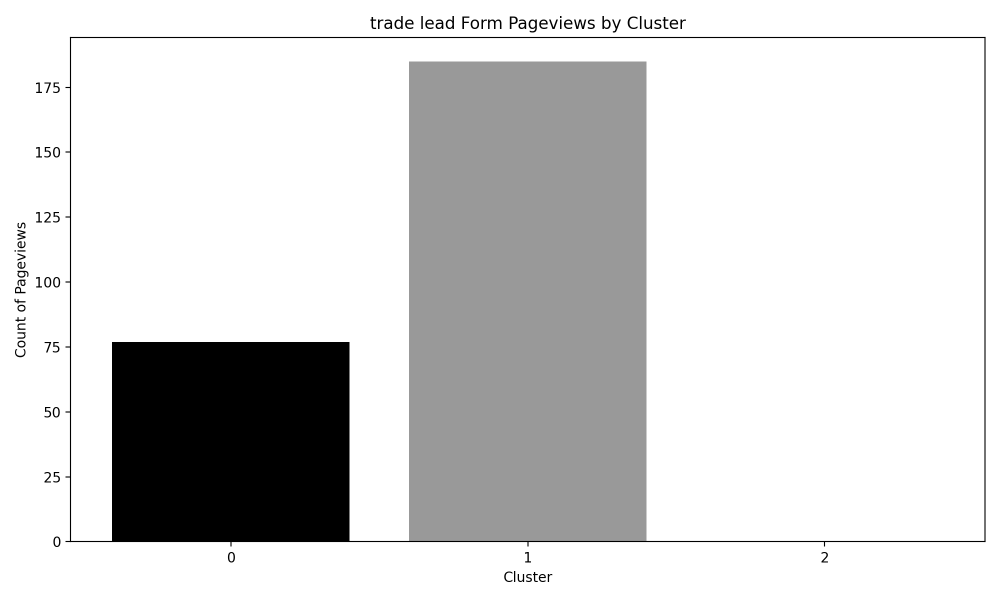

In [ ]:
trade_lead_by_cluster = merged_data.groupby('cluster')['trade_lead_form_submit'].sum().reset_index()

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(trade_lead_by_cluster['cluster'], trade_lead_by_cluster['trade_lead_form_submit'], color = cluster_colors)
plt.title('trade lead Form Pageviews by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Count of Pageviews')
plt.xticks(dealerlocatorpageviews_by_cluster['cluster'])
plt.tight_layout()
plt.show()

## Assigning Characteristics With GA4 Metrics

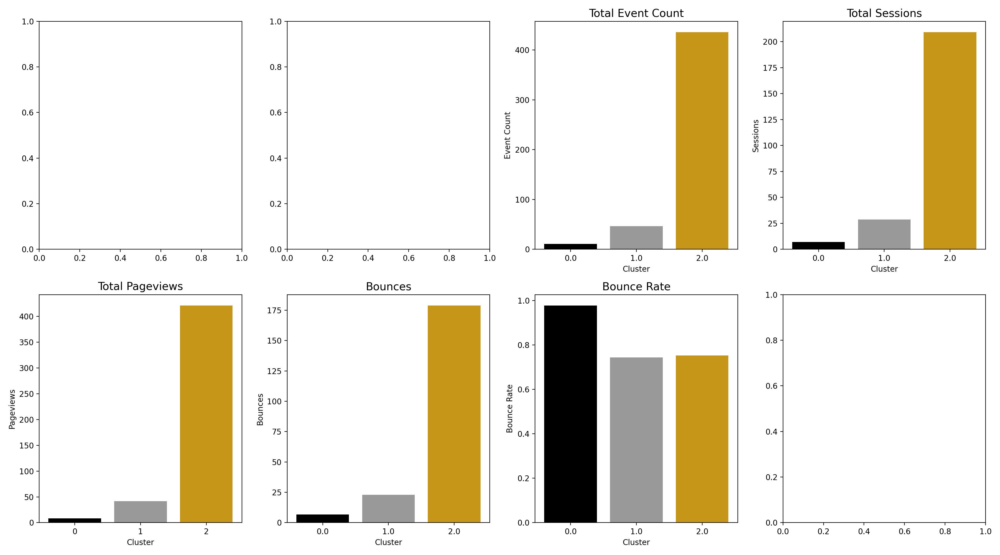

In [ ]:
total_eventcount = merged_data.groupby('cluster')['total_event_count'].mean().reset_index()
totalsessions = merged_data.groupby('cluster')['total_sessions'].mean().reset_index()
totalpageviews = merged_data.groupby('cluster')['total_pageviews'].mean().reset_index()
_bounce_rate = merged_data.groupby('cluster')['bounce_rate'].mean().reset_index()
totalbounces = merged_data.groupby('cluster')['bounces'].mean().reset_index()

fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(18, 10))
cluster_colors = ['#000000','#999999', '#c59617']

#axs[0, 0].bar(total_purchases_by_cluster['cluster'], total_purchases_by_cluster['total_purchases'], color=cluster_colors)
#axs[0, 0].set_title('Total Purchases', fontsize=14)
#axs[0, 0].set_xlabel('Cluster')
#axs[0, 0].set_ylabel('Purchases')
#axs[0, 0].set_xticks(total_purchases_by_cluster['cluster'])
#axs[0, 0].set_xticklabels(total_purchases_by_cluster['cluster'])
#axs[0, 0].axhline(y=0, color='black', linewidth=0.5)

#axs[0, 1].bar(total_pagecount['cluster'], total_pagecount['page_count'], color=cluster_colors)
#axs[0, 1].set_title('Total Page Count', fontsize=14)
#axs[0, 1].set_xlabel('Cluster')
#axs[0, 1].set_ylabel('Page Count')
#axs[0, 1].set_xticks(total_pagecount['cluster'])
#axs[0, 1].set_xticklabels(total_pagecount['cluster'])
#axs[0, 1].axhline(y=0, color='black', linewidth=0.5)

axs[0, 2].bar(total_eventcount['cluster'], total_eventcount['total_event_count'], color=cluster_colors)
axs[0, 2].set_title('Total Event Count', fontsize=14)
axs[0, 2].set_xlabel('Cluster')
axs[0, 2].set_ylabel('Event Count')
axs[0, 2].set_xticks(total_eventcount['cluster'])
axs[0, 2].set_xticklabels(total_eventcount['cluster'])
axs[0, 2].axhline(y=0, color='black', linewidth=0.5)

axs[0, 3].bar(totalsessions['cluster'], totalsessions['total_sessions'], color=cluster_colors)
axs[0, 3].set_title('Total Sessions', fontsize=14)
axs[0, 3].set_xlabel('Cluster')
axs[0, 3].set_ylabel('Sessions')
axs[0, 3].set_xticks(totalsessions['cluster'])
axs[0, 3].set_xticklabels(totalsessions['cluster'])
axs[0, 3].axhline(y=0, color='black', linewidth=0.5)

axs[1, 0].bar(totalpageviews['cluster'], totalpageviews['total_pageviews'], color=cluster_colors)
axs[1, 0].set_title('Total Pageviews', fontsize=14)
axs[1, 0].set_xlabel('Cluster')
axs[1, 0].set_ylabel('Pageviews')
axs[1, 0].set_xticks(totalpageviews['cluster'])
axs[1, 0].axhline(y=0, color='black', linewidth=0.5)

axs[1, 1].bar(totalbounces['cluster'], totalbounces['bounces'], color=cluster_colors)
axs[1, 1].set_title('Bounces', fontsize=14)
axs[1, 1].set_xlabel('Cluster')
axs[1, 1].set_ylabel('Bounces')
axs[1, 1].set_xticks(totalbounces['cluster'])
axs[1, 1].set_xticklabels(totalbounces['cluster'])
axs[1, 1].axhline(y=0, color='black', linewidth=0.5)

axs[1, 2].bar(_bounce_rate['cluster'], _bounce_rate['bounce_rate'], color=cluster_colors)
axs[1, 2].set_title('Bounce Rate', fontsize=14)
axs[1, 2].set_xlabel('Cluster')
axs[1, 2].set_ylabel('Bounce Rate')
axs[1, 2].set_xticks(_bounce_rate['cluster'])
axs[1, 2].set_xticklabels(_bounce_rate['cluster'])
axs[1, 2].axhline(y=0, color='black', linewidth=0.5)

plt.tight_layout()
plt.show()




In [ ]:
import pandas as pd
from sklearn.datasets import load_iris
import matplotlib.pyplot as plt
from pandas.plotting import radviz

data = merged_data(as_frame=True)
df3 = data['data']
df3['target'] = data['target']

plt.figure(figsize=(10, 6), dpi=600)
radviz(df3, 'target')
plt.show()

TypeError: 'DataFrame' object is not callable

### Summed Columns

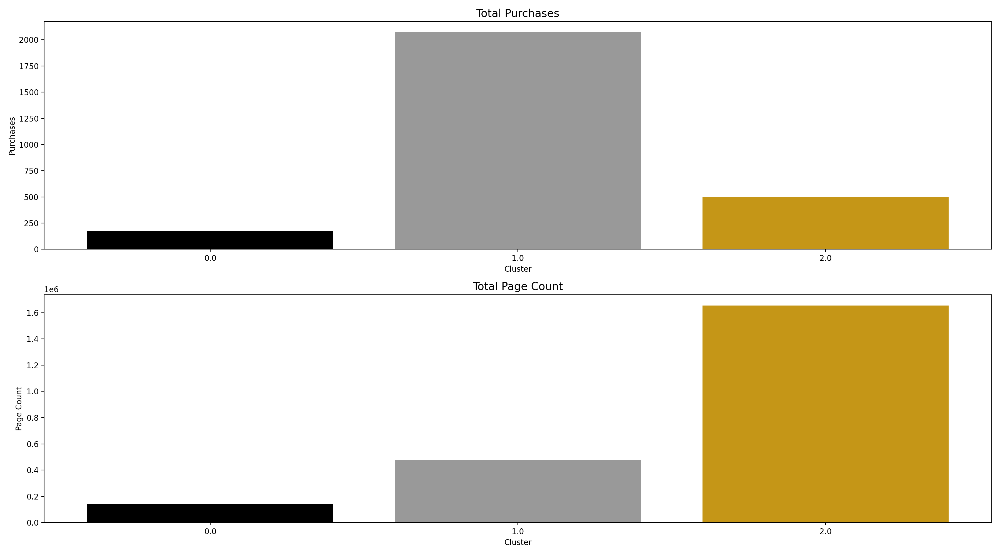

In [ ]:
total_purchases_by_cluster = merged_data.groupby('cluster')['total_purchases'].sum().reset_index()
total_pagecount = merged_data.groupby('cluster')['page_count'].sum().reset_index()

fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(18, 10))
cluster_colors = [ '#000000','#999999', '#c59617']

axs[0].bar(total_purchases_by_cluster['cluster'], total_purchases_by_cluster['total_purchases'], color=cluster_colors)
axs[0].set_title('Total Purchases', fontsize=14)
axs[0].set_xlabel('Cluster')
axs[0].set_ylabel('Purchases')
axs[0].set_xticks(total_purchases_by_cluster['cluster'])
axs[0].set_xticklabels(total_purchases_by_cluster['cluster'])
axs[0].axhline(y=0, color='black', linewidth=0.5)

axs[1].bar(total_pagecount['cluster'], total_pagecount['page_count'], color=cluster_colors)
axs[1].set_title('Total Page Count', fontsize=14)
axs[1].set_xlabel('Cluster')
axs[1].set_ylabel('Page Count')
axs[1].set_xticks(total_pagecount['cluster'])
axs[1].set_xticklabels(total_pagecount['cluster'])
axs[1].axhline(y=0, color='black', linewidth=0.5)

plt.tight_layout()
plt.show()

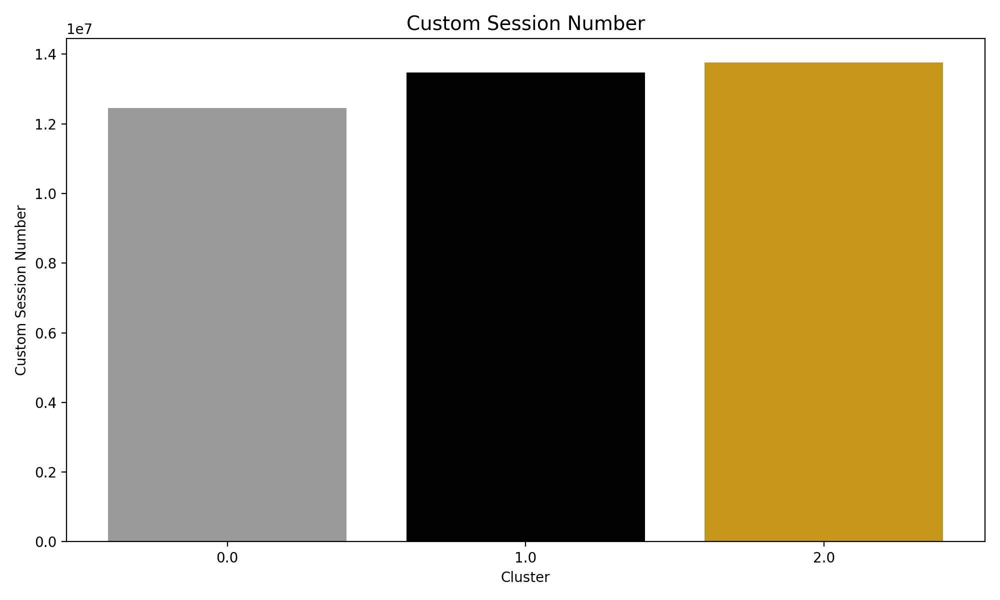

In [ ]:
custom_session_number_by_cluster = merged_data.groupby('cluster')['custom_session_number'].sum().reset_index()
fig, ax = plt.subplots(figsize=(10, 6))
cluster_colors = ['#999999', '#000000', '#c59617']

ax.bar(custom_session_number_by_cluster['cluster'], custom_session_number_by_cluster['custom_session_number'], color=cluster_colors)
ax.set_title('Custom Session Number', fontsize=14)
ax.set_xlabel('Cluster')
ax.set_ylabel('Custom Session Number')
ax.set_xticks(custom_session_number_by_cluster['cluster'])
ax.set_xticklabels(custom_session_number_by_cluster['cluster'])

plt.tight_layout()
plt.show()


## Consumers

### Pageviews

Top level look into consumer pages

In [0]:
df_total_pageviews_consumers = merged_data.groupby('cluster').agg({   
#consumer
    'total_dealerlocator_pageviews': 'mean',
    'total_design_palette_pageviews': 'mean',
    'total_samples_pageviews': 'mean',
    'contactus_form_submit' : 'mean',
    'residentialconsumer_lead_form_submit' : 'mean',
    # brand new consumers?
    'total_cambriastyle_pageviews': 'mean',
    'total_inspiration_pageviews': 'mean',
    'total_samples_pageviews': 'mean',
   #consumer decisions
    'total_financebycambria_pageviews': 'mean',
    'total_planningcare_pageviews': 'mean',
    'total_galleries_pageviews': 'mean'
 }).reset_index()
df_total_pageviews_consumers = df_total_pageviews_consumers.applymap('{:,}'.format)
df_total_pageviews_consumers

### Engagement time

In [ ]:
df_consumer_engagement_time = merged_data.groupby('cluster').agg({ 
#consumer
    'avg_time_on_design_pages': 'mean',
    'dealerlocator_pages_engagement_time': 'mean',
    'design_palette_pages_engagement_time': 'mean',
    'samples_pages_engagement_time': 'mean',   
   # new consumer
    'cambriastyle_pages_engagement_time': 'mean',
    'inspiration_pages_engagement_time': 'mean',
    'samples_pages_engagement_time': 'mean', 
    #consumer decisions
    'avg_time_on_decision_pages': 'mean',
    'financebycambria_pages_engagement_time': 'mean',
    'planningcare_pages_engagement_time': 'mean', 
    'galleries_pages_engagement_time': 'mean'
     }).reset_index()
df_consumer_engagement_time

## Professionals

### Pageviews

In [ ]:
df_total_pageviews_professional = merged_data.groupby('cluster').agg({ 
#trade
    'total_professionals_pageviews': 'sum',
    'total_commercial_pageviews': 'sum',
    'total_specify_pageviews': 'sum',
    'total_pro_locations_pageviews': 'sum',
    'total_case_studies_pageviews': 'sum',
    'trade_lead_form_submit' : 'sum',
    'contactus_form_submit' : 'sum',
    'total_cambriastyle_pageviews': 'sum',
    # designers
    'total_inspiration_pageviews': 'sum',
    'total_samples_pageviews': 'sum',
    'total_cambriastyle_pageviews': 'sum',
    'total_design_palette_pageviews': 'sum'
}).reset_index()
df_total_pageviews_professional = df_total_pageviews_professional.applymap('{:,}'.format)
df_total_pageviews_professional

### Engagement Time

In [ ]:
 df_pro_engagement_time = merged_data.groupby('cluster').agg({ 
 #trade
    'pro_pages_engagement_time': 'mean', 
    'commercial_pages_engagement_time': 'mean',
    'specify_pages_engagement_time': 'mean', 
    'case_studies_pages_engagement_time': 'mean',
    'pro_locations_pages_engagement_time': 'mean',
    #designers
    'inspiration_pages_engagement_time': 'mean',
    'samples_pages_engagement_time': 'mean', 
    'cambriastyle_pages_engagement_time': 'mean',
    'design_palette_pages_engagement_time': 'mean'
    }).reset_index()
df_pro_engagement_time

In [ ]:
df_res_time = merged_data.groupby('cluster').agg({
    'total_samples_pageviews' : 'sum', 
'total_galleries_pageviews' : 'sum',
'total_design_palette_pageviews': 'sum',
'total_inspiration_pageviews' : 'sum',
'total_case_studies_pageviews' : 'sum'
}).reset_index()
df_res_time

In [ ]:
    'total_cambriastyle_pageviews': 'sum',
    'total_samples_pageviews': 'sum',
    'total_pro_locations_pageviews': 'sum',
    'total_design_palette_pageviews': 'sum',
        'total_dealerlocator_pageviews': 'sum',
        

## Decisions pages 

we think they're usually visited by consumers 

In [ ]:
df_decisions_page = merged_data.groupby('cluster').agg({ 
'avg_time_on_decision_pages': 'mean',
'financebycambria_pages_engagement_time': 'mean',
'planningcare_pages_engagement_time': 'mean', 
'galleries_pages_engagement_time': 'mean'
}).reset_index()
df_decisions_page

# Mapping Clusters

In [ ]:
# URL of the US States GeoJSON file
url = "https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json"

# Load the GeoJSON file
us_states = gpd.read_file(url)
us_states['name'] = us_states['name'].replace('District of Columbia', 'District Of Columbia')

In [ ]:
data.columns

Index(['client_id', 'country', 'state', 'city', 'device', 'brand_name',
       'model_name', 'operating_system', 'operating_system_version',
       'total_event_count', 'total_sessions', 'total_pageviews',
       'total_purchases', 'total_trade_lead_form_submit',
       'total_residentialconsumer_lead_form_submit',
       'total_contactus_form_submit', 'total_dealerlocator_pageviews',
       'total_professionals_pageviews', 'total_commercial_pageviews',
       'total_specify_pageviews', 'total_case_studies_pageviews',
       'total_pro_locations_pageviews', 'total_design_palette_pageviews',
       'total_inspiration_pageviews', 'total_financebycambria_pageviews',
       'total_planningcare_pageviews', 'total_cambriastyle_pageviews',
       'total_style_pageviews', 'total_samples_pageviews',
       'total_galleries_pageviews', 'pro_pages_engagement_time',
       'commercial_pages_engagement_time', 'specify_pages_engagement_time',
       'case_studies_pages_engagement_time',
       'pro_

In [ ]:
# Load the long/lat data
state_coordinates = pd.read_excel("statelatlong.xlsx")

# Ensure the state names match between the two DataFrames
data['state'] = data['state'].apply(lambda x: str(x).title())
state_coordinates['State'] = state_coordinates['State'].apply(lambda x: str(x).title())

# Aggregate the metrics at the state level
metrics = ['total_event_count', 'total_sessions', 'total_pageviews','total_trade_lead_form_submit', 
            'total_residentialconsumer_lead_form_submit', 'total_contactus_form_submit', 'total_purchases', 
            'engaged_sessions']

aggregated_data = data.groupby(['state','cluster','engagement_level'])[metrics].sum().reset_index()

# Merge the aggregated data with the state coordinates
data_with_coordinates = pd.merge(aggregated_data, state_coordinates, left_on='state', right_on='State', how='left')

# For Mapping
data_with_coordinates = pd.merge(data_with_coordinates, us_states, left_on='state', right_on='name', how='left')

In [ ]:
# Drop rows with NaN values in 'Latitude' and 'Longitude'
data_with_coordinates.dropna(subset=['Latitude', 'Longitude'], inplace=True)
data_with_coordinates

# Save data as a CSV
data_with_coordinates.to_csv('data_with_coordinates.csv', index=False)

In [ ]:
# Convert 'geometry' column to str type
data_with_coordinates['geometry'] = data_with_coordinates['geometry'].astype(str)

# Assuming df is your DataFrame
data_with_coordinates['geometry'] = data_with_coordinates['geometry'].apply(wkt.loads)  # converting WKT to geometry

# Converting DataFrame to GeoDataFrame
gdf = gpd.GeoDataFrame(data_with_coordinates, geometry='geometry')

# Now convert GeoDataFrame to GeoJSON
gdf.to_file("output.json", driver="GeoJSON")
with open("output.json", "r") as file:
    geojson_data = json.load(file)

ParseException: Unknown type: 'NONE'


WKTReadingError: Could not create geometry because of errors while reading input.

In [ ]:
# Filter the data for a specific cluster
cluster0_data = data_with_coordinates[data_with_coordinates['cluster'] == 0]
cluster1_data = data_with_coordinates[data_with_coordinates['cluster'] == 1]
cluster2_data = data_with_coordinates[data_with_coordinates['cluster'] == 2]

In [ ]:
# Initialize the map centered at the center of the U.S.
m = folium.Map(location=[37.8, -96], zoom_start=5, titles = None, overlay = False)

# Color Mapping
colormap = cm.linear.RdYlGn_09.to_step(30)
colormap.caption = "Index"
colormap.add_to(m)

### Cluster 0 ###

c0_fg1 = folium.FeatureGroup(name='Cluster 0 - Event Count',overlay=False).add_to(m)
c0_fg2 = folium.FeatureGroup(name='Cluster 0 - Sessions',overlay=False).add_to(m)
c0_fg3 = folium.FeatureGroup(name='Cluster 0 - Pageviews',overlay=False).add_to(m)
c0_fg4 = folium.FeatureGroup(name='Cluster 0 - Sample Purchases',overlay=False).add_to(m)
c0_fg5 = folium.FeatureGroup(name='Cluster 0 - Trade Leads',overlay=False).add_to(m)
c0_fg6 = folium.FeatureGroup(name='Cluster 0 - ResidentialConsumer Leads',overlay=False).add_to(m)
c0_fg7 = folium.FeatureGroup(name='Cluster 0 - Contact Us Submits',overlay=False).add_to(m)
c0_fg8 = folium.FeatureGroup(name='Cluster 0 - Engaged Sessions',overlay=False).add_to(m)

#CHOROPLETH 1
c0_cho_1 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster0_data,
                          columns=['State','total_event_count'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 0 - Event Count",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c0_fg1)

#CHOROPLETH 2
c0_cho_2 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster0_data,
                          columns=['State','total_sessions'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 0 - Sessions",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c0_fg2)

#CHOROPLETH 3
c0_cho_3 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster0_data,
                          columns=['State','total_pageviews'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Total Pageviews",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c0_fg3)

#CHOROPLETH 4
c0_cho_4 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster0_data,
                          columns=['State','total_trade_lead_form_submit'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 0 - Trade Leads",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c0_fg4)

#CHOROPLETH 5
c0_cho_5 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster0_data,
                          columns=['State','total_residentialconsumer_lead_form_submit'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Total ResidentialConsumer Leads",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c0_fg5)

#CHOROPLETH 6
c0_cho_6 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster0_data,
                          columns=['State','total_contactus_form_submit'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 0 - Contact Us Submits",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c0_fg6)

#CHOROPLETH 7
c0_cho_7 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster0_data,
                          columns=['State','total_purchases'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Total Sample Purchases",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c0_fg7)

#CHOROPLETH 8
c0_cho_8 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster0_data,
                          columns=['State','engaged_sessions'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 0 - Engaged Sessions",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c0_fg8)

### Cluster 1 ###

c1_fg1 = folium.FeatureGroup(name='Cluster 1 - Event Count',overlay=False).add_to(m)
c1_fg2 = folium.FeatureGroup(name='Cluster 1 - Sessions',overlay=False).add_to(m)
c1_fg3 = folium.FeatureGroup(name='Cluster 1 - Pageviews',overlay=False).add_to(m)
c1_fg4 = folium.FeatureGroup(name='Cluster 1 - Sample Purchases',overlay=False).add_to(m)
c1_fg5 = folium.FeatureGroup(name='Cluster 1 - Trade Leads',overlay=False).add_to(m)
c1_fg6 = folium.FeatureGroup(name='Cluster 1 - ResidentialConsumer Leads',overlay=False).add_to(m)
c1_fg7 = folium.FeatureGroup(name='Cluster 1 - Contact Us Submits',overlay=False).add_to(m)
c1_fg8 = folium.FeatureGroup(name='Cluster 1 - Engaged Sessions',overlay=False).add_to(m)

#CHOROPLETH 1
c1_cho_1 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster1_data,
                          columns=['State','total_event_count'], 
                          key_on='feature.properties.name',
                          #fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 1 - Event Count",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c1_fg1)

#CHOROPLETH 2
c1_cho_2 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster1_data,
                          columns=['State','total_sessions'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 1 - Sessions",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c1_fg2)

#CHOROPLETH 3
c1_cho_3 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster1_data,
                          columns=['State','total_pageviews'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Total Pageviews",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c1_fg3)

#CHOROPLETH 4
c1_cho_4 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster1_data,
                          columns=['State','total_trade_lead_form_submit'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 1 - Trade Leads",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c1_fg4)

#CHOROPLETH 5
c1_cho_5 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster1_data,
                          columns=['State','total_residentialconsumer_lead_form_submit'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Total ResidentialConsumer Leads",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c1_fg5)

#CHOROPLETH 6
c1_cho_6 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster1_data,
                          columns=['State','total_contactus_form_submit'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 1 - Contact Us Submits",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c1_fg6)

#CHOROPLETH 7
c1_cho_7 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster1_data,
                          columns=['State','total_purchases'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Total Sample Purchases",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c1_fg7)

#CHOROPLETH 8
c1_cho_8 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster1_data,
                          columns=['State','engaged_sessions'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 1 - Engaged Sessions",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c1_fg8)

### Cluster 2 ###

c2_fg1 = folium.FeatureGroup(name='Cluster 2 -Event Count',overlay=False).add_to(m)
c2_fg2 = folium.FeatureGroup(name='Cluster 2 -Sessions',overlay=False).add_to(m)
c2_fg3 = folium.FeatureGroup(name='Cluster 2 -Pageviews',overlay=False).add_to(m)
c2_fg4 = folium.FeatureGroup(name='Cluster 2 -Sample Purchases',overlay=False).add_to(m)
c2_fg5 = folium.FeatureGroup(name='Cluster 2 -Trade Leads',overlay=False).add_to(m)
c2_fg6 = folium.FeatureGroup(name='Cluster 2 -ResidentialConsumer Leads',overlay=False).add_to(m)
c2_fg7 = folium.FeatureGroup(name='Cluster 2 -Contact Us Submits',overlay=False).add_to(m)
c2_fg8 = folium.FeatureGroup(name='Cluster 2 -Engaged Sessions',overlay=False).add_to(m)

#CHOROPLETH 1
c2_cho_1 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster2_data,
                          columns=['State','total_event_count'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 2 -Event Count",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c2_fg1)

#CHOROPLETH 2
c2_cho_2 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster2_data,
                          columns=['State','total_sessions'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 2 -Sessions",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c2_fg2)

#CHOROPLETH 3
c2_cho_3 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster2_data,
                          columns=['State','total_pageviews'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Total Pageviews",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c2_fg3)

#CHOROPLETH 4
c2_cho_4 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster2_data,
                          columns=['State','total_trade_lead_form_submit'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 2 -Trade Leads",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c2_fg4)

#CHOROPLETH 5
c2_cho_5 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster2_data,
                          columns=['State','total_residentialconsumer_lead_form_submit'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Total ResidentialConsumer Leads",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c2_fg5)

#CHOROPLETH 6
c2_cho_6 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster2_data,
                          columns=['State','total_contactus_form_submit'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 2 -Contact Us Submits",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c2_fg6)

#CHOROPLETH 7
c2_cho_7 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster2_data,
                          columns=['State','total_purchases'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Total Sample Purchases",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c2_fg7)

#CHOROPLETH 8
c2_cho_8 = folium.Choropleth(geo_data='https://raw.githubusercontent.com/PublicaMundi/MappingAPI/master/data/geojson/us-states.json',
                          data=cluster2_data,
                          columns=['State','engaged_sessions'], 
                          key_on='feature.properties.name',
                          fill_color='RdYlGn',
                          fill_opacity=0.7, 
                          line_opacity=0.5,
                          legend_name="CUSA X Clusters",
                          legend=True,              
                          Highlight=True,
                          name="Cluster 2 -Engaged Sessions",
                          show=True,
                          overlay=False,
                          nan_fill_color = "White"
                          ).geojson.add_to(c2_fg8)


# Add hover functionality
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

Tooltip_Layer = folium.features.GeoJson(
    data = geojson_data,
    style_function=style_function, 
    control=False,
    #highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['total_event_count', 'total_sessions', 'total_pageviews','total_trade_lead_form_submit', 
            'total_residentialconsumer_lead_form_submit', 'total_contactus_form_submit', 'total_purchases', 
            'engaged_sessions'],
        aliases=['Total Event', 'Total Sessions', 'Total Pageviews','Total Trade Leads', 
            'Total ResidentialConsumer Leads', 'Total Contact Us Forms', 'Total Shop Purchases', 
            'Engaged Sessions'],
        localize=False,
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)
m.add_child(Tooltip_Layer)
m.keep_in_front(Tooltip_Layer)

# Add Dark and Light Mode 
folium.TileLayer('cartodbdark_matter',overlay=True,name="View in Dark Mode").add_to(m)
folium.TileLayer('cartodbpositron',overlay=True,name="View in Light Mode").add_to(m)

# Layer controller. 
folium.LayerControl(collapsed=False).add_to(m)

# Save the map to an HTML file
m.save('interactive_map.html')

m

# Apply Clusters to Page table

# EDA on Pagetable

# Apply Characteristics

## Explore the Data

## Dependencies

In [ ]:
%watermark --iversions

matplotlib: 3.6.0
IPython   : 8.5.0
pandas    : 2.0.3
plotnine  : 0.12.1
psycopg2  : 2.9.4 (dt dec pq3 ext lo64)
sentry_sdk: 1.24.0
seaborn   : 0.12.1
folium    : 0.13.0
numpy     : 1.23.4
geopandas : 0.11.1
branca    : 0.5.0



<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=c07d89ac-5a96-494b-a3e5-c0b991068de9' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>